In [43]:
import matplotlib as mpl
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman']
# Publication-ready defaults for larger text and high-resolution exports
mpl.rcParams['font.size'] = 16
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['figure.dpi'] = 180
mpl.rcParams['savefig.dpi'] = 600
mpl.rcParams['savefig.bbox'] = 'tight'

In [44]:
import pandas as pd
import json
import numpy as np

with open('box_and_block_timeseries_data.json', 'r') as f:
    hand_timeseries = json.load(f)


dose_order = pd.read_excel('BehaviouralData/hc_randomisation.xlsx')

dose_order['ppt_id'] = dose_order['ppt_id'].str.replace('Psy_HC_', 'HC')

participants = set(hand_timeseries.keys())

participant_with_20mg = dose_order.loc[dose_order['dose_alc_manual'].str.contains('20mg'), 'ppt_id'].values 
participant_with_15mg = participants - set(participant_with_20mg)

hand_timeseries_20mg = {pid: hand_timeseries[pid] for pid in participant_with_20mg if pid in hand_timeseries and len(hand_timeseries[pid]) > 0}
hand_timeseries_15mg = {pid: hand_timeseries[pid] for pid in participant_with_15mg if pid in hand_timeseries and len(hand_timeseries[pid]) > 0}

print(f"Participants with 20mg dose: {hand_timeseries_20mg.keys()}")
print(f"Participants with 15mg dose: {hand_timeseries_15mg.keys()}")

# Get participants that have BOTH Baseline and Dose with valid 'hand' timeseries (no NaNs)
participants_with_both = sorted([
    pid for pid, pdata in hand_timeseries.items()
    if all(
        (cond in pdata) and ('hand' in pdata[cond]) and not np.isnan(np.array(pdata[cond]['hand'])).any()
        for cond in ['Baseline', 'Dose']
    )
])
print(participants_with_both)

Participants with 20mg dose: dict_keys(['HC08', 'HC10', 'HC11', 'HC12', 'HC13', 'HC14'])
Participants with 15mg dose: dict_keys(['HC03', 'HC02', 'HC09', 'HC01', 'HC04'])
['HC01', 'HC02', 'HC03', 'HC04', 'HC08', 'HC09', 'HC10', 'HC11', 'HC12', 'HC13']


In [45]:
participant_with_20mg

array(['HC08', 'HC10', 'HC11', 'HC12', 'HC13', 'HC14'], dtype=object)

# Full hand dimensionality analysis

In [46]:
# =============================================================================
# Full Hand Dimensionality Analysis: PCA, Clustering, and Pattern Discovery
# =============================================================================

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import ttest_ind, mannwhitneyu
import seaborn as sns
import numpy as np

# Prepare data from hand_timeseries
# Each participant has Baseline and Dose conditions with shape (350, 21, 3)

def prepare_data_for_dimensionality_analysis(hand_timeseries, participant_with_20mg=None):
    """
    Prepare hand tracking data for dimensionality analysis.
    Flattens the (time, landmarks, coords) data into feature vectors.
    
    Returns multiple representations:
    1. Full trajectory flattened (for global patterns)
    2. Per-frame flattened (for temporal dynamics)
    3. Metadata arrays for labeling
    """
    
    # Lists to collect data
    trajectory_data = []  # Full trajectory per participant/condition
    frame_data = []       # Per-frame data
    labels = []           # Condition labels (Baseline/Dose)
    participant_ids = []  # Participant IDs
    dose_groups = []      # 15mg or 20mg
    
    for pid in hand_timeseries.keys():
        for condition in ['Baseline', 'Dose']:
            if condition in hand_timeseries[pid]:
                hand = np.array(hand_timeseries[pid][condition]['hand'])  # (350, 21, 3)
                
                # Check for NaN values
                if np.isnan(hand).any():
                    print(f"Warning: NaN values found in {pid} {condition}, skipping")
                    #Print frames with NaN values
                    nan_frames = np.unique(np.where(np.isnan(hand))[0])
                    if nan_frames.size < 50:
                        print(f"Frames with NaN values: {nan_frames}")
                        #landmarks and coords with NaN values
                        for frame in nan_frames:
                            nan_landmarks = np.unique(np.where(np.isnan(hand[frame]))[0])
                            print(f"  Frame {frame} has NaN in landmarks: {nan_landmarks}")
                    else:
                        print(f"More than 50 frames with NaN values, not printing all.")
                    continue
                
                n_frames, n_landmarks, n_coords = np.shape(hand)
                
                # Full trajectory: flatten to (350*21*3,) = (22050,)
                traj_flat = hand.flatten()
                trajectory_data.append(traj_flat)
                
                # Per-frame: each frame flattened to (21*3,) = (63,)
                for t in range(n_frames):
                    frame_flat = hand[t].flatten()
                    frame_data.append(frame_flat)
                
                labels.append(condition)
                participant_ids.append(pid)
                dose_group = "20mg" if pid in participant_with_20mg else "15mg"
                dose_groups.append(dose_group)
    
    # Convert to numpy arrays
    trajectory_data = np.array(trajectory_data)
    frame_data = np.array(frame_data)
    labels = np.array(labels)
    participant_ids = np.array(participant_ids)
    dose_groups = np.array(dose_groups)
    
    return {
        'trajectory': trajectory_data,
        'frame': frame_data,
        'labels': labels,
        'participant_ids': participant_ids,
        'dose_groups': dose_groups
    }





## 1. Principal Component Analysis - Full Trajectory Space
Analyze the entire movement trajectory per participant/condition in the high-dimensional space.

More than 50 frames with NaN values, not printing all.
Components needed for 90% variance: 11
Components needed for 95% variance: 15
Components needed for 99% variance: 19


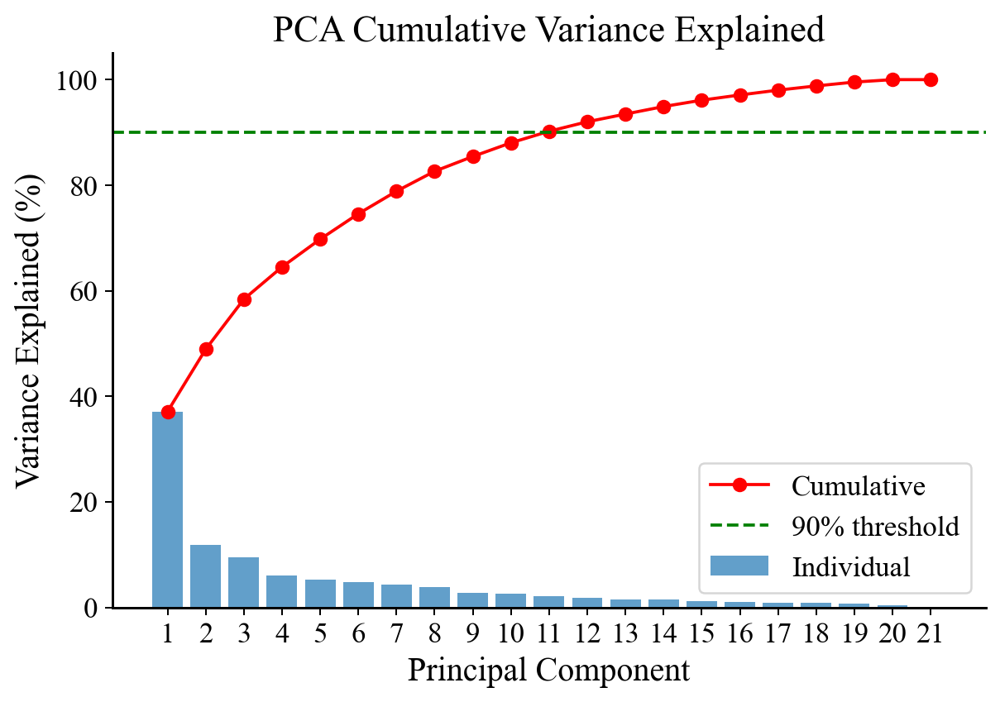

In [47]:
import matplotlib.pyplot as plt

# =============================================================================
# PCA on Trajectory Data of all 21 landmarks over Time
# =============================================================================


analysis_data = prepare_data_for_dimensionality_analysis(hand_timeseries, hand_timeseries_20mg.keys())


# Standardize the trajectory data
scaler = StandardScaler()
X_traj_scaled = scaler.fit_transform(analysis_data['trajectory'])

# Fit PCA - keep all components for analysis
pca_traj = PCA()
X_traj_pca = pca_traj.fit_transform(X_traj_scaled)

# Variance explained
var_explained = pca_traj.explained_variance_ratio_
cum_var_explained = np.cumsum(var_explained)

# Plot variance explained
plt.figure(figsize=(7, 5))

plt.bar(range(1, len(var_explained)+1), var_explained * 100, alpha=0.7, label='Individual')
plt.plot(range(1, len(cum_var_explained)+1), cum_var_explained * 100, 'ro-', label='Cumulative')
plt.axhline(y=90, color='g', linestyle='--', label='90% threshold')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained (%)')
plt.title('PCA Cumulative Variance Explained')
plt.legend()
plt.xticks(range(1, len(var_explained)+1))

# Number of components to reach thresholds
n_90 = np.argmax(cum_var_explained >= 0.90) + 1
n_95 = np.argmax(cum_var_explained >= 0.95) + 1
n_99 = np.argmax(cum_var_explained >= 0.99) + 1
print(f"Components needed for 90% variance: {n_90}")
print(f"Components needed for 95% variance: {n_95}")
print(f"Components needed for 99% variance: {n_99}")


plt.tight_layout()
plt.savefig('plots/pca_cumalative_variance.png', dpi=600, bbox_inches='tight')
plt.show()

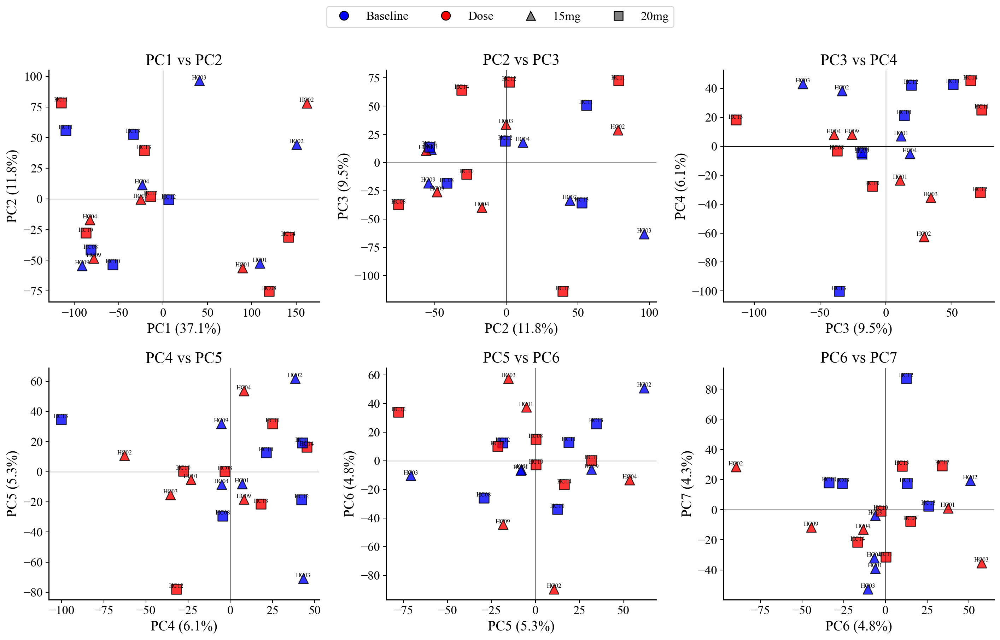


Statistical Tests: Baseline vs Dose in PC Space

PC1 (37.10% var):
  Baseline mean: -8.95 ± 82.08
  Dose mean: 8.14 ± 96.71
  T-test p-value: 0.6842 
  Mann-Whitney p-value: 0.7513 

PC2 (11.81% var):
  Baseline mean: 5.81 ± 52.27
  Dose mean: -5.28 ± 49.28
  T-test p-value: 0.6397 
  Mann-Whitney p-value: 0.6985 

PC3 (9.49% var):
  Baseline mean: -5.49 ± 32.13
  Dose mean: 4.99 ± 54.81
  T-test p-value: 0.6213 
  Mann-Whitney p-value: 0.5974 

PC4 (6.11% var):
  Baseline mean: 7.97 ± 41.17
  Dose mean: -7.25 ± 30.31
  T-test p-value: 0.3676 
  Mann-Whitney p-value: 0.3072 

PC5 (5.26% var):
  Baseline mean: 2.50 ± 35.89
  Dose mean: -2.27 ± 32.12
  T-test p-value: 0.7633 
  Mann-Whitney p-value: 0.7513 

PC6 (4.82% var):
  Baseline mean: 1.28 ± 23.68
  Dose mean: -1.16 ± 38.92
  T-test p-value: 0.8720 
  Mann-Whitney p-value: 0.8603 

PC7 (4.28% var):
  Baseline mean: 3.41 ± 37.60
  Dose mean: -3.10 ± 22.26
  T-test p-value: 0.6480 
  Mann-Whitney p-value: 0.8603 

PC8 (3.78% var):


In [48]:
# =============================================================================
# Explore Multiple PC Pairs - Including Low-Variance Components
# =============================================================================
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', label='Baseline', markerfacecolor='blue', markersize=10, markeredgecolor='black'),
    plt.Line2D([0], [0], marker='o', color='w', label='Dose', markerfacecolor='red', markersize=10, markeredgecolor='black'),
    plt.Line2D([0], [0], marker='^', color='w', label='15mg', markerfacecolor='grey', markersize=10, markeredgecolor='black'),
    plt.Line2D([0], [0], marker='s', color='w', label='20mg', markerfacecolor='grey', markersize=10, markeredgecolor='black'),
]
markers = {'15mg': '^', '20mg': 's'}
colors = {'Baseline': 'blue', 'Dose': 'red'}

# Check multiple PC combinations for separation between conditions
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

pc_pairs = [(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6)]

for ax, (pc_a, pc_b) in zip(axes.flatten(), pc_pairs):
    for i in range(len(X_traj_pca)):
        condition = analysis_data['labels'][i]
        dose = analysis_data['dose_groups'][i]
        pid = analysis_data['participant_ids'][i]
        ax.scatter(X_traj_pca[i, pc_a], X_traj_pca[i, pc_b], 
                   c=colors[condition], marker=markers[dose], s=120, alpha=0.8,
                   edgecolors='black', linewidths=1)
        ax.annotate(pid, (X_traj_pca[i, pc_a], X_traj_pca[i, pc_b]), 
                   fontsize=7, ha='center', va='bottom')
    
    ax.set_xlabel(f'PC{pc_a+1} ({var_explained[pc_a]*100:.1f}%)')
    ax.set_ylabel(f'PC{pc_b+1} ({var_explained[pc_b]*100:.1f}%)')
    ax.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
    ax.axvline(x=0, color='k', linestyle='-', linewidth=0.5)
    ax.set_title(f'PC{pc_a+1} vs PC{pc_b+1}')

# Add shared legend
fig.legend(handles=legend_elements, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.02))
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('plots/pca_multiple_components.png', dpi=600, bbox_inches='tight')
plt.show()

# Statistical tests for condition separation in each PC
print("\n" + "="*60)
print("Statistical Tests: Baseline vs Dose in PC Space")
print("="*60)

baseline_mask = analysis_data['labels'] == 'Baseline'
dose_mask = analysis_data['labels'] == 'Dose'

for pc in range(min(8, X_traj_pca.shape[1])):
    baseline_vals = X_traj_pca[baseline_mask, pc]
    dose_vals = X_traj_pca[dose_mask, pc]
    
    # T-test
    t_stat, p_val = ttest_ind(baseline_vals, dose_vals)
    # Mann-Whitney U (non-parametric)
    u_stat, p_val_mw = mannwhitneyu(baseline_vals, dose_vals, alternative='two-sided')
    
    print(f"\nPC{pc+1} ({var_explained[pc]*100:.2f}% var):")
    print(f"  Baseline mean: {np.mean(baseline_vals):.2f} ± {np.std(baseline_vals):.2f}")
    print(f"  Dose mean: {np.mean(dose_vals):.2f} ± {np.std(dose_vals):.2f}")
    print(f"  T-test p-value: {p_val:.4f} {'*' if p_val < 0.05 else ''}")
    print(f"  Mann-Whitney p-value: {p_val_mw:.4f} {'*' if p_val_mw < 0.05 else ''}")

### Bayesian difference analysis

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes

def get_rotation_matrix_to_align_vector(v_current, v_target):
    """
    Returns the rotation matrix that rotates v_current to align with v_target.
    Uses the Rodrigues rotation formula.
    """
    v_current = v_current / np.linalg.norm(v_current)
    v_target = v_target / np.linalg.norm(v_target)
    
    cross_prod = np.cross(v_current, v_target)
    dot_prod = np.dot(v_current, v_target)
    
    if np.linalg.norm(cross_prod) < 1e-6:
        # Vectors are already aligned
        return np.eye(3)
        
    s = np.linalg.norm(cross_prod)
    c = dot_prod
    
    # Skew-symmetric cross-product matrix
    vx = np.array([
        [0, -cross_prod[2], cross_prod[1]],
        [cross_prod[2], 0, -cross_prod[0]],
        [-cross_prod[1], cross_prod[0], 0]
    ])
    
    R = np.eye(3) + vx + (vx @ vx) * ((1 - c) / (s**2))
    return R

def anatomical_hand_alignment(trajectory_data):
    """
    Aligns hand data to a rigid anatomical reference frame (The Palm).
    
    Revised Definition for Stability:
    1. Origin: Wrist (Index 0)
    2. Primary Axis (Y): Wrist -> Middle MCP (Index 9)
    3. Plane Definition: Wrist, Index MCP (5), Pinky MCP (17)
    4. Normal (Z): Cross product of (Wrist->Index) and (Wrist->Pinky) is stable.
       Alternatively: Cross(X_temp, Y) where X_temp is Wrist->Pinky direction.
    """
    n_frames, n_landmarks, n_dims = trajectory_data.shape
    aligned_data = np.zeros_like(trajectory_data)
    
    for i in range(n_frames):
        frame = trajectory_data[i].copy()
        
        # 1. TRANSLATION
        wrist_pos = frame[0]
        frame_centered = frame - wrist_pos
        
        # 2. DEFINE AXES
        # Y-axis: Longitudinal axis of the hand (Wrist -> Middle MCP)
        v_y = frame_centered[9] 
        v_y = v_y / np.linalg.norm(v_y)
        
        # Helper: Wrist -> Pinky MCP (Index 17) - Use this for a stable plane
        v_pinky = frame_centered[17]
        v_pinky = v_pinky / np.linalg.norm(v_pinky)

        # X-axis (approximate): Cross product of Y and Pinky vector
        # This points roughly "Right" (for a right hand) or "Left" (for left hand)
        v_x_temp = np.cross(v_y, v_pinky)
        v_x_temp = v_x_temp / np.linalg.norm(v_x_temp)
        
        # Z-axis: Normal to the palm (Orthogonal to X_temp and Y)
        # Re-crossing ensures orthogonality
        v_z = np.cross(v_x_temp, v_y)
        v_z = v_z / np.linalg.norm(v_z)
        
        # Final X-axis: Orthogonal to Y and Z
        v_x = np.cross(v_y, v_z)
        v_x = v_x / np.linalg.norm(v_x)
        
        # 3. ROTATION
        # Project points onto new basis
        R = np.vstack([v_x, v_y, v_z]) # Shape (3,3)
        frame_aligned = np.dot(frame_centered, R.T)
        
        aligned_data[i] = frame_aligned
        
    return aligned_data
def calculate_participation_ratio(covariance_matrix):
    """Calculates continuous effective dimensionality."""
    eigenvalues = np.linalg.eigvalsh(covariance_matrix)
    # Filter small negative values from numerical error
    eigenvalues = eigenvalues[eigenvalues > 0]
    return (np.sum(eigenvalues)**2) / np.sum(eigenvalues**2)

import numpy as np

def calculate_dynamic_rope(data_array, effect_size_threshold=0.1):
    """
    Calculates raw ROPE limits based on the standard deviation of the data 
    and a standardized effect size threshold (default 0.1 for negligible).
    """
    # Calculate SD of the observed metric
    std_dev = np.std(data_array, ddof=1)
    
    # Scale the standardized threshold by the raw SD
    limit = effect_size_threshold * std_dev
    
    return (-limit, limit)

def get_subspace_similarity(pca_base, pca_dose, n_comps=6):
    """
    Calculates subspace similarity between two PCA trajectory sets.
    
    Args:
        pca_base: Fitted PCA object for condition 1 (e.g., sklearn PCA)
        pca_dose: Fitted PCA object for condition 2
        n_comps: Number of components to use (k)
        
    Returns:
        dict: {
            "krzanowski_sum": Sum of squared cosines [0 to k],
            "rmsip": Root Mean Square Inner Product [0 to 1]
        }
    """
    # 1. Validation: Ensure we don't ask for more components than exist
    max_possible = min(len(pca_base.components_), len(pca_dose.components_))
    if n_comps > max_possible:
        print(f"Warning: n_comps ({n_comps}) > available components ({max_possible}). using {max_possible}.")
        n_comps = max_possible

    # 2. Get components (eigenvectors)
    # Shape: (n_features, n_comps)
    U_base = pca_base.components_[:n_comps].T
    U_dose = pca_dose.components_[:n_comps].T
    
    # 3. Calculate Cross-Correlation Matrix (M)
    # This represents the overlap of every base vector with every dose vector
    M = np.dot(U_base.T, U_dose)
    
    # 4. Calculate Krzanowski Sum (Sum of squared cosines)
    # Range: [0, n_comps]
    # S = trace(M * M.T) is equivalent to sum of squared elements of M
    krzanowski_sum = np.trace(np.dot(M, M.T))
    
    # 5. Calculate RMSIP
    # Range: [0, 1]
    # Formula: sqrt( Krzanowski_Sum / n_comps )
    rmsip = np.sqrt(krzanowski_sum / n_comps)
    
    return {
        "krzanowski_sum": krzanowski_sum, 
        "rmsip": rmsip
    }
def analyze_reconstruction_vaf(X_base, X_dose, n_comps):
    """
    Calculates how well the Baseline Subspace explains the Dose Data,
    normalized for amplitude differences.
    """
    # 1. Fit PCA to Baseline (Define the "Paper")
    pca_base = PCA(n_components=n_comps)
    pca_base.fit(X_base)
    
    # 2. Project Dose data onto Baseline Subspace
    # Transform: Project to latent space
    # Inverse: Project back to world space (on the "paper")
    X_dose_projected = pca_base.transform(X_dose)
    X_dose_reconstructed = pca_base.inverse_transform(X_dose_projected)
    
    # 3. Calculate Residuals (The distance "off the paper")
    residuals = X_dose - X_dose_reconstructed
    squared_error = np.sum(residuals**2)
    
    # 4. Calculate Total Variance of the DOSE data
    # (Centered sum of squares)
    total_variance = np.sum((X_dose - np.mean(X_dose, axis=0))**2)
    
    # 5. Calculate VAF (Variance Accounted For)
    # "How much of the Dose data fits on the Baseline paper?"
    vaf = 1 - (squared_error / total_variance)
    
    # --- AMPLITUDE CHECK ---
    # Compare the "size" of the movements
    # If > 1, Dose movement is larger. If < 1, Dose movement is smaller.
    var_base = np.trace(np.cov(X_base, rowvar=False))
    var_dose = np.trace(np.cov(X_dose, rowvar=False))
    amplitude_ratio = var_dose / var_base
    
    return vaf, amplitude_ratio
def analyze_dimensionality_changes(hand_timeseries, pids_with_both_conds, ego_centric=False):
    
    results = []
    
    print(f"Analyzing {len(pids_with_both_conds)} participants...")
    
    for pid in pids_with_both_conds:
        try:
            # 1. Get Data
            data_base = np.array(hand_timeseries[pid]['Baseline']['hand']) # (350, 21, 3)
            data_dose = np.array(hand_timeseries[pid]['Dose']['hand'])     # (350, 21, 3)
            
            # Flatten: (Frames, Features)
            X_base = data_base.reshape(data_base.shape[0], -1)
            X_dose = data_dose.reshape(data_dose.shape[0], -1)

            if ego_centric:
              

                # 2. Run Alignment
                X_base_ego = anatomical_hand_alignment(data_base)
                X_dose_ego = anatomical_hand_alignment(data_dose)

                # 3. Flatten back for PCA
                X_base_centered = X_base_ego.reshape(X_base_ego.shape[0], -1)
                X_dose_centered = X_dose_ego.reshape(X_dose_ego.shape[0], -1)
            else:
                X_base_centered = X_base - np.mean(X_base, axis=0)
                X_dose_centered = X_dose - np.mean(X_dose, axis=0)
            
           

            
            # --- DYNAMIC COMPONENT SELECTION ---
            # Fit full PCA to determine optimal k for this specific person
            pca_fit_base = PCA().fit(X_base_centered)
            pca_fit_dose = PCA().fit(X_dose_centered)

            # Find k needed for 90% variance in each condition
            k_base = np.argmax(np.cumsum(pca_fit_base.explained_variance_ratio_) >= 0.95) + 1
            k_dose = np.argmax(np.cumsum(pca_fit_dose.explained_variance_ratio_) >= 0.95) + 1
            
            # Conservative choice: Use the max to capture complexity of both
            k_dynamic = max(k_base, k_dose)
            
        

            # Covariance Matrices (for Participation Ratio)
            cov_base = np.cov(X_base_centered, rowvar=False)
            cov_dose = np.cov(X_dose_centered, rowvar=False)

            total_var_base = np.trace(cov_base)
            total_var_dose = np.trace(cov_dose)

            # 2. Calculate Variance Ratio
            variance_ratio = total_var_dose / total_var_base

         
            
            # --- TEST A: Participation Ratio ---
            pr_base = calculate_participation_ratio(cov_base)
            pr_dose = calculate_participation_ratio(cov_dose)
            
            # --- TEST B: Reconstruction Error ---
            # Train PCA on Baseline using the dynamic k
            pca_ref = PCA(n_components=k_dynamic) 
            pca_ref.fit(X_base_centered)
            
            # Reconstruct
            X_base_recon = pca_ref.inverse_transform(pca_ref.transform(X_base_centered))
            X_dose_recon = pca_ref.inverse_transform(pca_ref.transform(X_dose_centered))

        
            
            mse_base = np.mean((X_base_centered - X_base_recon)**2)
            mse_dose = np.mean((X_dose_centered - X_dose_recon)**2)
            
            recon_ratio = mse_dose / mse_base
            
            # --- TEST C: Subspace Similarity ---
            # Truncate to the dynamic k
            pca_base_local = PCA(n_components=k_dynamic).fit(X_base_centered)
            pca_dose_local = PCA(n_components=k_dynamic).fit(X_dose_centered)
            
            similarity = get_subspace_similarity(pca_base_local, pca_dose_local, n_comps=k_dynamic)

            ##Reconstruction Variance Accounted for
            vaf, amplitude_ratio = analyze_reconstruction_vaf(X_base_centered, X_dose_centered, n_comps=k_dynamic)
            
            results.append({
                'PID': pid,
                'n_comps_used': k_dynamic, # Useful to save this to check variability later
                'PR_Base': pr_base,
                'PR_Dose': pr_dose,
                'PR_Diff': pr_dose - pr_base,
                'Recon_Ratio': recon_ratio,
                'Variance_Ratio': variance_ratio,
                'VAF': vaf,
                'Amplitude_Ratio': amplitude_ratio,
                'Krzanowski_Sum': similarity['krzanowski_sum'],
                'RMSIP': similarity['rmsip'],
            })
            
           


        except Exception as e:
            print(f"Error processing {pid}: {e}")
            
    df_results = pd.DataFrame(results)
    return df_results



In [50]:

# Find participants with both Baseline and Dose

# Build explicit lists of participant IDs that have both conditions in the timeseries dict
pids_15mg = [
	pid for pid in participant_with_15mg
	if pid in hand_timeseries_15mg and 'Baseline' in hand_timeseries_15mg[pid] and 'Dose' in hand_timeseries_15mg[pid]
]


# For 20mg: exclude HC14 if it lacks Baseline (or any other missing condition)
pids_20mg = [
	pid for pid in participant_with_20mg
	if pid in hand_timeseries_20mg and 'Baseline' in hand_timeseries_20mg[pid] and 'Dose' in hand_timeseries_20mg[pid] and pid != 'HC14'
]


df_dim_all = analyze_dimensionality_changes(hand_timeseries, list(pids_15mg) + list(pids_20mg))
# Add dose column by mapping PID -> dose group
df_dim_all['Dose_Category'] = df_dim_all['PID'].apply(lambda pid: '20mg' if pid in pids_20mg else '15mg')

df_dim_all_hand_frame = analyze_dimensionality_changes(hand_timeseries, list(pids_15mg) + list(pids_20mg), ego_centric=True)
df_dim_all_hand_frame['Dose_Category'] = df_dim_all_hand_frame['PID'].apply(lambda pid: '20mg' if pid in pids_20mg else '15mg')

Analyzing 10 participants...
Analyzing 10 participants...


In [51]:
df_dim_15mg = df_dim_all.loc[df_dim_all['Dose_Category'] == '15mg']
df_dim_20mg = df_dim_all.loc[df_dim_all['Dose_Category'] == '20mg'] 
df_dim_15mg_hand_frame = df_dim_all_hand_frame.loc[df_dim_all_hand_frame['Dose_Category'] == '15mg']
df_dim_20mg_hand_frame = df_dim_all_hand_frame.loc[df_dim_all_hand_frame['Dose_Category'] == '20mg']

In [52]:
print("Mean RMSIP world frame:" ,df_dim_all['RMSIP'].mean())
print("Mean RMSIP hand frame:" ,df_dim_all_hand_frame['RMSIP'].mean())



Mean RMSIP world frame: 0.9519834521996737
Mean RMSIP hand frame: 0.9337116690427478


In [136]:
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as scipy_stats

# =============================================================================
# 1. ANCHORED ROPE CALCULATION
# =============================================================================
def calculate_anchored_ropes(df_dim):
    """
    Calculates ROPEs anchored to the BASELINE variability.
    
    1. PR ROPE: +/- 0.2 * SD of the Baseline Participation Ratio.
       (Cohen's 'Small' effect size relative to natural variability).
       
    2. VAF Threshold: We define a "Functional Equivalence Zone" for VAF.
       Instead of a differential ROPE, we define a region (e.g., 0.90 - 1.0)
       that represents "Preserved Motor Structure".
    """
    # --- 1. Participation Ratio (Difference) ---
    # Calculate SD of PR in the Baseline condition across all subjects
    baseline_std = df_dim['PR_Base'].std()
    
    # Define ROPE as +/- 0.2 * SD (Small Effect)
    # Alternatively, use 0.5 dimensions if preferred for interpretability
    pr_rope_limit = 0.2 * baseline_std
    
    # Ensure a minimum sensible width (at least 0.1 dimensions)
    pr_rope_limit = max(pr_rope_limit, 0.1)
    
    rope_pr = (-pr_rope_limit, pr_rope_limit)
    
    print(f"--- ROPE Calculation ---")
    print(f"Baseline PR Std Dev: {baseline_std:.3f}")
    print(f"PR Difference ROPE (Active): {rope_pr}")
    
    # --- 2. VAF (Functional Zone) ---
    # We define a "Region of Good Performance" for the plot.
    # > 0.90 is typically considered high fidelity in motor control.
    vaf_functional_zone = (0.90, 1.0)
    
    return rope_pr, vaf_functional_zone

# =============================================================================
# 2. BAYESIAN INFERENCE (FIXED EFFECTS)
# =============================================================================
def bayesian_fixed_effects_tests(df_dim, frame_name="World"):
    """
    Runs a Bayesian Fixed-Effects model.
    Treats Dose Groups as independent but sharing a noise term (sigma).
    Best for Small N (N=10).
    """
    # 1. Prepare Group Indices
    # Ensure category order is consistent: [Low, High]
    dose_groups = pd.Categorical(df_dim['Dose_Category'], categories=['15mg', '20mg'], ordered=True)
    group_idx = dose_groups.codes
    group_names = dose_groups.categories
    n_groups = len(group_names)
    
    # 2. Data Vectors
    pr_diff = df_dim['PR_Dose'].values - df_dim['PR_Base'].values
    
    # VAF -> Log Unexplained Variance (Handle [0,1] bound)
    unexplained_variance = np.clip(1.0 - df_dim['VAF'].values, 1e-9, None)
    log_unexplained = np.log(unexplained_variance)
    
    print(f"--- Running Analysis: {frame_name} Frame (N={len(df_dim)}) ---")

    with pm.Model() as model:
        
        # --- Priors ---
        # PR Difference: Centered at 0 (Null Hypothesis)
        mu_pr_group = pm.Normal("mu_pr_group", mu=0, sigma=2, shape=n_groups)
        
        # VAF (Log Error): Centered at -3 (approx 95% VAF)
        mu_vaf_group = pm.Normal("mu_vaf_group", mu=-3, sigma=2, shape=n_groups)
        
        # Shared Noise (Sigma) - Pools variability across doses
        sigma_pr = pm.HalfNormal("sigma_pr", sigma=2)
        sigma_vaf = pm.HalfNormal("sigma_vaf", sigma=1)

        # --- Likelihood ---
        # Student-T for robustness against outliers
        pm.StudentT(
            "obs_pr_diff", 
            nu=3, 
            mu=mu_pr_group[group_idx], 
            sigma=sigma_pr, 
            observed=pr_diff
        )
        
        pm.StudentT(
            "obs_log_error", 
            nu=3, 
            mu=mu_vaf_group[group_idx], 
            sigma=sigma_vaf, 
            observed=log_unexplained
        )
        
        # --- Deterministics ---
        # Back-transform Log-Error to "Estimated VAF" for the plot
        estimated_vaf_group = pm.Deterministic("estimated_vaf_group", 1.0 - pm.math.exp(mu_vaf_group))
        
        # Calculate Difference between High and Low (20mg - 15mg)
        pr_diff_between_doses = pm.Deterministic("diff_20mg_vs_15mg", mu_pr_group[1] - mu_pr_group[0])

        # Sampling
        trace = pm.sample(2000, tune=1000, target_accept=0.95, progressbar=True)
        
    return trace, group_names

def bayesian_overall_effects_test(df_dim, frame_name="World"):
    """
    Runs a Bayesian model for ALL doses combined (pooled analysis).
    Estimates a single overall effect across all participants.
    """
    # Data Vectors (all participants, all doses)
    pr_diff = df_dim['PR_Dose'].values - df_dim['PR_Base'].values
    
    # VAF -> Log Unexplained Variance
    unexplained_variance = np.clip(1.0 - df_dim['VAF'].values, 1e-9, None)
    log_unexplained = np.log(unexplained_variance)
    
    print(f"--- Running Pooled Analysis: {frame_name} Frame (N={len(df_dim)}) ---")

    with pm.Model() as model:
        
        # --- Priors ---
        # Single population mean for all doses combined
        mu_pr_overall = pm.Normal("mu_pr_overall", mu=0, sigma=2)
        mu_vaf_overall = pm.Normal("mu_vaf_overall", mu=-3, sigma=2)
        
        # Noise
        sigma_pr = pm.HalfNormal("sigma_pr", sigma=2)
        sigma_vaf = pm.HalfNormal("sigma_vaf", sigma=1)

        # --- Likelihood ---
        pm.StudentT("obs_pr_diff", nu=3, mu=mu_pr_overall, sigma=sigma_pr, observed=pr_diff)
        pm.StudentT("obs_log_error", nu=3, mu=mu_vaf_overall, sigma=sigma_vaf, observed=log_unexplained)
        
        # --- Deterministics ---
        estimated_vaf_overall = pm.Deterministic("estimated_vaf_overall", 1.0 - pm.math.exp(mu_vaf_overall))

        # Sampling
        trace = pm.sample(2000, tune=1000, target_accept=0.95, progressbar=True)
        
    return trace

# =============================================================================
# 3. PUBLICATION PLOTTING FUNCTION - POSTERIOR DENSITY WITH HDI
# =============================================================================
def plot_dimensionality_publishable(trace_world, trace_hand, group_names, rope_pr, vaf_zone, 
                                   trace_world_all=None, trace_hand_all=None):
    """
    Creates a publication-ready 2x3 Figure with posterior density plots.
    
    Layout:
        Columns: 15mg | 20mg | All Doses Combined
        Rows: PR Difference (with ROPE) | VAF (with Functional Zone)
        Within each panel: Overlapping posterior densities for World and Hand frames
        
    Features:
        - Smooth KDE posterior densities
        - Shaded ROPE/Functional Zone regions
        - HDI intervals with point estimates
        - % in ROPE annotation
    """
    # Publication-ready styling
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.size': 14,
        'axes.labelsize': 16,
        'axes.titlesize': 18,
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'legend.fontsize': 14,
        'axes.linewidth': 1.2,
        'axes.spines.top': False,
        'axes.spines.right': False,
    })
    
    fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    
    # Color palette - colorblind friendly
    color_world = "#0072B2"  # Blue
    color_hand = "#E69F00"   # Orange/Gold
    color_rope = "#CCCCCC"   # Light gray for ROPE
    color_vaf_zone = "#90EE90"  # Light green for functional zone
    
    col_titles = ['15 mg', '20 mg', 'Combined Doses']
    hdi_prob = 0.94  # 94% HDI (ArviZ default)
    
    def plot_posterior_density(ax, samples, color, label, y_offset=0, show_stats=True):
        """Plot a single posterior density with HDI and point estimate."""
        # Compute KDE
        kde = scipy_stats.gaussian_kde(samples)
        x_range = np.linspace(samples.min() - 0.1 * np.ptp(samples), 
                              samples.max() + 0.1 * np.ptp(samples), 500)
        density = kde(x_range)
        
        # Normalize density for better visualization
        density = density / density.max() * 0.8
        
        # Plot filled density
        ax.fill_between(x_range, y_offset, density + y_offset, alpha=0.4, color=color, label=label)
        ax.plot(x_range, density + y_offset, color=color, lw=1.5)
        
        if show_stats:
            # Compute HDI
            hdi_low, hdi_high = np.percentile(samples, [3, 97])  # ~94% HDI
            mean_val = samples.mean()
            
            # Plot HDI bar
            bar_height = y_offset + 0.02
            ax.hlines(bar_height, hdi_low, hdi_high, color=color, lw=3, alpha=0.8)
            
            # Plot point estimate (mean)
            ax.scatter([mean_val], [bar_height], color=color, s=50, zorder=5, edgecolor='white', linewidth=1)
        
        return samples.mean(), np.percentile(samples, [3, 97])
    
    def calc_pct_in_region(samples, low, high):
        """Calculate percentage of samples within a region."""
        return np.mean((samples >= low) & (samples <= high)) * 100
    
    # =========================================================================
    # ROW 1: Participation Ratio Difference
    # =========================================================================
    for col_idx in range(3):
        ax = axes[0, col_idx]
        
        # Get samples based on column
        if col_idx < 2:  # 15mg or 20mg
            group_idx = col_idx
            world_samples = trace_world.posterior["mu_pr_group"].values[:, :, group_idx].flatten()
            hand_samples = trace_hand.posterior["mu_pr_group"].values[:, :, group_idx].flatten()
        else:  # All doses
            if trace_world_all is None or trace_hand_all is None:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(col_titles[col_idx], fontweight='bold')
                continue
            world_samples = trace_world_all.posterior["mu_pr_overall"].values.flatten()
            hand_samples = trace_hand_all.posterior["mu_pr_overall"].values.flatten()
        
        # Add ROPE shading first (behind densities)
        ax.axvspan(rope_pr[0], rope_pr[1], alpha=0.25, color=color_rope, 
                   label='ROPE' if col_idx == 0 else None, zorder=0)
        ax.axvline(0, color='black', linestyle='--', lw=1, alpha=0.5, zorder=1)
        
        # Plot posteriors
        plot_posterior_density(ax, world_samples, color_world, 'World Frame', y_offset=0)
        plot_posterior_density(ax, hand_samples, color_hand, 'Hand Frame', y_offset=0)
        
        # Calculate and annotate % in ROPE
        pct_world = calc_pct_in_region(world_samples, rope_pr[0], rope_pr[1])
        pct_hand = calc_pct_in_region(hand_samples, rope_pr[0], rope_pr[1])
        
        # Add annotation box
        textstr = f'% in ROPE:\nWorld: {pct_world:.1f}%\nHand: {pct_hand:.1f}%'
        props = dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='gray')
        ax.text(0.97, 0.97, textstr, transform=ax.transAxes, fontsize=16,
                verticalalignment='top', horizontalalignment='right', bbox=props)
        
        # Formatting
        ax.set_title(col_titles[col_idx], fontweight='bold', pad=10)
        ax.set_xlabel('$\Delta$ Dimensions (Dose − Baseline)')
        ax.set_ylabel('Posterior Density', fontsize=16)
        ax.set_ylim(0, 1.0)
        ax.set_yticks([])  # Remove y-axis ticks for density plots
        
        if col_idx == 0:
            ax.legend(loc='upper left', framealpha=0.9)
    
    # =========================================================================
    # ROW 2: Variance Accounted For (VAF)
    # =========================================================================
    for col_idx in range(3):
        ax = axes[1, col_idx]
        
        # Get samples based on column
        if col_idx < 2:  # 15mg or 20mg
            group_idx = col_idx
            world_samples = trace_world.posterior["estimated_vaf_group"].values[:, :, group_idx].flatten()
            hand_samples = trace_hand.posterior["estimated_vaf_group"].values[:, :, group_idx].flatten()
        else:  # All doses
            if trace_world_all is None or trace_hand_all is None:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(col_titles[col_idx], fontweight='bold')
                continue
            world_samples = trace_world_all.posterior["estimated_vaf_overall"].values.flatten()
            hand_samples = trace_hand_all.posterior["estimated_vaf_overall"].values.flatten()
        
        # Add functional zone shading first
        ax.axvspan(vaf_zone[0], vaf_zone[1], alpha=0.2, color=color_vaf_zone, 
                   label='Functional Zone' if col_idx == 0 else None, zorder=0)
        ax.axvline(1.0, color='black', linestyle='--', lw=1, alpha=0.5, zorder=1)
        
        # Plot posteriors
        plot_posterior_density(ax, world_samples, color_world, 'World Frame', y_offset=0)
        plot_posterior_density(ax, hand_samples, color_hand, 'Hand Frame', y_offset=0)
        
        # Calculate and annotate % in functional zone
        pct_world = calc_pct_in_region(world_samples, vaf_zone[0], vaf_zone[1])
        pct_hand = calc_pct_in_region(hand_samples, vaf_zone[0], vaf_zone[1])
        
        # Add annotation box
        textstr = f'% in Zone:\nWorld: {pct_world:.1f}%\nHand: {pct_hand:.1f}%'
        props = dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='gray')
        ax.text(0.05, 0.45, textstr, transform=ax.transAxes, fontsize=16,
            verticalalignment='center', horizontalalignment='left', bbox=props)
        # Formatting
        ax.set_title(col_titles[col_idx], fontweight='bold', pad=10)
        ax.set_xlabel('VAF (Proportion)')
        ax.set_ylabel('Posterior Density')
        ax.set_ylim(0, 1.0)
        ax.set_yticks([])
        
        # Set x-limits to focus on relevant range
        all_samples = np.concatenate([world_samples, hand_samples])
        x_min = max(0.80, all_samples.min() - 0.02)
        x_max = min(1.0, all_samples.max() + 0.02)
        ax.set_xlim(x_min, x_max)
        
        if col_idx == 0:
            ax.legend(loc='upper left', framealpha=0.9)
    
    # Add row labels
    fig.text(0.01, 0.73, 'Participation\nRatio', fontsize=16, fontweight='bold', 
             rotation=90, va='center', ha='center')
    fig.text(0.01, 0.27, 'Variance\nAccounted For', fontsize=16, fontweight='bold', 
             rotation=90, va='center', ha='center')
    
    plt.tight_layout()
    plt.subplots_adjust(left=0.06, wspace=0.15, hspace=0.5)
    
    return fig

<>:269: SyntaxWarning: invalid escape sequence '\D'
<>:269: SyntaxWarning: invalid escape sequence '\D'
/var/folders/8l/lvwkyjcx0_z8571ry2j7g3nr0000gq/T/ipykernel_28881/3351257338.py:269: SyntaxWarning: invalid escape sequence '\D'
  ax.set_xlabel('$\Delta$ Dimensions (Dose − Baseline)')


In [54]:

# 1. Calculate ROPEs (using all data to get robust baseline SD)
rope_pr_limits, vaf_functional_zone = calculate_anchored_ropes(df_dim_all)

# 2. Run Inference - Separate dose groups
trace_world, groups = bayesian_fixed_effects_tests(df_dim_all, frame_name="World")
trace_hand, _ = bayesian_fixed_effects_tests(df_dim_all_hand_frame, frame_name="Hand")

# 3. Run Inference - All doses pooled
trace_world_all = bayesian_overall_effects_test(df_dim_all, frame_name="World (All)")
trace_hand_all = bayesian_overall_effects_test(df_dim_all_hand_frame, frame_name="Hand (All)")


Initializing NUTS using jitter+adapt_diag...


--- ROPE Calculation ---
Baseline PR Std Dev: 0.267
PR Difference ROPE (Active): (-0.1, 0.1)
--- Running Analysis: World Frame (N=10) ---


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_pr_group, mu_vaf_group, sigma_pr, sigma_vaf]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Initializing NUTS using jitter+adapt_diag...


--- Running Analysis: Hand Frame (N=10) ---


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_pr_group, mu_vaf_group, sigma_pr, sigma_vaf]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 2 seconds.
Initializing NUTS using jitter+adapt_diag...


--- Running Pooled Analysis: World (All) Frame (N=10) ---


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_pr_overall, mu_vaf_overall, sigma_pr, sigma_vaf]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1 seconds.
Initializing NUTS using jitter+adapt_diag...


--- Running Pooled Analysis: Hand (All) Frame (N=10) ---


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_pr_overall, mu_vaf_overall, sigma_pr, sigma_vaf]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1 seconds.


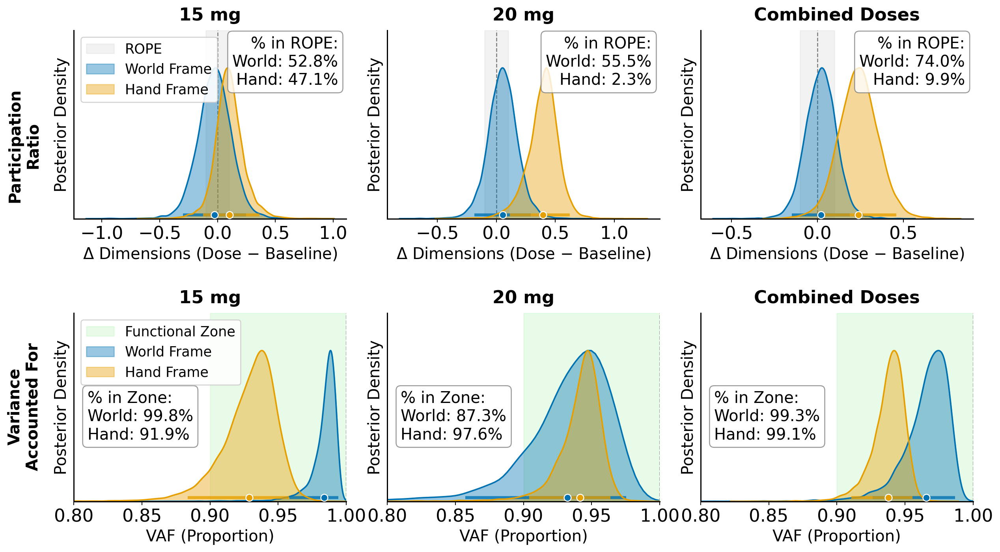

In [137]:
# 4. Plot (now includes all doses combined in third column)
fig = plot_dimensionality_publishable(
    trace_world=trace_world,
    trace_hand=trace_hand,
    group_names=groups,
    rope_pr=rope_pr_limits,
    vaf_zone=vaf_functional_zone,
    trace_world_all=trace_world_all,
    trace_hand_all=trace_hand_all
)
fig.savefig('plots/bayesian_dimensionality_PR_VAF.pdf', dpi=600)

Analyzing landmark deviations for 5 participants...
Analyzing landmark deviations for 5 participants...


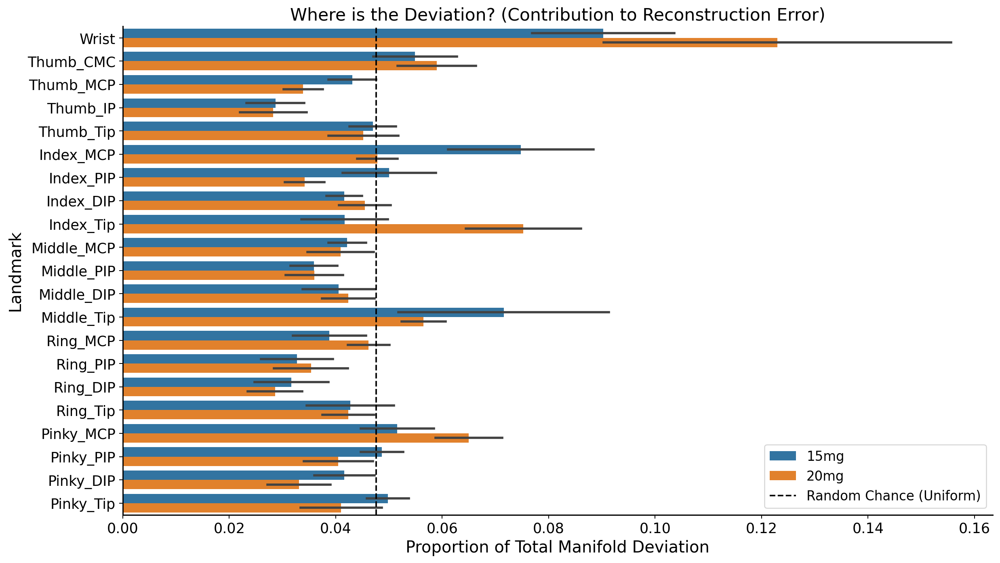

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def analyze_deviation_by_landmark(hand_timeseries, pids_with_both):
    """
    Calculates which specific parts of the hand are deviating from the baseline pattern.
    """
    landmark_errors = []
    
    # Standard MediaPipe Hand Landmark names (0-20)
    landmark_names = [
        "Wrist", 
        "Thumb_CMC", "Thumb_MCP", "Thumb_IP", "Thumb_Tip",
        "Index_MCP", "Index_PIP", "Index_DIP", "Index_Tip",
        "Middle_MCP", "Middle_PIP", "Middle_DIP", "Middle_Tip",
        "Ring_MCP", "Ring_PIP", "Ring_DIP", "Ring_Tip",
        "Pinky_MCP", "Pinky_PIP", "Pinky_DIP", "Pinky_Tip"
    ]

    print(f"Analyzing landmark deviations for {len(pids_with_both)} participants...")

    for pid in pids_with_both:
        # Get Data
        data_base = np.array(hand_timeseries[pid]['Baseline']['hand']) # (350, 21, 3)
        data_dose = np.array(hand_timeseries[pid]['Dose']['hand'])     # (350, 21, 3)
        
        # Flatten for PCA: (Frames, 63)
        X_base = data_base.reshape(data_base.shape[0], -1)
        X_dose = data_dose.reshape(data_dose.shape[0], -1)
        
        # Center
        mean_base = np.mean(X_base, axis=0)
        X_base_centered = X_base - mean_base
        X_dose_centered = X_dose - mean_base # Project Dose onto Baseline Mean

        #check for NaN values
        if np.isnan(X_base_centered).any() or np.isnan(X_dose_centered).any():
            print(f"Warning: NaN values found in {pid}, skipping for frame: {hand_timeseries[pid]}" )
            continue
        
        # Train PCA on Baseline
        pca = PCA(n_components=10)
        pca.fit(X_base_centered)
        
        # Reconstruct Dose Data using Baseline PCs
        X_dose_recon = pca.inverse_transform(pca.transform(X_dose_centered))
        
        # Calculate Error Per Feature (Squared Difference)
        # Shape: (350, 63)
        squared_diff = (X_dose_centered - X_dose_recon)**2
        
        # Reshape back to (350, 21, 3) to sum errors across x,y,z for each landmark
        diff_reshaped = squared_diff.reshape(350, 21, 3)
        # Sum across coords (x,y,z) and mean across time -> (21,)
        error_per_landmark = np.mean(np.sum(diff_reshaped, axis=2), axis=0)
        
        # Normalize by the total error for this participant (to compare shape, not magnitude)
        # This highlights RELATIVE contribution to the deviation
        relative_error = error_per_landmark / np.sum(error_per_landmark)
        
        for idx, error in enumerate(relative_error):
            landmark_errors.append({
                'Participant': pid,
                'Landmark': landmark_names[idx],
                'Relative_Deviation': error,
                'Dose_Group': '20mg' if pid in participant_with_20mg else '15mg'
            })
            
    return pd.DataFrame(landmark_errors)

# Run Analysis
df_landmarks_15 = analyze_deviation_by_landmark(hand_timeseries_15mg, pids_15mg)
df_landmarks_20 = analyze_deviation_by_landmark(hand_timeseries_20mg, pids_20mg)
df_landmarks = pd.concat([df_landmarks_15, df_landmarks_20],    
                         ignore_index=True)


# Visualization
plt.figure(figsize=(14, 8))
sns.barplot(data=df_landmarks, x='Relative_Deviation', y='Landmark', hue='Dose_Group', errorbar='se')
plt.title("Where is the Deviation? (Contribution to Reconstruction Error)")
plt.xlabel("Proportion of Total Manifold Deviation")
plt.axvline(1/21, color='k', linestyle='--', label='Random Chance (Uniform)')
plt.legend()
plt.tight_layout()
plt.show()

# Subspace Similarity Visualization and Interpretation

This section visualizes and interprets the relationship between **RMSIP** (subspace alignment) and **VAF** (reconstruction fidelity) in the context of the box-and-block task.

World Frame Analysis:


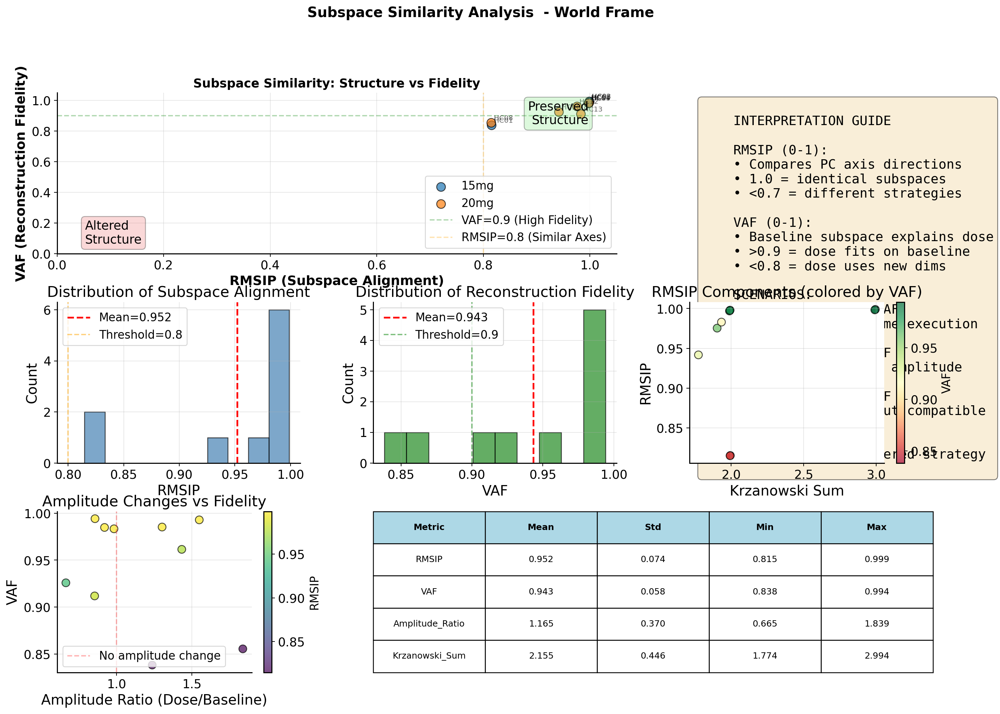


SUBSPACE SIMILARITY SUMMARY
Mean RMSIP: 0.952 ± 0.074
Mean VAF:   0.943 ± 0.058

Participants with high similarity (RMSIP>0.8 & VAF>0.9): 8/10
Participants with altered structure (RMSIP<0.7 | VAF<0.8): 0/10



In [57]:
def visualize_subspace_similarity(df_results, title_suffix=""):
    """
    Comprehensive visualization of subspace similarity metrics.
    Includes:
    1. RMSIP vs VAF scatter (the key relationship)
    2. Principal angle heatmaps for selected participants
    3. 3D visualization of overlapping manifolds
    4. Interpretation guidelines
    """
    
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    
    # =========================================================================
    # PANEL 1: RMSIP vs VAF - The Core Relationship
    # =========================================================================
    ax1 = fig.add_subplot(gs[0, :2])
    
    # Color by dose category if available
    if 'Dose_Category' in df_results.columns:
        for dose_cat in df_results['Dose_Category'].unique():
            subset = df_results[df_results['Dose_Category'] == dose_cat]
            ax1.scatter(subset['RMSIP'], subset['VAF'], 
                       s=100, alpha=0.7, label=dose_cat, edgecolors='black', linewidth=1)
    else:
        ax1.scatter(df_results['RMSIP'], df_results['VAF'], 
                   s=100, alpha=0.7, edgecolors='black', linewidth=1)
    
    # Add participant labels
    for idx, row in df_results.iterrows():
        ax1.annotate(row['PID'], (row['RMSIP'], row['VAF']), 
                    fontsize=8, alpha=0.6, xytext=(3, 3), textcoords='offset points')
    
    # Reference zones
    ax1.axhline(0.9, color='green', linestyle='--', alpha=0.3, label='VAF=0.9 (High Fidelity)')
    ax1.axvline(0.8, color='orange', linestyle='--', alpha=0.3, label='RMSIP=0.8 (Similar Axes)')
    
    # Quadrant labels
    ax1.text(0.95, 0.95, 'Preserved\nStructure', transform=ax1.transAxes,
            fontsize=14, ha='right', va='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.3))
    ax1.text(0.05, 0.05, 'Altered\nStructure', transform=ax1.transAxes,
            fontsize=14, ha='left', va='bottom', bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.3))
    
    ax1.set_xlabel('RMSIP (Subspace Alignment)', fontsize=15, fontweight='bold')
    ax1.set_ylabel('VAF (Reconstruction Fidelity)', fontsize=15, fontweight='bold')
    ax1.set_title('Subspace Similarity: Structure vs Fidelity', fontsize=14, fontweight='bold')
    ax1.legend(loc='lower right')
    ax1.grid(alpha=0.3)
    ax1.set_xlim([0, 1.05])
    ax1.set_ylim([0, 1.05])
    
    # =========================================================================
    # PANEL 2: Interpretation Guide
    # =========================================================================
    ax2 = fig.add_subplot(gs[0, 2])
    ax2.axis('off')
    
    interpretation_text = """
    INTERPRETATION GUIDE
    
    RMSIP (0-1):
    • Compares PC axis directions
    • 1.0 = identical subspaces
    • <0.7 = different strategies
    
    VAF (0-1):
    • Baseline subspace explains dose
    • >0.9 = dose fits on baseline
    • <0.8 = dose uses new dims
    
    SCENARIOS:
    High RMSIP + High VAF
    → Same strategy, same execution
    
    High RMSIP + Low VAF
    → Same axes, larger amplitude
    
    Low RMSIP + High VAF
    → Different axes, but compatible
    
    Low RMSIP + Low VAF
    → Fundamentally altered strategy
    """
    
    ax2.text(0.05, 0.95, interpretation_text, transform=ax2.transAxes,
            fontsize=15, va='top', family='monospace',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # =========================================================================
    # PANEL 3: Distribution of RMSIP
    # =========================================================================
    ax3 = fig.add_subplot(gs[1, 0])
    
    ax3.hist(df_results['RMSIP'], bins=10, color='steelblue', alpha=0.7, edgecolor='black')
    ax3.axvline(df_results['RMSIP'].mean(), color='red', linestyle='--', 
               linewidth=2, label=f"Mean={df_results['RMSIP'].mean():.3f}")
    ax3.axvline(0.8, color='orange', linestyle='--', alpha=0.5, label='Threshold=0.8')
    ax3.set_xlabel('RMSIP')
    ax3.set_ylabel('Count')
    ax3.set_title('Distribution of Subspace Alignment')
    ax3.legend()
    ax3.grid(alpha=0.3)
    
    # =========================================================================
    # PANEL 4: Distribution of VAF
    # =========================================================================
    ax4 = fig.add_subplot(gs[1, 1])
    
    ax4.hist(df_results['VAF'], bins=10, color='forestgreen', alpha=0.7, edgecolor='black')
    ax4.axvline(df_results['VAF'].mean(), color='red', linestyle='--', 
               linewidth=2, label=f"Mean={df_results['VAF'].mean():.3f}")
    ax4.axvline(0.9, color='green', linestyle='--', alpha=0.5, label='Threshold=0.9')
    ax4.set_xlabel('VAF')
    ax4.set_ylabel('Count')
    ax4.set_title('Distribution of Reconstruction Fidelity')
    ax4.legend()
    ax4.grid(alpha=0.3)
    
    # =========================================================================
    # PANEL 5: RMSIP vs Krzanowski Sum
    # =========================================================================
    ax5 = fig.add_subplot(gs[1, 2])
    
    ax5.scatter(df_results['Krzanowski_Sum'], df_results['RMSIP'], 
               s=80, alpha=0.7, c=df_results['VAF'], cmap='RdYlGn', 
               edgecolors='black', linewidth=1)
    cbar = plt.colorbar(ax5.collections[0], ax=ax5)
    cbar.set_label('VAF', fontsize=13)
    
    ax5.set_xlabel('Krzanowski Sum')
    ax5.set_ylabel('RMSIP')
    ax5.set_title('RMSIP Components (colored by VAF)')
    ax5.grid(alpha=0.3)
    
    # =========================================================================
    # PANEL 6: Amplitude vs Structure
    # =========================================================================
    ax6 = fig.add_subplot(gs[2, 0])
    
    ax6.scatter(df_results['Amplitude_Ratio'], df_results['VAF'], 
               s=80, alpha=0.7, c=df_results['RMSIP'], cmap='viridis',
               edgecolors='black', linewidth=1)
    cbar = plt.colorbar(ax6.collections[0], ax=ax6)
    cbar.set_label('RMSIP', fontsize=13)
    
    ax6.axvline(1.0, color='red', linestyle='--', alpha=0.3, label='No amplitude change')
    ax6.set_xlabel('Amplitude Ratio (Dose/Baseline)')
    ax6.set_ylabel('VAF')
    ax6.set_title('Amplitude Changes vs Fidelity')
    ax6.legend()
    ax6.grid(alpha=0.3)
    
    # =========================================================================
    # PANEL 7: Summary Statistics Table
    # =========================================================================
    ax7 = fig.add_subplot(gs[2, 1:])
    ax7.axis('off')
    
    summary_stats = df_results[['RMSIP', 'VAF', 'Amplitude_Ratio', 'Krzanowski_Sum']].describe()
    
    table_data = []
    for col in summary_stats.columns:
        table_data.append([
            col,
            f"{summary_stats.loc['mean', col]:.3f}",
            f"{summary_stats.loc['std', col]:.3f}",
            f"{summary_stats.loc['min', col]:.3f}",
            f"{summary_stats.loc['max', col]:.3f}"
        ])
    
    table = ax7.table(cellText=table_data,
                     colLabels=['Metric', 'Mean', 'Std', 'Min', 'Max'],
                     cellLoc='center', loc='center',
                     bbox=[0, 0, 1, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2)
    
    # Style header
    for i in range(5):
        table[(0, i)].set_facecolor('lightblue')
        table[(0, i)].set_text_props(weight='bold')
    
    plt.suptitle(f'Subspace Similarity Analysis {title_suffix}', 
                fontsize=16, fontweight='bold', y=0.995)
    
    plt.savefig(f'plots/subspace_similarity_analysis{title_suffix.replace(" ", "_")}.png', 
               dpi=600, bbox_inches='tight')
    plt.show()
    
    # Print summary
    print("\n" + "="*60)
    print("SUBSPACE SIMILARITY SUMMARY")
    print("="*60)
    print(f"Mean RMSIP: {df_results['RMSIP'].mean():.3f} ± {df_results['RMSIP'].std():.3f}")
    print(f"Mean VAF:   {df_results['VAF'].mean():.3f} ± {df_results['VAF'].std():.3f}")
    print(f"\nParticipants with high similarity (RMSIP>0.8 & VAF>0.9): "
          f"{len(df_results[(df_results['RMSIP']>0.8) & (df_results['VAF']>0.9)])}/{len(df_results)}")
    print(f"Participants with altered structure (RMSIP<0.7 | VAF<0.8): "
          f"{len(df_results[(df_results['RMSIP']<0.7) | (df_results['VAF']<0.8)])}/{len(df_results)}")
    print("="*60 + "\n")


# Run the visualization
print("World Frame Analysis:")
visualize_subspace_similarity(df_dim_all, title_suffix=" - World Frame")

Visualizing average manifold overlap across all participants
Total baseline frames: 3500
Total dose frames: 3500


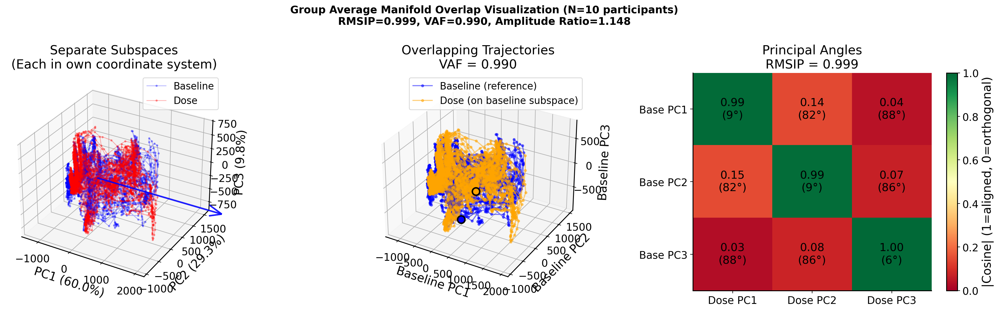


GROUP AVERAGE - SUBSPACE ANALYSIS (N=10 participants)
RMSIP: 0.999 - ✓ Similar principal axes (preserved structure)
VAF:   0.990 - ✓ Dose fits well on baseline subspace
Amplitude Ratio: 1.148 - Larger movements under dose



({'krzanowski_sum': np.float64(2.995814923451202),
  'rmsip': np.float64(0.9993022438100166)},
 np.float64(0.9895881373275074),
 np.float64(1.1481255730052498))

In [58]:
def visualize_overlapping_manifolds_3d(hand_timeseries, pids=None, n_comps=3):
    """
    Visualizes the average Baseline and Dose manifolds across all participants
    in the first 3 PC dimensions, showing how they overlap or diverge.
    
    Args:
        hand_timeseries: Dictionary of participant data
        pids: List of participant IDs to include (if None, use all available)
        n_comps: Number of principal components to visualize
    
    Also shows:
        - Principal axes as vectors
        - Angle between corresponding PCs
        - Reconstruction of Dose data onto Baseline subspace
    """
    from mpl_toolkits.mplot3d import Axes3D
    
    # Determine which participants to include
    if pids is None:
        pids = [pid for pid in hand_timeseries.keys() 
                if 'Baseline' in hand_timeseries[pid] and 'Dose' in hand_timeseries[pid]]
    
    # Collect data from all participants
    X_base_all = []
    X_dose_all = []
    
    print(f"Collecting data from {len(pids)} participants...")
    for pid in pids:
        try:
            data_base = np.array(hand_timeseries[pid]['Baseline']['hand'])
            data_dose = np.array(hand_timeseries[pid]['Dose']['hand'])
            
            # Skip if NaN values present
            if np.isnan(data_base).any() or np.isnan(data_dose).any():
                print(f"  Skipping {pid} (contains NaN)")
                continue
            
            # Flatten
            X_base_all.append(data_base.reshape(data_base.shape[0], -1))
            X_dose_all.append(data_dose.reshape(data_dose.shape[0], -1))
            
        except Exception as e:
            print(f"  Error with {pid}: {e}")
            continue
    
    # Concatenate all participants
    X_base = np.vstack(X_base_all)
    X_dose = np.vstack(X_dose_all)
    
    print(f"Total baseline frames: {X_base.shape[0]}")
    print(f"Total dose frames: {X_dose.shape[0]}")
    
    # Center the data
    X_base_centered = X_base - np.mean(X_base, axis=0)
    X_dose_centered = X_dose - np.mean(X_dose, axis=0)
    
    # Fit PCAs
    pca_base = PCA(n_components=n_comps).fit(X_base_centered)
    pca_dose = PCA(n_components=n_comps).fit(X_dose_centered)
    
    # Transform to PC space
    X_base_pc = pca_base.transform(X_base_centered)
    X_dose_pc = pca_dose.transform(X_dose_centered)
    
    # Also: Project Dose onto Baseline subspace (for VAF visualization)
    X_dose_on_base = pca_base.transform(X_dose_centered)
    
    # Calculate metrics
    similarity = get_subspace_similarity(pca_base, pca_dose, n_comps=n_comps)
    vaf, amp_ratio = analyze_reconstruction_vaf(X_base_centered, X_dose_centered, n_comps=n_comps)
    
    # =========================================================================
    # Create figure with multiple views
    # =========================================================================
    fig = plt.figure(figsize=(20, 6))
    
    # -------------------------------------------------------------------------
    # LEFT: Separate subspaces (each in their own PC basis)
    # -------------------------------------------------------------------------
    ax1 = fig.add_subplot(131, projection='3d')
    
    # Plot baseline in its own space (blue)
    ax1.plot(X_base_pc[:, 0], X_base_pc[:, 1], X_base_pc[:, 2], 
            'o-', color='blue', alpha=0.3, linewidth=1, markersize=2, label='Baseline')
    
    # Plot dose in its own space (red)
    ax1.plot(X_dose_pc[:, 0], X_dose_pc[:, 1], X_dose_pc[:, 2], 
            'o-', color='red', alpha=0.3, linewidth=1, markersize=2, label='Dose')
    
    # Draw PC axes as arrows from origin
    scale = 2 * np.max(np.abs(X_base_pc))
    for i in range(n_comps):
        # Baseline axes (blue)
        ax1.quiver(0, 0, 0, scale, 0, 0 if i==0 else (0 if i==1 else 0), 
                  color='blue', alpha=0.5, linewidth=2, arrow_length_ratio=0.1)
    
    ax1.set_xlabel(f'PC1 ({pca_base.explained_variance_ratio_[0]*100:.1f}%)')
    ax1.set_ylabel(f'PC2 ({pca_base.explained_variance_ratio_[1]*100:.1f}%)')
    ax1.set_zlabel(f'PC3 ({pca_base.explained_variance_ratio_[2]*100:.1f}%)')
    ax1.set_title('Separate Subspaces\n(Each in own coordinate system)')
    ax1.legend()
    
    # -------------------------------------------------------------------------
    # MIDDLE: Dose projected onto Baseline subspace
    # -------------------------------------------------------------------------
    ax2 = fig.add_subplot(132, projection='3d')
    
    # Plot baseline (reference)
    ax2.plot(X_base_pc[:, 0], X_base_pc[:, 1], X_base_pc[:, 2], 
            'o-', color='blue', alpha=0.5, linewidth=1.5, markersize=3, label='Baseline (reference)')
    
    # Plot dose projected onto baseline subspace (orange)
    ax2.plot(X_dose_on_base[:, 0], X_dose_on_base[:, 1], X_dose_on_base[:, 2], 
            'o-', color='orange', alpha=0.5, linewidth=1.5, markersize=3, 
            label='Dose (on baseline subspace)')
    
    # Mark start and end points
    ax2.scatter([X_base_pc[0, 0]], [X_base_pc[0, 1]], [X_base_pc[0, 2]], 
               color='blue', s=100, marker='o', edgecolors='black', linewidth=2, zorder=5)
    ax2.scatter([X_dose_on_base[0, 0]], [X_dose_on_base[0, 1]], [X_dose_on_base[0, 2]], 
               color='orange', s=100, marker='o', edgecolors='black', linewidth=2, zorder=5)
    
    ax2.set_xlabel(f'Baseline PC1')
    ax2.set_ylabel(f'Baseline PC2')
    ax2.set_zlabel(f'Baseline PC3')
    ax2.set_title(f'Overlapping Trajectories\nVAF = {vaf:.3f}')
    ax2.legend()
    
    # -------------------------------------------------------------------------
    # RIGHT: Principal Angles Visualization
    # -------------------------------------------------------------------------
    ax3 = fig.add_subplot(133)
    
    # Calculate principal angles (cosines)
    U_base = pca_base.components_[:n_comps].T
    U_dose = pca_dose.components_[:n_comps].T
    M = np.dot(U_base.T, U_dose)  # Correlation matrix
    
    # Plot heatmap of principal angles
    im = ax3.imshow(np.abs(M), cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
    ax3.set_xticks(range(n_comps))
    ax3.set_yticks(range(n_comps))
    ax3.set_xticklabels([f'Dose PC{i+1}' for i in range(n_comps)])
    ax3.set_yticklabels([f'Base PC{i+1}' for i in range(n_comps)])
    ax3.set_title(f'Principal Angles\nRMSIP = {similarity["rmsip"]:.3f}')
    
    # Add values to cells
    for i in range(n_comps):
        for j in range(n_comps):
            angle_deg = np.arccos(np.clip(np.abs(M[i, j]), 0, 1)) * 180 / np.pi
            text = ax3.text(j, i, f'{np.abs(M[i, j]):.2f}\n({angle_deg:.0f}°)',
                          ha="center", va="center", color="black", fontsize=15)
    
    plt.colorbar(im, ax=ax3, label='|Cosine| (1=aligned, 0=orthogonal)')
    
    # -------------------------------------------------------------------------
    # Add overall title with metrics
    # -------------------------------------------------------------------------
    fig.suptitle(f'Group Average Manifold Overlap Visualization (N={len(pids)} participants)\n' + 
                f'RMSIP={similarity["rmsip"]:.3f}, VAF={vaf:.3f}, Amplitude Ratio={amp_ratio:.3f}',
                fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f'plots/manifold_overlap_group_average.png', dpi=600, bbox_inches='tight')
    plt.show()
    
    # Print interpretation
    print(f"\n{'='*60}")
    print(f"GROUP AVERAGE - SUBSPACE ANALYSIS (N={len(pids)} participants)")
    print(f"{'='*60}")
    print(f"RMSIP: {similarity['rmsip']:.3f} - ", end="")
    if similarity['rmsip'] > 0.8:
        print("✓ Similar principal axes (preserved structure)")
    elif similarity['rmsip'] > 0.6:
        print("~ Moderately different axes")
    else:
        print("✗ Very different axes (altered strategy)")
    
    print(f"VAF:   {vaf:.3f} - ", end="")
    if vaf > 0.9:
        print("✓ Dose fits well on baseline subspace")
    elif vaf > 0.8:
        print("~ Some deviation from baseline subspace")
    else:
        print("✗ Dose uses dimensions outside baseline subspace")
    
    print(f"Amplitude Ratio: {amp_ratio:.3f} - ", end="")
    if 0.9 < amp_ratio < 1.1:
        print("Similar movement size")
    elif amp_ratio > 1.1:
        print("Larger movements under dose")
    else:
        print("Smaller movements under dose")
    
    print(f"{'='*60}\n")
    
    return similarity, vaf, amp_ratio


# Visualize average manifolds across all participants
pids_for_average = df_dim_all['PID'].tolist()
print(f"Visualizing average manifold overlap across all participants")
visualize_overlapping_manifolds_3d(hand_timeseries, pids=pids_for_average)

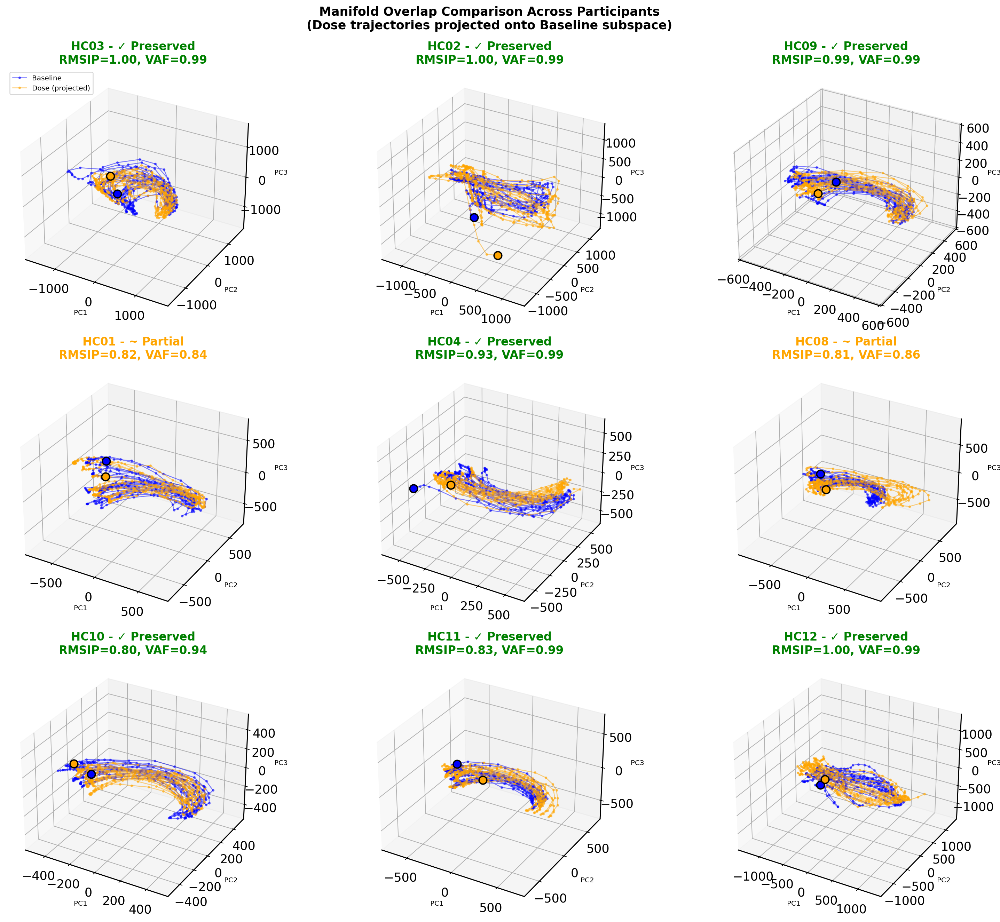

In [59]:
def compare_multiple_manifolds(hand_timeseries, pids, n_comps=3):
    """
    Creates a grid comparing manifold overlaps for multiple participants.
    Shows baseline (blue) and dose projected onto baseline subspace (orange).
    """
    from mpl_toolkits.mplot3d import Axes3D
    
    n_pids = len(pids)
    cols = 3
    rows = (n_pids + cols - 1) // cols
    
    fig = plt.figure(figsize=(6*cols, 5*rows))
    
    for idx, pid in enumerate(pids):
        try:
            # Get data
            data_base = np.array(hand_timeseries[pid]['Baseline']['hand'])
            data_dose = np.array(hand_timeseries[pid]['Dose']['hand'])
            
            # Flatten and center
            X_base = data_base.reshape(data_base.shape[0], -1)
            X_dose = data_dose.reshape(data_dose.shape[0], -1)
            X_base_centered = X_base - np.mean(X_base, axis=0)
            X_dose_centered = X_dose - np.mean(X_dose, axis=0)
            
            # Fit PCA on baseline
            pca_base = PCA(n_components=n_comps).fit(X_base_centered)
            pca_dose = PCA(n_components=n_comps).fit(X_dose_centered)
            
            # Transform both to baseline PC space
            X_base_pc = pca_base.transform(X_base_centered)
            X_dose_on_base = pca_base.transform(X_dose_centered)
            
            # Calculate metrics
            similarity = get_subspace_similarity(pca_base, pca_dose, n_comps=n_comps)
            vaf, amp_ratio = analyze_reconstruction_vaf(X_base_centered, X_dose_centered, n_comps=n_comps)
            
            # Create subplot
            ax = fig.add_subplot(rows, cols, idx+1, projection='3d')
            
            # Plot trajectories
            ax.plot(X_base_pc[:, 0], X_base_pc[:, 1], X_base_pc[:, 2], 
                   'o-', color='blue', alpha=0.5, linewidth=1, markersize=2, label='Baseline')
            ax.plot(X_dose_on_base[:, 0], X_dose_on_base[:, 1], X_dose_on_base[:, 2], 
                   'o-', color='orange', alpha=0.5, linewidth=1, markersize=2, label='Dose (projected)')
            
            # Mark start points
            ax.scatter([X_base_pc[0, 0]], [X_base_pc[0, 1]], [X_base_pc[0, 2]], 
                      color='blue', s=80, marker='o', edgecolors='black', linewidth=1.5, zorder=5)
            ax.scatter([X_dose_on_base[0, 0]], [X_dose_on_base[0, 1]], [X_dose_on_base[0, 2]], 
                      color='orange', s=80, marker='o', edgecolors='black', linewidth=1.5, zorder=5)
            
            # Styling
            ax.set_xlabel('PC1', fontsize=8)
            ax.set_ylabel('PC2', fontsize=8)
            ax.set_zlabel('PC3', fontsize=8)
            
            # Color title based on metrics
            if similarity['rmsip'] > 0.8 and vaf > 0.9:
                title_color = 'green'
                status = '✓ Preserved'
            elif similarity['rmsip'] < 0.7 or vaf < 0.8:
                title_color = 'red'
                status = '✗ Altered'
            else:
                title_color = 'orange'
                status = '~ Partial'
            
            ax.set_title(f'{pid} - {status}\nRMSIP={similarity["rmsip"]:.2f}, VAF={vaf:.2f}',
                        fontsize=13, color=title_color, fontweight='bold')
            
            if idx == 0:
                ax.legend(fontsize=8, loc='upper left')
            
            # Set same scale for all plots for comparison
            max_range = np.max([np.abs(X_base_pc).max(), np.abs(X_dose_on_base).max()])
            ax.set_xlim([-max_range, max_range])
            ax.set_ylim([-max_range, max_range])
            ax.set_zlim([-max_range, max_range])
            
        except Exception as e:
            print(f"Error processing {pid}: {e}")
            continue
    
    plt.suptitle('Manifold Overlap Comparison Across Participants\n(Dose trajectories projected onto Baseline subspace)',
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('plots/manifold_comparison_grid.png', dpi=600, bbox_inches='tight')
    plt.show()


# Compare all participants with both conditions
pids_to_compare = df_dim_all['PID'].tolist()[:9]  # First 9 for a 3x3 grid
compare_multiple_manifolds(hand_timeseries, pids_to_compare)


VISUALIZING PC AXES ALIGNMENT

1. WORLD COORDINATE FRAME
--------------------------------------------------------------------------------
Analyzing World frame - Collecting data from 10 participants...


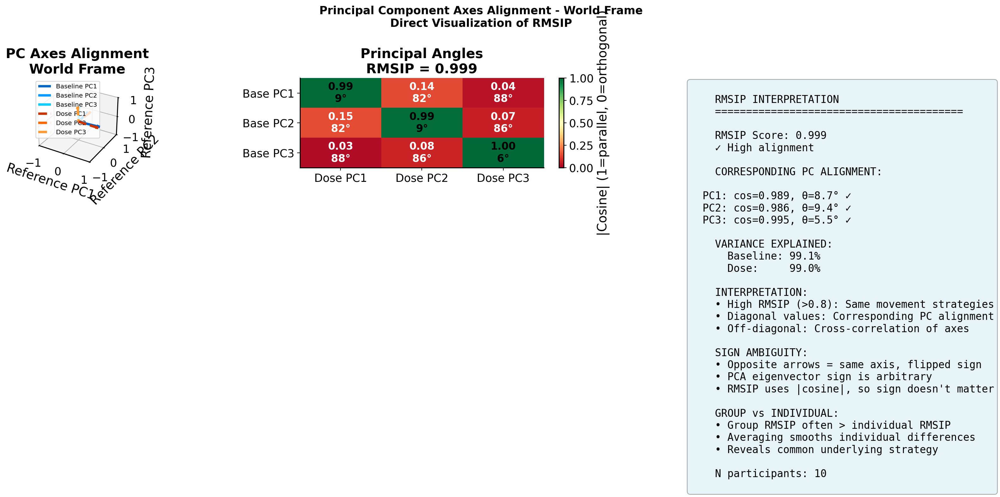


PC AXES ALIGNMENT - WORLD FRAME
RMSIP: 0.999

Corresponding PC alignment (diagonal of correlation matrix):
  Baseline PC1 ↔ Dose PC1: cos=0.989, angle=8.7°
  Baseline PC2 ↔ Dose PC2: cos=0.986, angle=9.4°
  Baseline PC3 ↔ Dose PC3: cos=0.995, angle=5.5°

Variance explained by first 3 PCs:
  Baseline: 99.1%
  Dose:     99.0%


2. HAND-CENTRIC COORDINATE FRAME
--------------------------------------------------------------------------------
Analyzing Hand-Centric frame - Collecting data from 10 participants...


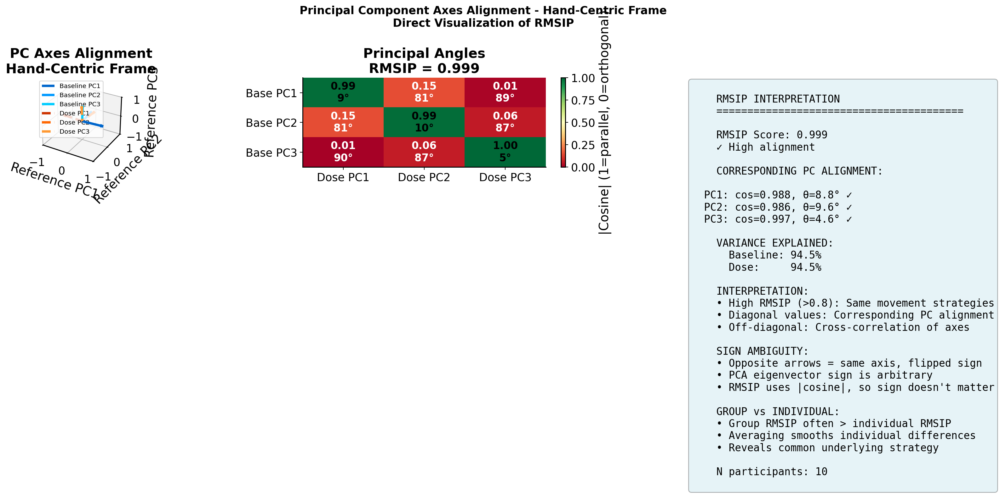


PC AXES ALIGNMENT - HAND-CENTRIC FRAME
RMSIP: 0.999

Corresponding PC alignment (diagonal of correlation matrix):
  Baseline PC1 ↔ Dose PC1: cos=0.988, angle=8.8°
  Baseline PC2 ↔ Dose PC2: cos=0.986, angle=9.6°
  Baseline PC3 ↔ Dose PC3: cos=0.997, angle=4.6°

Variance explained by first 3 PCs:
  Baseline: 94.5%
  Dose:     94.5%



In [60]:
def visualize_pc_axes_alignment(hand_timeseries, pids=None, n_comps=3, ego_centric=False):
    """
    Visualizes RMSIP by plotting the principal component axes (eigenvectors) themselves.
    Shows baseline and dose PC axes as vectors in 3D space to see their alignment.
    
    This is the most direct visualization of what RMSIP measures: how aligned are the axes?
    
    Args:
        hand_timeseries: Dictionary of participant data
        pids: List of participant IDs to include (if None, use all available)
        n_comps: Number of principal components to visualize (default 3)
        ego_centric: If True, align to hand-centric frame before PCA
    """
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib.patches import FancyArrowPatch
    from mpl_toolkits.mplot3d.proj3d import proj_transform
    
    # Custom 3D arrow class for better visualization
    class Arrow3D(FancyArrowPatch):
        def __init__(self, x, y, z, dx, dy, dz, *args, **kwargs):
            super().__init__((0, 0), (0, 0), *args, **kwargs)
            self._xyz = (x, y, z)
            self._dxdydz = (dx, dy, dz)

        def draw(self, renderer):
            x1, y1, z1 = self._xyz
            dx, dy, dz = self._dxdydz
            x2, y2, z2 = (x1 + dx, y1 + dy, z1 + dz)

            xs, ys, zs = proj_transform((x1, x2), (y1, y2), (z1, z2), self.axes.M)
            self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))
            super().draw(renderer)
    
    # Determine which participants to include
    if pids is None:
        pids = [pid for pid in hand_timeseries.keys() 
                if 'Baseline' in hand_timeseries[pid] and 'Dose' in hand_timeseries[pid]]
    
    # Collect data from all participants
    X_base_all = []
    X_dose_all = []
    
    frame_name = "Hand-Centric" if ego_centric else "World"
    print(f"Analyzing {frame_name} frame - Collecting data from {len(pids)} participants...")
    
    for pid in pids:
        try:
            data_base = np.array(hand_timeseries[pid]['Baseline']['hand'])
            data_dose = np.array(hand_timeseries[pid]['Dose']['hand'])
            
            if np.isnan(data_base).any() or np.isnan(data_dose).any():
                continue
            
            if ego_centric:
                # Apply hand-centric alignment
                data_base = anatomical_hand_alignment(data_base)
                data_dose = anatomical_hand_alignment(data_dose)
            
            # Flatten
            X_base_all.append(data_base.reshape(data_base.shape[0], -1))
            X_dose_all.append(data_dose.reshape(data_dose.shape[0], -1))
            
        except Exception as e:
            print(f"  Error with {pid}: {e}")
            continue
    
    # Concatenate and center
    X_base = np.vstack(X_base_all)
    X_dose = np.vstack(X_dose_all)
    X_base_centered = X_base - np.mean(X_base, axis=0)
    X_dose_centered = X_dose - np.mean(X_dose, axis=0)
    
    # Fit PCAs
    pca_base = PCA(n_components=n_comps).fit(X_base_centered)
    pca_dose = PCA(n_components=n_comps).fit(X_dose_centered)
    
    # Get the principal component vectors (eigenvectors)
    # Shape: (n_comps, n_features)
    PC_base = pca_base.components_[:n_comps]
    PC_dose = pca_dose.components_[:n_comps]
    
    # Calculate RMSIP
    similarity = get_subspace_similarity(pca_base, pca_dose, n_comps=n_comps)
    
    # Calculate principal angles between corresponding axes
    U_base = PC_base.T  # (n_features, n_comps)
    U_dose = PC_dose.T
    M = np.dot(U_base.T, U_dose)  # Correlation matrix
    
    # ==========================================================================
    # Create visualizations
    # ==========================================================================
    fig = plt.figure(figsize=(20, 6))
    
    # --------------------------------------------------------------------------
    # LEFT: PC axes visualized in a common reference space
    # Project eigenvectors onto a combined PCA space for visualization
    # --------------------------------------------------------------------------
    ax1 = fig.add_subplot(131, projection='3d')
    
    colors_base = ['#0066CC', '#0099FF', '#00CCFF']  # Blue shades
    colors_dose = ['#CC3300', '#FF6600', '#FF9933']  # Red/orange shades
    
    # Create a common reference space by doing PCA on combined covariance
    combined_data = np.vstack([X_base_centered, X_dose_centered])
    pca_reference = PCA(n_components=3).fit(combined_data)
    
    # Project the PC axes (eigenvectors) into this 3D reference space
    # Each PC is a vector in the original feature space, we project it
    PC_base_in_ref = np.dot(PC_base, pca_reference.components_.T)  # (n_comps, 3)
    PC_dose_in_ref = np.dot(PC_dose, pca_reference.components_.T)  # (n_comps, 3)
    
    arrow_length = 0.8
    
    # Plot baseline axes
    for i in range(n_comps):
        direction = PC_base_in_ref[i, :]
        norm = np.linalg.norm(direction)
        if norm > 1e-10:  # Check for non-zero vector
            direction = direction / norm * arrow_length
            ax1.quiver(0, 0, 0, 
                      direction[0], direction[1], direction[2],
                      color=colors_base[i], linewidth=3, arrow_length_ratio=0.15,
                      label=f'Baseline PC{i+1}')
    
    # Plot dose axes
    for i in range(n_comps):
        direction = PC_dose_in_ref[i, :]
        norm = np.linalg.norm(direction)
        if norm > 1e-10:  # Check for non-zero vector
            direction = direction / norm * arrow_length
            ax1.quiver(0, 0, 0, 
                      direction[0], direction[1], direction[2],
                      color=colors_dose[i], linewidth=3, arrow_length_ratio=0.15,
                      linestyle='--', label=f'Dose PC{i+1}')
    
    ax1.set_xlabel('Reference PC1')
    ax1.set_ylabel('Reference PC2')
    ax1.set_zlabel('Reference PC3')
    ax1.set_title(f'PC Axes Alignment\n{frame_name} Frame', fontweight='bold')
    ax1.legend(loc='upper left', fontsize=8)
    ax1.set_xlim([-1, 1])
    ax1.set_ylim([-1, 1])
    ax1.set_zlim([-1, 1])
    
    # --------------------------------------------------------------------------
    # MIDDLE: Angular difference heatmap
    # --------------------------------------------------------------------------
    ax2 = fig.add_subplot(132)
    
    # Calculate angles from correlation matrix
    angles = np.arccos(np.clip(np.abs(M), 0, 1)) * 180 / np.pi
    
    im = ax2.imshow(np.abs(M), cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
    ax2.set_xticks(range(n_comps))
    ax2.set_yticks(range(n_comps))
    ax2.set_xticklabels([f'Dose PC{i+1}' for i in range(n_comps)])
    ax2.set_yticklabels([f'Base PC{i+1}' for i in range(n_comps)])
    ax2.set_title(f'Principal Angles\nRMSIP = {similarity["rmsip"]:.3f}', fontweight='bold')
    
    # Add values to cells
    for i in range(n_comps):
        for j in range(n_comps):
            cos_val = np.abs(M[i, j])
            angle = angles[i, j]
            color = 'black' if cos_val > 0.5 else 'white'
            ax2.text(j, i, f'{cos_val:.2f}\n{angle:.0f}°',
                    ha="center", va="center", color=color, fontsize=13, fontweight='bold')
    
    plt.colorbar(im, ax=ax2, label='|Cosine| (1=parallel, 0=orthogonal)')
    
    # --------------------------------------------------------------------------
    # RIGHT: Summary statistics
    # --------------------------------------------------------------------------
    ax3 = fig.add_subplot(133)
    ax3.axis('off')
    
    # Calculate diagonal alignment (corresponding PCs)
    diagonal_cosines = [np.abs(M[i, i]) for i in range(n_comps)]
    diagonal_angles = [angles[i, i] for i in range(n_comps)]
    
    summary_text = f"""
    RMSIP INTERPRETATION
    {'='*40}
    
    RMSIP Score: {similarity['rmsip']:.3f}
    {'✓ High alignment' if similarity['rmsip'] > 0.8 else '~ Moderate alignment' if similarity['rmsip'] > 0.6 else '✗ Low alignment'}
    
    CORRESPONDING PC ALIGNMENT:
    """
    
    for i in range(n_comps):
        summary_text += f"\n  PC{i+1}: cos={diagonal_cosines[i]:.3f}, θ={diagonal_angles[i]:.1f}°"
        if diagonal_cosines[i] > 0.9:
            summary_text += " ✓"
        elif diagonal_cosines[i] < 0.7:
            summary_text += " ✗"
    
    summary_text += f"""
    
    VARIANCE EXPLAINED:
      Baseline: {pca_base.explained_variance_ratio_[:n_comps].sum()*100:.1f}%
      Dose:     {pca_dose.explained_variance_ratio_[:n_comps].sum()*100:.1f}%
    
    INTERPRETATION:
    • High RMSIP (>0.8): Same movement strategies
    • Diagonal values: Corresponding PC alignment
    • Off-diagonal: Cross-correlation of axes
    
    SIGN AMBIGUITY:
    • Opposite arrows = same axis, flipped sign
    • PCA eigenvector sign is arbitrary
    • RMSIP uses |cosine|, so sign doesn't matter
    
    GROUP vs INDIVIDUAL:
    • Group RMSIP often > individual RMSIP
    • Averaging smooths individual differences
    • Reveals common underlying strategy
    
    N participants: {len(pids)}
    """
    
    ax3.text(0.05, 0.95, summary_text, transform=ax3.transAxes,
            fontsize=13, va='top', family='monospace',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))
    
    plt.suptitle(f'Principal Component Axes Alignment - {frame_name} Frame\n' + 
                f'Direct Visualization of RMSIP',
                fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f'plots/pc_axes_alignment_{frame_name.lower()}_frame.png', dpi=600, bbox_inches='tight')
    plt.show()
    
    # Print detailed results
    print(f"\n{'='*60}")
    print(f"PC AXES ALIGNMENT - {frame_name.upper()} FRAME")
    print(f"{'='*60}")
    print(f"RMSIP: {similarity['rmsip']:.3f}")
    print(f"\nCorresponding PC alignment (diagonal of correlation matrix):")
    for i in range(n_comps):
        print(f"  Baseline PC{i+1} ↔ Dose PC{i+1}: cos={diagonal_cosines[i]:.3f}, angle={diagonal_angles[i]:.1f}°")
    print(f"\nVariance explained by first {n_comps} PCs:")
    print(f"  Baseline: {pca_base.explained_variance_ratio_[:n_comps].sum()*100:.1f}%")
    print(f"  Dose:     {pca_dose.explained_variance_ratio_[:n_comps].sum()*100:.1f}%")
    print(f"{'='*60}\n")
    
    return similarity, M, angles


# Run for both coordinate frames
print("\n" + "="*80)
print("VISUALIZING PC AXES ALIGNMENT")
print("="*80 + "\n")

pids_for_analysis = df_dim_all['PID'].tolist()

print("1. WORLD COORDINATE FRAME")
print("-" * 80)
sim_world, M_world, angles_world = visualize_pc_axes_alignment(
    hand_timeseries, pids=pids_for_analysis, n_comps=3, ego_centric=False
)

print("\n2. HAND-CENTRIC COORDINATE FRAME")
print("-" * 80)
sim_hand, M_hand, angles_hand = visualize_pc_axes_alignment(
    hand_timeseries, pids=pids_for_analysis, n_comps=3, ego_centric=True
)

## 2. Hierarchical Clustering Analysis
Perform hierarchical clustering to identify patterns across participants and conditions.

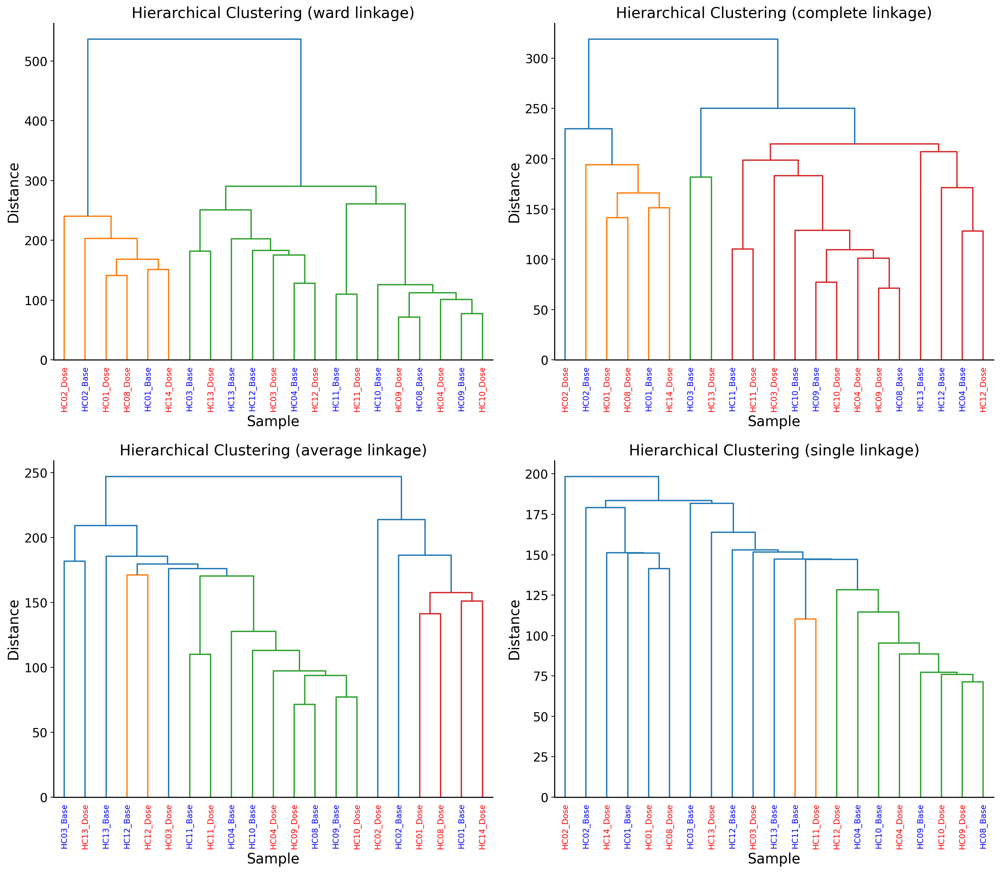


Cluster Analysis with Ward's Method

2 Clusters:
  Cluster 1: [np.str_('HC01_Base'), np.str_('HC01_Dose'), np.str_('HC08_Dose'), np.str_('HC14_Dose'), np.str_('HC02_Base'), np.str_('HC02_Dose')]
    -> Baseline: 2, Dose: 4
  Cluster 2: [np.str_('HC03_Base'), np.str_('HC03_Dose'), np.str_('HC04_Base'), np.str_('HC04_Dose'), np.str_('HC09_Base'), np.str_('HC09_Dose'), np.str_('HC08_Base'), np.str_('HC12_Base'), np.str_('HC12_Dose'), np.str_('HC13_Base'), np.str_('HC13_Dose'), np.str_('HC10_Base'), np.str_('HC10_Dose'), np.str_('HC11_Base'), np.str_('HC11_Dose')]
    -> Baseline: 8, Dose: 7

3 Clusters:
  Cluster 1: [np.str_('HC01_Base'), np.str_('HC01_Dose'), np.str_('HC08_Dose'), np.str_('HC14_Dose'), np.str_('HC02_Base'), np.str_('HC02_Dose')]
    -> Baseline: 2, Dose: 4
  Cluster 2: [np.str_('HC03_Base'), np.str_('HC03_Dose'), np.str_('HC04_Base'), np.str_('HC12_Base'), np.str_('HC12_Dose'), np.str_('HC13_Base'), np.str_('HC13_Dose')]
    -> Baseline: 4, Dose: 3
  Cluster 3: [np.str_

In [61]:
# =============================================================================
# Hierarchical Clustering Analysis
# =============================================================================

from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist, squareform

# Use PCA-reduced data (first n components explaining 95% variance)
n_components = 15
X_reduced = X_traj_pca[:, :n_components]

# Create labels for dendrogram
sample_labels = [f"{pid}_{cond[:4]}" for pid, cond in 
                 zip(analysis_data['participant_ids'], analysis_data['labels'])]

# Compute linkage using different methods
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

methods = ['ward', 'complete', 'average', 'single']
for ax, method in zip(axes.flatten(), methods):
    # Compute linkage
    Z = linkage(X_reduced, method=method)
    
    # Create dendrogram with colored labels
    def leaf_label_func(id):
        label = sample_labels[id]
        return label
    
    dendrogram(Z, labels=sample_labels, leaf_rotation=90, leaf_font_size=9, ax=ax)
    
    ax.set_title(f'Hierarchical Clustering ({method} linkage)')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Distance')
    
    # Color the x-axis labels based on condition
    ax_labels = ax.get_xticklabels()
    for label in ax_labels:
        text = label.get_text()
        if 'Base' in text:
            label.set_color('blue')
        else:
            label.set_color('red')

plt.tight_layout()
plt.savefig('plots/hierarchical_clustering_dendrograms.png', dpi=600, bbox_inches='tight')
plt.show()

# Detailed analysis with Ward's method
print("\n" + "="*60)
print("Cluster Analysis with Ward's Method")
print("="*60)

Z_ward = linkage(X_reduced, method='ward')

# Cut tree at different levels
for n_clusters in [2, 3, 4]:
    clusters = fcluster(Z_ward, n_clusters, criterion='maxclust')
    
    print(f"\n{n_clusters} Clusters:")
    for c in range(1, n_clusters + 1):
        members = np.array(sample_labels)[clusters == c]
        baseline_count = sum(['Base' in m for m in members])
        dose_count = sum(['Dose' in m for m in members])
        print(f"  Cluster {c}: {list(members)}")
        print(f"    -> Baseline: {baseline_count}, Dose: {dose_count}")

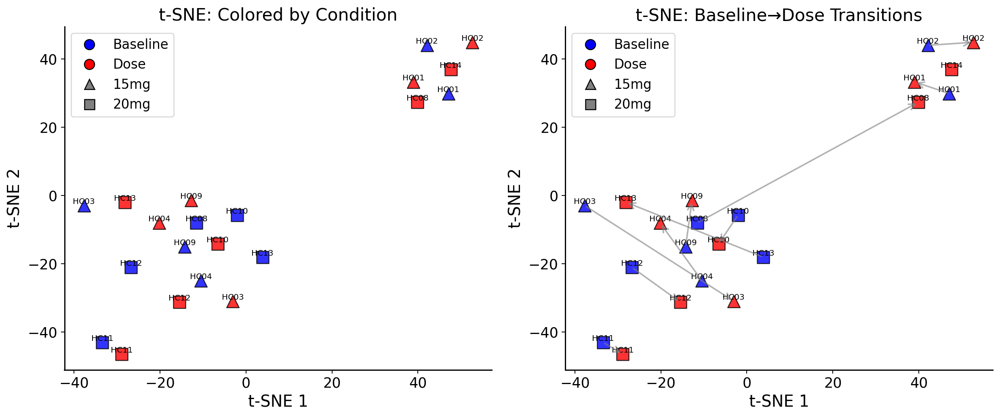

In [62]:
# =============================================================================
# t-SNE Visualization
# =============================================================================

# t-SNE for visualization
tsne = TSNE(n_components=2, perplexity=min(5, len(X_reduced)-1), random_state=42, 
            learning_rate='auto', init='pca')
X_tsne = tsne.fit_transform(X_reduced)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot 1: Color by condition
ax1 = axes[0]
for i in range(len(X_tsne)):
    condition = analysis_data['labels'][i]
    dose = analysis_data['dose_groups'][i]
    pid = analysis_data['participant_ids'][i]
    ax1.scatter(X_tsne[i, 0], X_tsne[i, 1], 
               c=colors[condition], marker=markers[dose], s=150, alpha=0.8,
               edgecolors='black', linewidths=1)
    ax1.annotate(pid, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=8, ha='center', va='bottom')

ax1.set_xlabel('t-SNE 1')
ax1.set_ylabel('t-SNE 2')
ax1.set_title('t-SNE: Colored by Condition')
ax1.legend(handles=legend_elements, loc='best')

# Plot 2: Connect paired participants
ax2 = axes[1]
# First scatter all points
for i in range(len(X_tsne)):
    condition = analysis_data['labels'][i]
    dose = analysis_data['dose_groups'][i]
    pid = analysis_data['participant_ids'][i]
    ax2.scatter(X_tsne[i, 0], X_tsne[i, 1], 
               c=colors[condition], marker=markers[dose], s=150, alpha=0.8,
               edgecolors='black', linewidths=1)
    ax2.annotate(pid, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=8, ha='center', va='bottom')

# Connect paired participants with arrows
for pid in participants_with_both:
    mask_baseline = (analysis_data['participant_ids'] == pid) & (analysis_data['labels'] == 'Baseline')
    mask_dose = (analysis_data['participant_ids'] == pid) & (analysis_data['labels'] == 'Dose')
    
    if np.any(mask_baseline) and np.any(mask_dose):
        baseline_idx = np.where(mask_baseline)[0][0]
        dose_idx = np.where(mask_dose)[0][0]
        
        ax2.annotate('', xy=(X_tsne[dose_idx, 0], X_tsne[dose_idx, 1]),
                    xytext=(X_tsne[baseline_idx, 0], X_tsne[baseline_idx, 1]),
                    arrowprops=dict(arrowstyle='->', color='gray', lw=1.5, alpha=0.6))

ax2.set_xlabel('t-SNE 1')
ax2.set_ylabel('t-SNE 2')
ax2.set_title('t-SNE: Baseline→Dose Transitions')
ax2.legend(handles=legend_elements, loc='best')

plt.tight_layout()
plt.savefig('plots/tsne_visualization.png', dpi=600, bbox_inches='tight')
plt.show()

## 3. Temporal PCA Analysis - Frame-by-Frame Dynamics
Analyze patterns in the temporal evolution of hand kinematics.

In [63]:
# =============================================================================
# Temporal PCA - Per-Frame Analysis with Condition Labels
# =============================================================================

# Prepare frame-level data with proper labels
frame_data_list = []
frame_labels = []
frame_pids = []
frame_dose_groups = []
frame_times = []

n_frames = 350

for pid in hand_timeseries.keys():
    for condition in ['Baseline', 'Dose']:
        if condition in hand_timeseries[pid]:
            hand = np.array(hand_timeseries[pid][condition]['hand'])  # (350, 21, 3)
            
            if np.isnan(hand).any():
                continue
            
            dose_group = '20mg' if pid in participant_with_20mg else '15mg'
            
            for t in range(n_frames):
                frame_data_list.append(hand[t].flatten())  # (63,)
                frame_labels.append(condition)
                frame_pids.append(pid)
                frame_dose_groups.append(dose_group)
                frame_times.append(t)

frame_data_arr = np.array(frame_data_list)
frame_labels_arr = np.array(frame_labels)
frame_pids_arr = np.array(frame_pids)
frame_dose_groups_arr = np.array(frame_dose_groups)
frame_times_arr = np.array(frame_times)

print(f"Frame-level data shape: {frame_data_arr.shape}")
print(f"Total frames: {len(frame_labels_arr)}")

# Standardize and run PCA on frame data
scaler_frame = StandardScaler()
X_frame_scaled = scaler_frame.fit_transform(frame_data_arr)

pca_frame = PCA(n_components=20)
X_frame_pca = pca_frame.fit_transform(X_frame_scaled)

var_frame = pca_frame.explained_variance_ratio_
print(f"Variance explained by first 10 PCs: {var_frame[:10].sum()*100:.1f}%")

Frame-level data shape: (7350, 63)
Total frames: 7350
Variance explained by first 10 PCs: 99.9%


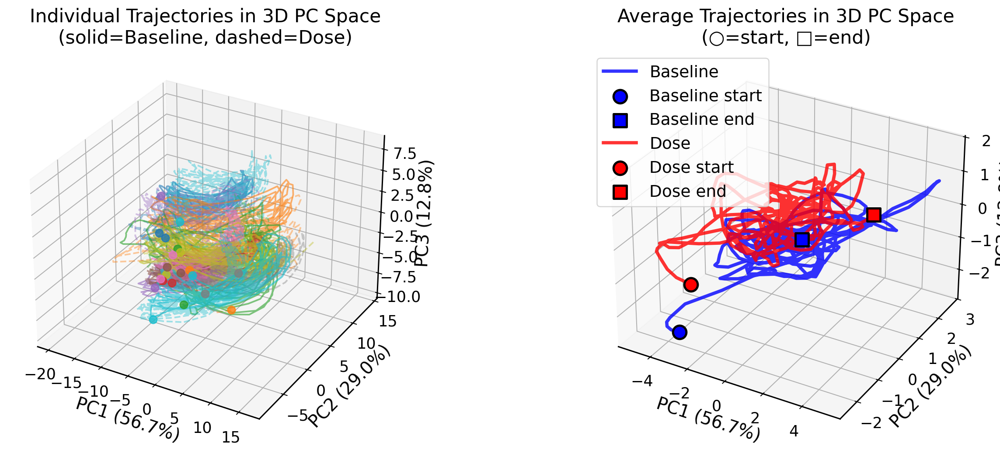

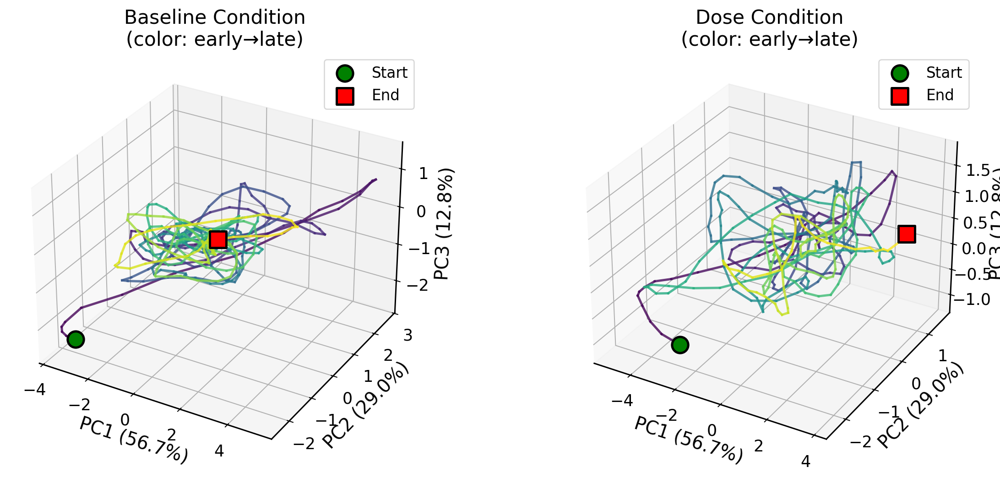

In [64]:
# =============================================================================
# Temporal PC Trajectories - How conditions evolve through task (3D)
# =============================================================================

from mpl_toolkits.mplot3d import Axes3D

# Use the frame-level arrays computed in the previous cell (do NOT overwrite them)
# frame_labels_arr, frame_pids_arr, frame_times_arr, X_frame_pca are expected to exist
# Build unique participant/condition combos that actually have frames
unique_combos = []
unique_pids = np.unique(frame_pids_arr)
for pid in unique_pids:
    for cond in ['Baseline', 'Dose']:
        mask = (frame_pids_arr == pid) & (frame_labels_arr == cond)
        if np.any(mask):
            unique_combos.append((pid, cond))

# Create colormap for participants
participant_colors = plt.cm.tab10(np.linspace(0, 1, len(unique_pids)))
pid_color_map = {pid: participant_colors[i] for i, pid in enumerate(unique_pids)}

# =============================================================================
# 1. Individual trajectories in 3D PC space
# =============================================================================
fig = plt.figure(figsize=(16, 6))

# Left plot: Individual participant trajectories
ax1 = fig.add_subplot(121, projection='3d')
for pid, cond in unique_combos:
    mask = (frame_pids_arr == pid) & (frame_labels_arr == cond)
    pc1_vals = X_frame_pca[mask, 0]
    pc2_vals = X_frame_pca[mask, 1]
    pc3_vals = X_frame_pca[mask, 2]
    
    linestyle = '-' if cond == 'Baseline' else '--'
    alpha = 0.6 if cond == 'Baseline' else 0.4
    
    ax1.plot(pc1_vals, pc2_vals, pc3_vals, 
             linestyle=linestyle, color=pid_color_map[pid], 
             alpha=alpha, linewidth=1.5)
    
    # Mark start point
    ax1.scatter(pc1_vals[0], pc2_vals[0], pc3_vals[0], 
               color=pid_color_map[pid], s=50, marker='o', alpha=0.8)

ax1.set_xlabel(f'PC1 ({var_frame[0]*100:.1f}%)')
ax1.set_ylabel(f'PC2 ({var_frame[1]*100:.1f}%)')
ax1.set_zlabel(f'PC3 ({var_frame[2]*100:.1f}%)')
ax1.set_title('Individual Trajectories in 3D PC Space\n(solid=Baseline, dashed=Dose)')

# Right plot: Average trajectories by condition
ax2 = fig.add_subplot(122, projection='3d')

for cond in ['Baseline', 'Dose']:
    cond_mask = frame_labels_arr == cond
    mean_pc1, mean_pc2, mean_pc3 = [], [], []
    
    for t in range(n_frames):
        time_mask = (frame_times_arr == t) & cond_mask
        if np.sum(time_mask) > 0:
            mean_pc1.append(np.mean(X_frame_pca[time_mask, 0]))
            mean_pc2.append(np.mean(X_frame_pca[time_mask, 1]))
            mean_pc3.append(np.mean(X_frame_pca[time_mask, 2]))
    
    color = colors[cond]
    
    # Plot trajectory
    ax2.plot(mean_pc1, mean_pc2, mean_pc3, 
            color=color, linewidth=3, label=cond, alpha=0.8)
    
    # Mark start and end
    if len(mean_pc1) > 0:
        ax2.scatter([mean_pc1[0]], [mean_pc2[0]], [mean_pc3[0]], 
                   color=color, s=150, marker='o', edgecolors='black', 
                   linewidths=2, zorder=5, label=f'{cond} start')
        ax2.scatter([mean_pc1[-1]], [mean_pc2[-1]], [mean_pc3[-1]], 
                   color=color, s=150, marker='s', edgecolors='black', 
                   linewidths=2, zorder=5, label=f'{cond} end')

ax2.set_xlabel(f'PC1 ({var_frame[0]*100:.1f}%)')
ax2.set_ylabel(f'PC2 ({var_frame[1]*100:.1f}%)')
ax2.set_zlabel(f'PC3 ({var_frame[2]*100:.1f}%)')
ax2.set_title('Average Trajectories in 3D PC Space\n(○=start, □=end)')
ax2.legend(loc='upper left', fontsize=15)

plt.tight_layout()
plt.savefig('plots/temporal_pca_trajectories_3d.png', dpi=600, bbox_inches='tight')
plt.show()

# =============================================================================
# 2. Time-colored trajectory plot
# =============================================================================
fig = plt.figure(figsize=(14, 6))

for idx, cond in enumerate(['Baseline', 'Dose']):
    ax = fig.add_subplot(1, 2, idx+1, projection='3d')
    
    cond_mask = frame_labels_arr == cond
    mean_pc1, mean_pc2, mean_pc3 = [], [], []
    
    for t in range(n_frames):
        time_mask = (frame_times_arr == t) & cond_mask
        if np.sum(time_mask) > 0:
            mean_pc1.append(np.mean(X_frame_pca[time_mask, 0]))
            mean_pc2.append(np.mean(X_frame_pca[time_mask, 1]))
            mean_pc3.append(np.mean(X_frame_pca[time_mask, 2]))
    
    # Create color gradient based on time
    time_colors = plt.cm.viridis(np.linspace(0, 1, len(mean_pc1)))
    
    # Plot segments with color gradient
    for i in range(len(mean_pc1)-1):
        ax.plot([mean_pc1[i], mean_pc1[i+1]], 
               [mean_pc2[i], mean_pc2[i+1]], 
               [mean_pc3[i], mean_pc3[i+1]],
               color=time_colors[i], linewidth=2, alpha=0.8)
    
    # Mark start and end
    ax.scatter([mean_pc1[0]], [mean_pc2[0]], [mean_pc3[0]], 
              color='green', s=200, marker='o', edgecolors='black', 
              linewidths=2, zorder=5, label='Start')
    ax.scatter([mean_pc1[-1]], [mean_pc2[-1]], [mean_pc3[-1]], 
              color='red', s=200, marker='s', edgecolors='black', 
              linewidths=2, zorder=5, label='End')
    
    ax.set_xlabel(f'PC1 ({var_frame[0]*100:.1f}%)')
    ax.set_ylabel(f'PC2 ({var_frame[1]*100:.1f}%)')
    ax.set_zlabel(f'PC3 ({var_frame[2]*100:.1f}%)')
    ax.set_title(f'{cond} Condition\n(color: early→late)')
    ax.legend()

plt.tight_layout()
plt.savefig('plots/temporal_pca_trajectories_3d_colored.png', dpi=600, bbox_inches='tight')
plt.show()

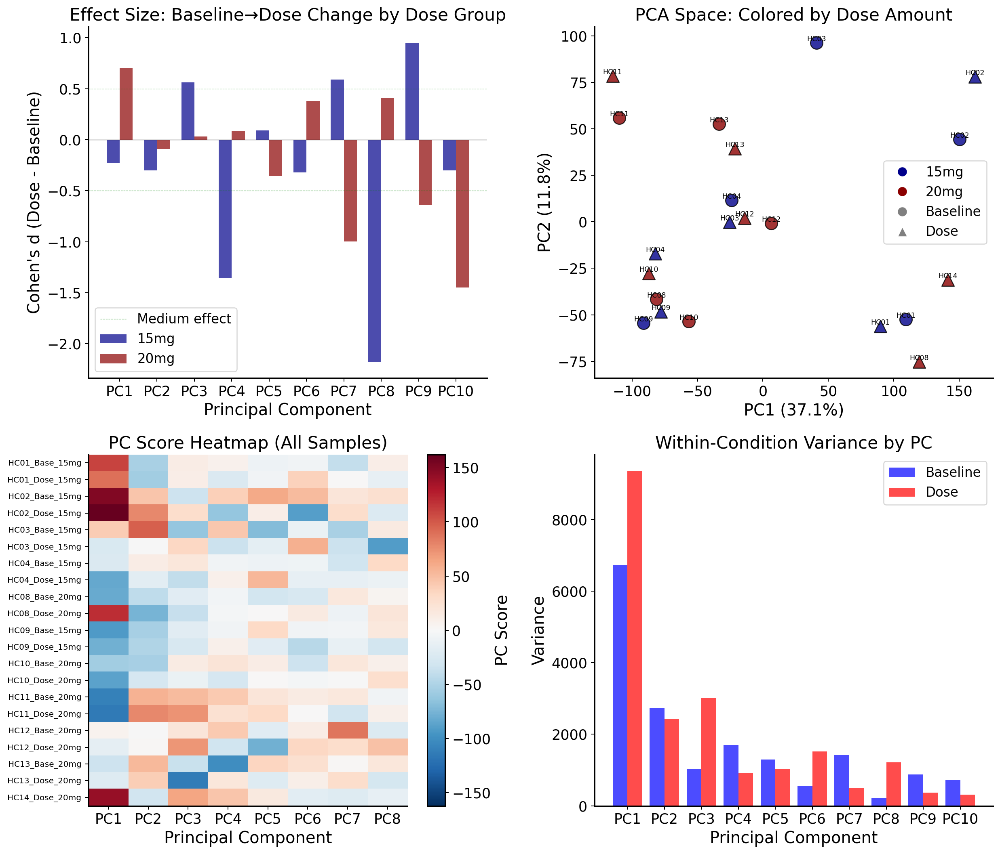


EFFECT SIZE SUMMARY: Baseline → Dose Change

Positive Cohen's d = Dose scores higher than Baseline
Negative Cohen's d = Dose scores lower than Baseline
|d| > 0.5 = Medium effect, |d| > 0.8 = Large effect

PC1: 15mg d=-0.231, 20mg d=+0.701
PC2: 15mg d=-0.300, 20mg d=-0.092
PC3: 15mg d=+0.562, 20mg d=+0.030
PC4: 15mg d=-1.356, 20mg d=+0.087
PC5: 15mg d=+0.091, 20mg d=-0.357
PC6: 15mg d=-0.319, 20mg d=+0.380
PC7: 15mg d=+0.591, 20mg d=-0.996
PC8: 15mg d=-2.178, 20mg d=+0.407
PC9: 15mg d=+0.952, 20mg d=-0.638
PC10: 15mg d=-0.303, 20mg d=-1.449


In [65]:
# =============================================================================
# Analysis by Dose Group (15mg vs 20mg) - Effect Size Analysis
# =============================================================================

# Split by dose group for within-group Baseline vs Dose comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Calculate effect sizes (Cohen's d) for each PC
def cohens_d(group1, group2):
    n1, n2 = len(group1), len(group2)
    var1, var2 = np.var(group1, ddof=1), np.var(group2, ddof=1)
    pooled_std = np.sqrt(((n1-1)*var1 + (n2-1)*var2) / (n1+n2-2))
    return (np.mean(group1) - np.mean(group2)) / pooled_std if pooled_std > 0 else 0

# Effect sizes for Baseline vs Dose within each dose group
effect_sizes_15mg = []
effect_sizes_20mg = []

for pc in range(min(10, X_traj_pca.shape[1])):
    # 15mg group
    mask_15mg_base = (analysis_data['dose_groups'] == '15mg') & (analysis_data['labels'] == 'Baseline')
    mask_15mg_dose = (analysis_data['dose_groups'] == '15mg') & (analysis_data['labels'] == 'Dose')
    if np.sum(mask_15mg_base) > 0 and np.sum(mask_15mg_dose) > 0:
        d_15 = cohens_d(X_traj_pca[mask_15mg_dose, pc], X_traj_pca[mask_15mg_base, pc])
    else:
        d_15 = 0
    effect_sizes_15mg.append(d_15)
    
    # 20mg group
    mask_20mg_base = (analysis_data['dose_groups'] == '20mg') & (analysis_data['labels'] == 'Baseline')
    mask_20mg_dose = (analysis_data['dose_groups'] == '20mg') & (analysis_data['labels'] == 'Dose')
    if np.sum(mask_20mg_base) > 0 and np.sum(mask_20mg_dose) > 0:
        d_20 = cohens_d(X_traj_pca[mask_20mg_dose, pc], X_traj_pca[mask_20mg_base, pc])
    else:
        d_20 = 0
    effect_sizes_20mg.append(d_20)

# Plot effect sizes
ax1 = axes[0, 0]
x_pos = np.arange(len(effect_sizes_15mg))
width = 0.35
bars1 = ax1.bar(x_pos - width/2, effect_sizes_15mg, width, label='15mg', color='darkblue', alpha=0.7)
bars2 = ax1.bar(x_pos + width/2, effect_sizes_20mg, width, label='20mg', color='darkred', alpha=0.7)
ax1.axhline(y=0, color='k', linestyle='-', linewidth=0.5)
ax1.axhline(y=0.5, color='g', linestyle='--', linewidth=0.5, alpha=0.5, label='Medium effect')
ax1.axhline(y=-0.5, color='g', linestyle='--', linewidth=0.5, alpha=0.5)
ax1.set_xlabel('Principal Component')
ax1.set_ylabel("Cohen's d (Dose - Baseline)")
ax1.set_title('Effect Size: Baseline→Dose Change by Dose Group')
ax1.set_xticks(x_pos)
ax1.set_xticklabels([f'PC{i+1}' for i in range(len(effect_sizes_15mg))])
ax1.legend()

# PC space colored by dose group (not condition)
ax2 = axes[0, 1]
dose_colors = {'15mg': 'darkblue', '20mg': 'darkred'}
for i in range(len(X_traj_pca)):
    condition = analysis_data['labels'][i]
    dose = analysis_data['dose_groups'][i]
    pid = analysis_data['participant_ids'][i]
    marker = 'o' if condition == 'Baseline' else '^'
    ax2.scatter(X_traj_pca[i, 0], X_traj_pca[i, 1], 
               c=dose_colors[dose], marker=marker, s=150, alpha=0.8,
               edgecolors='black', linewidths=1)
    ax2.annotate(pid, (X_traj_pca[i, 0], X_traj_pca[i, 1]), fontsize=7, ha='center', va='bottom')

from matplotlib.lines import Line2D
legend_dose = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='darkblue', markersize=10, label='15mg'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='darkred', markersize=10, label='20mg'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=10, label='Baseline'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markersize=10, label='Dose'),
]
ax2.legend(handles=legend_dose, loc='best')
ax2.set_xlabel(f'PC1 ({var_explained[0]*100:.1f}%)')
ax2.set_ylabel(f'PC2 ({var_explained[1]*100:.1f}%)')
ax2.set_title('PCA Space: Colored by Dose Amount')

# Heatmap of PC scores
ax3 = axes[1, 0]
# Create a matrix of PC scores organized by participant and condition
pc_matrix = []
row_labels = []
for pid in np.unique(analysis_data['participant_ids']):
    for cond in ['Baseline', 'Dose']:
        mask = (analysis_data['participant_ids'] == pid) & (analysis_data['labels'] == cond)
        if np.sum(mask) > 0:
            pc_matrix.append(X_traj_pca[mask][0, :8])  # First 8 PCs
            dose_label = '20mg' if pid in participant_with_20mg else '15mg'
            row_labels.append(f'{pid}_{cond[:4]}_{dose_label}')

pc_matrix = np.array(pc_matrix)
im = ax3.imshow(pc_matrix, aspect='auto', cmap='RdBu_r', vmin=-np.abs(pc_matrix).max(), vmax=np.abs(pc_matrix).max())
ax3.set_yticks(range(len(row_labels)))
ax3.set_yticklabels(row_labels, fontsize=8)
ax3.set_xticks(range(8))
ax3.set_xticklabels([f'PC{i+1}' for i in range(8)])
ax3.set_xlabel('Principal Component')
ax3.set_title('PC Score Heatmap (All Samples)')
plt.colorbar(im, ax=ax3, label='PC Score')

# Variance components by condition
ax4 = axes[1, 1]
# Calculate variance in each PC for baseline vs dose
var_by_cond = {'Baseline': [], 'Dose': []}
for pc in range(10):
    for cond in ['Baseline', 'Dose']:
        mask = analysis_data['labels'] == cond
        var_by_cond[cond].append(np.var(X_traj_pca[mask, pc]))

x = np.arange(10)
ax4.bar(x - 0.2, var_by_cond['Baseline'], 0.4, label='Baseline', color='blue', alpha=0.7)
ax4.bar(x + 0.2, var_by_cond['Dose'], 0.4, label='Dose', color='red', alpha=0.7)
ax4.set_xlabel('Principal Component')
ax4.set_ylabel('Variance')
ax4.set_title('Within-Condition Variance by PC')
ax4.set_xticks(x)
ax4.set_xticklabels([f'PC{i+1}' for i in range(10)])
ax4.legend()

plt.tight_layout()
plt.savefig('plots/dose_group_analysis.png', dpi=600, bbox_inches='tight')
plt.show()

# Print summary statistics
print("\n" + "="*70)
print("EFFECT SIZE SUMMARY: Baseline → Dose Change")
print("="*70)
print("\nPositive Cohen's d = Dose scores higher than Baseline")
print("Negative Cohen's d = Dose scores lower than Baseline")
print("|d| > 0.5 = Medium effect, |d| > 0.8 = Large effect\n")

for i, (d15, d20) in enumerate(zip(effect_sizes_15mg, effect_sizes_20mg)):
    print(f"PC{i+1}: 15mg d={d15:+.3f}, 20mg d={d20:+.3f}")

Quantifying Trajectory Shift for 10 participants...


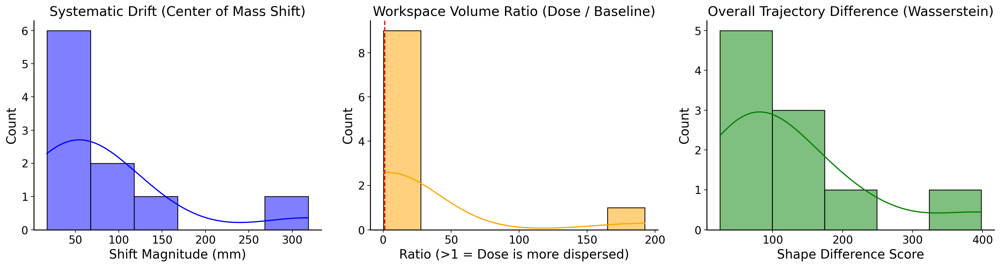

Mean Drift: 86.18 mm


In [66]:
def get_hand_centroid(hand_data):
    """
    Compute robust hand centroid (Mean of Wrist and Knuckles).
    hand_data: (Frames, 21, 3)
    """
    # Ensure input is a numpy array (avoid tuple-indexing errors on lists)
    hand_arr = np.asarray(hand_data)
    # MediaPipe indices: 0 (Wrist), 5 (Index_MCP), 9 (Middle_MCP), 13 (Ring_MCP), 17 (Pinky_MCP)
    stable_points = [0, 5, 9, 13, 17]
    if hand_arr.ndim != 3:
        raise ValueError("hand_data must have shape (Frames, 21, 3)")
    centroid = np.mean(hand_arr[:, stable_points, :], axis=1) # (Frames, 3)
    return centroid

from scipy.spatial.distance import cdist, directed_hausdorff
from scipy.stats import wasserstein_distance
from scipy.spatial import ConvexHull

def quantify_trajectory_shift(hand_timeseries, pids_with_both):
    results = []
    
    print(f"Quantifying Trajectory Shift for {len(pids_with_both)} participants...")
    
    for pid in pids_with_both:
        # 1. Get Centroids
        cent_base = get_hand_centroid(hand_timeseries[pid]['Baseline']['hand'])
        cent_dose = get_hand_centroid(hand_timeseries[pid]['Dose']['hand'])
        
        # 2. Metric A: Systematic Drift (Center of Mass shift)
        # "Did the average hand position move left/right/up?"
        mean_pos_base = np.mean(cent_base, axis=0)
        mean_pos_dose = np.mean(cent_dose, axis=0)
        drift_magnitude = np.linalg.norm(mean_pos_dose - mean_pos_base)
        
        # 3. Metric B: Workspace Volume (Convex Hull as proxy for range of motion)
        # "Is the Dose movement covering more space?"
        try:
            vol_base = ConvexHull(cent_base).volume
            vol_dose = ConvexHull(cent_dose).volume
            volume_ratio = vol_dose / vol_base
        except:
            volume_ratio = 1.0 # Fallback for flat 2D trajectories
            
        # 4. Metric C: Trajectory Divergence (Hausdorff Distance)
        # "What is the max distance between the two trajectory clouds?"
        # Measures the worst-case deviation between the two paths
        d_base_to_dose = directed_hausdorff(cent_base, cent_dose)[0]
        d_dose_to_base = directed_hausdorff(cent_dose, cent_base)[0]
        max_divergence = max(d_base_to_dose, d_dose_to_base)
        
        # 5. Metric D: Distribution Similarity (Wasserstein / Earth Mover's)
        # Sum of distances between distributions along the 3 axes
        w_dist = sum([wasserstein_distance(cent_base[:, i], cent_dose[:, i]) for i in range(3)])

        results.append({
            'Participant': pid,
            'Drift_mm': drift_magnitude,         # Systematic Bias
            'Volume_Ratio': volume_ratio,        # Spatial Precision (>1 = Dose is messier)
            'Max_Divergence_mm': max_divergence, # Peak Deviation
            'Distribution_Diff': w_dist          # Overall Shape Difference
        })
        
    return pd.DataFrame(results)

# Run
df_traj = quantify_trajectory_shift(hand_timeseries, participants_with_both)

# --- VISUALIZATION ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Did the hand shift position?
sns.histplot(data=df_traj, x='Drift_mm', ax=axes[0], kde=True, color='blue')
axes[0].set_title('Systematic Drift (Center of Mass Shift)')
axes[0].set_xlabel('Shift Magnitude (mm)')

# Plot 2: Is the Dose movement larger/messier?
sns.histplot(data=df_traj, x='Volume_Ratio', ax=axes[1], kde=True, color='orange')
axes[1].axvline(1.0, color='r', linestyle='--')
axes[1].set_title('Workspace Volume Ratio (Dose / Baseline)')
axes[1].set_xlabel('Ratio (>1 = Dose is more dispersed)')

# Plot 3: How different are the shapes?
sns.histplot(data=df_traj, x='Distribution_Diff', ax=axes[2], kde=True, color='green')
axes[2].set_title('Overall Trajectory Difference (Wasserstein)')
axes[2].set_xlabel('Shape Difference Score')

plt.tight_layout()
plt.show()

# Stats
print(f"Mean Drift: {df_traj['Drift_mm'].mean():.2f} mm")


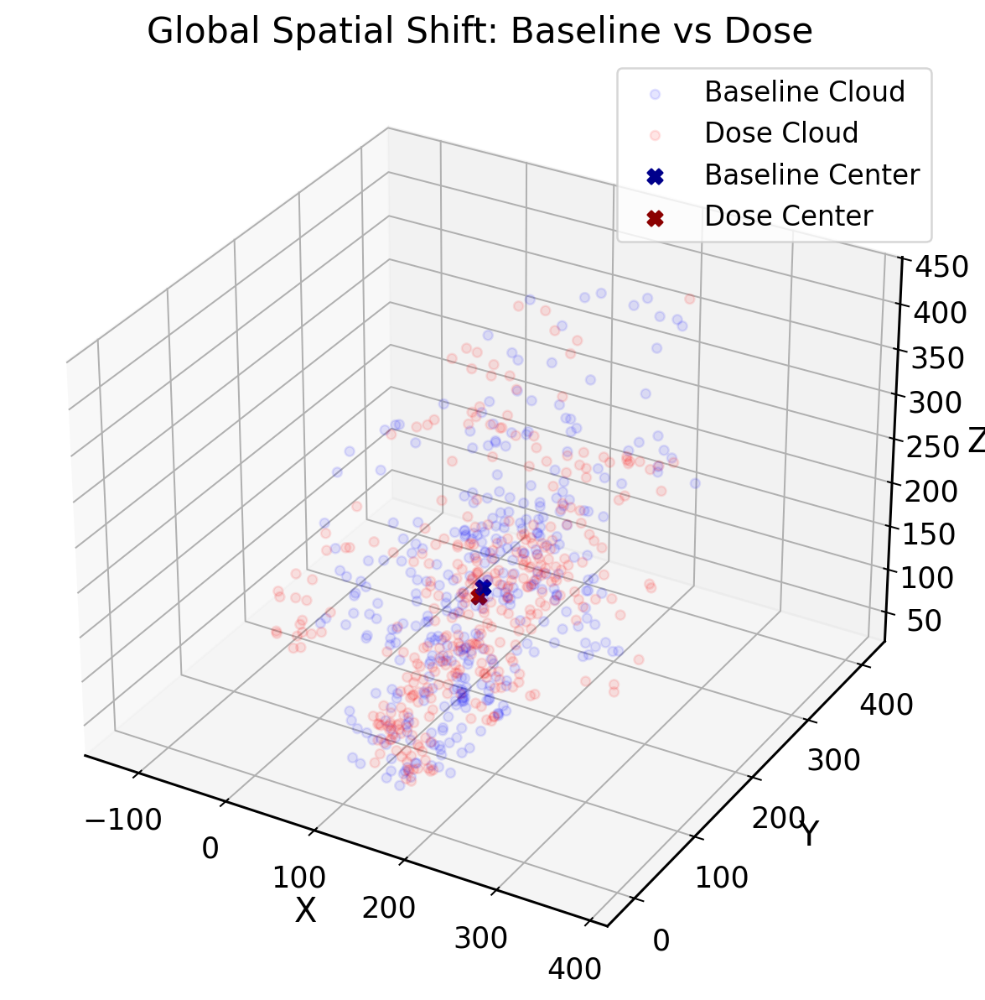

In [67]:
# Create a "Mean Cycle" visualization
# Simply aggregate all points for all participants to see the global "cloud" shift
all_base = np.concatenate([get_hand_centroid(hand_timeseries[pid]['Baseline']['hand']) for pid in participants_with_both])
all_dose = np.concatenate([get_hand_centroid(hand_timeseries[pid]['Dose']['hand']) for pid in participants_with_both])

plt.figure(figsize=(10, 8))
ax = plt.axes(projection='3d')

# Plot density or simple scatter of the global cloud (subsampled for speed)
ax.scatter(all_base[::10, 0], all_base[::10, 1], all_base[::10, 2], alpha=0.1, c='blue', label='Baseline Cloud')
ax.scatter(all_dose[::10, 0], all_dose[::10, 1], all_dose[::10, 2], alpha=0.1, c='red', label='Dose Cloud')

# Plot Centroids of the Clouds
ax.scatter(all_base[:,0].mean(), all_base[:,1].mean(), all_base[:,2].mean(), s=50, c='darkblue', marker='X', label='Baseline Center')
ax.scatter(all_dose[:,0].mean(), all_dose[:,1].mean(), all_dose[:,2].mean(), s=50, c='darkred', marker='X', label='Dose Center')

ax.set_title("Global Spatial Shift: Baseline vs Dose")
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
plt.legend()
plt.show()

## Trajectory drift test

Analyzing Drift Direction for 10 participants...


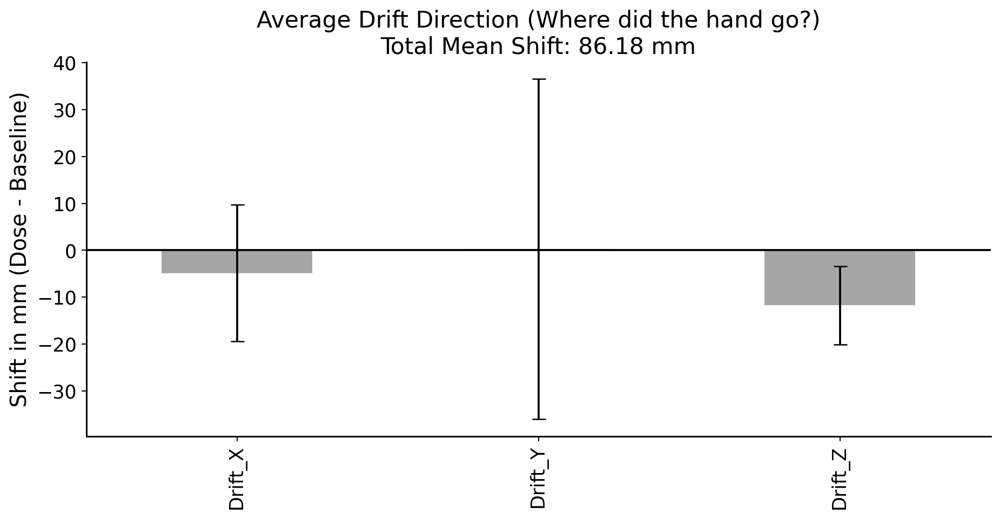

Initializing NUTS using jitter+adapt_diag...


Mean Z-Shift (Height): -11.73 mm ± 8.34
Mean Y-Shift (Front/Back): 0.29 mm ± 36.29
Mean X-Shift (Left/Right): -4.89 mm ± 14.58
Running Bayesian Drift Analysis...


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [drift_sigma]


Output()

Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 1 seconds.


In [68]:


def analyze_drift_vector(hand_timeseries, pids_with_both):
    """
    Compute the mean centroid per condition and decompose the drift into X, Y, Z components.
    Returns a DataFrame with scalar Drift_X/Y/Z and Drift_Magnitude per participant.
    """
    results = []
    
    print(f"Analyzing Drift Direction for {len(pids_with_both)} participants...")
    
    for pid in pids_with_both:
        # Get per-frame centroids (Frames, 3)
        c_base = np.asarray(get_hand_centroid(hand_timeseries[pid]['Baseline']['hand']))  # (F,3)
        c_dose = np.asarray(get_hand_centroid(hand_timeseries[pid]['Dose']['hand']))      # (F,3)
        
        # Use the mean centroid over time for each condition
        mean_base = np.mean(c_base, axis=0)
        mean_dose = np.mean(c_dose, axis=0)
        
        # Calculate Vector: Dose - Baseline (scalar per axis)
        # Positive Z = Hand moved HIGHER
        drift_vector = mean_dose - mean_base
        
        results.append({
            'Participant': pid,
            'Drift_X': float(drift_vector[0]),
            'Drift_Y': float(drift_vector[1]),
            'Drift_Z': float(drift_vector[2]),
            'Drift_Magnitude': float(np.linalg.norm(drift_vector))
        })
        
    return pd.DataFrame(results)

def bayesian_drift_test(df_drift):
    """
    Tests if the drift magnitude is meaningfully different from zero using a simple Bayesian model.
    """
    print("Running Bayesian Drift Analysis...")
    
    drift_mag = df_drift['Drift_Magnitude'].values
    
    with pm.Model() as model:
        # Prior on scale
        sigma = pm.HalfNormal("drift_sigma", sigma=100)
        # Observations: HalfNormal with learned sigma
        obs = pm.HalfNormal("obs_drift", sigma=sigma, observed=drift_mag)
        trace = pm.sample(3000, tune=1000, chains=4, return_inferencedata=True, progressbar=True)
        
    return trace

# --- EXECUTION ---
# 1. Get Directional Data (participants_with_both is defined in earlier cells)
df_drift_vec = analyze_drift_vector(hand_timeseries, participants_with_both)

# 2. Visualize Direction
plt.figure(figsize=(12, 5))
drift_means = df_drift_vec[['Drift_X', 'Drift_Y', 'Drift_Z']].mean()
drift_se = df_drift_vec[['Drift_X', 'Drift_Y', 'Drift_Z']].sem()

# Bar plot of XYZ shifts (now numeric)
colors = ['gray', 'gray', 'gray']  # highlight Z if desired
drift_means.plot(kind='bar', yerr=drift_se, capsize=5, color=colors, alpha=0.7)
plt.axhline(0, color='k')
plt.title(f"Average Drift Direction (Where did the hand go?)\nTotal Mean Shift: {df_drift_vec['Drift_Magnitude'].mean():.2f} mm")
plt.ylabel("Shift in mm (Dose - Baseline)")
plt.show()

# 3. Print Directions
print(f"Mean Z-Shift (Height): {drift_means['Drift_Z']:.2f} mm ± {drift_se['Drift_Z']:.2f}")
print(f"Mean Y-Shift (Front/Back): {drift_means['Drift_Y']:.2f} mm ± {drift_se['Drift_Y']:.2f}")
print(f"Mean X-Shift (Left/Right): {drift_means['Drift_X']:.2f} mm ± {drift_se['Drift_X']:.2f}")

# 4. (Optional) Run Bayesian test on the magnitudes
trace_drift = bayesian_drift_test(df_drift_vec)

In [69]:
np.array(hand_timeseries['HC01']['Baseline']['hand'])[:,0:,:]

array([[[ 67.89819954, 321.37775518, 146.81692346],
        [ 93.8628438 , 317.59222707, 133.53311263],
        [110.54932997, 311.19477802, 107.34982544],
        ...,
        [  6.90882656, 309.12253931,  83.89523703],
        [ 11.00671324, 304.43592722,  63.59817476],
        [ 19.56724174, 301.64166432,  52.33659545]],

       [[ 60.24677704, 321.99565749, 148.51651854],
        [ 91.62990317, 317.26552941, 131.77239377],
        [109.65879937, 309.27577008,  98.6861845 ],
        ...,
        [  7.4826672 , 305.82895315,  69.31452983],
        [ 14.26834942, 301.44724642,  50.74364813],
        [ 23.34866659, 298.78923693,  40.15989629]],

       [[ 52.40851048, 322.75227042, 150.80784792],
        [ 86.02086845, 317.52365841, 132.15111187],
        [107.39933546, 308.91742926,  96.78098234],
        ...,
        [  7.34062758, 304.52820925,  63.50551311],
        [ 19.72864756, 300.47509278,  47.16643685],
        [ 32.36126636, 299.2605015 ,  43.49500831]],

       ...,

      

AUDITING WRIST DATA for 10 participants...


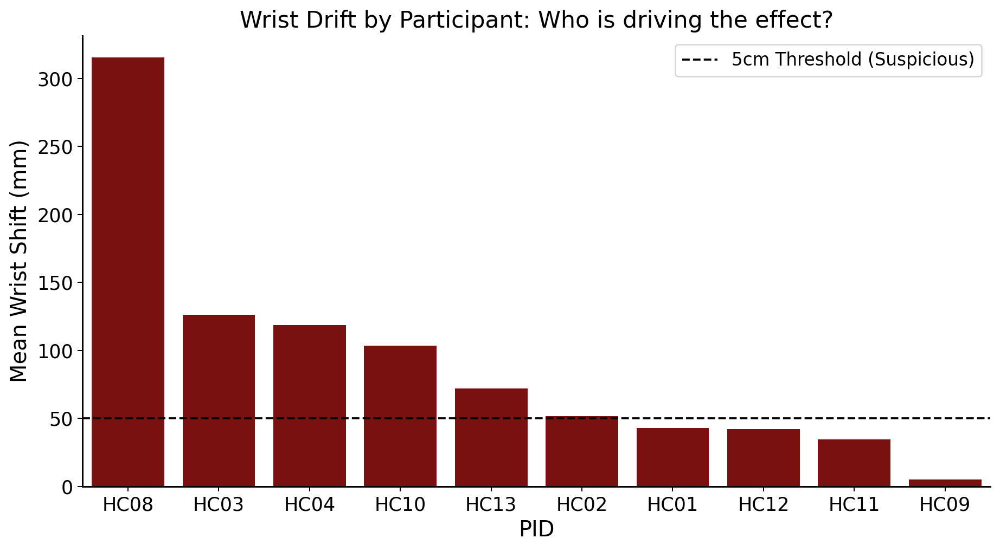

=== WRIST DRIFT AUDIT REPORT ===
Top 3 drivers of the spatial shift:
    PID    Drift_mm  Drift_Z_mm  Jitter_Ratio
4  HC08  315.611234  -12.930118      1.673547
2  HC03  126.092943  -51.168564      0.945117
3  HC04  118.737650  -52.448987      0.964158

--- Outlier Detection Rules ---
1. If Drift > 50mm AND Jitter Ratio ~ 1.0: Check Camera Position.
   (The participant likely sat in a different spot, or camera moved)
2. If Jitter Ratio > 2.0: Check Tracking Quality.
   (The model likely lost the wrist in the Dose condition)


In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def audit_wrist_drift(hand_timeseries, pids_with_both):
    """
    Identifies which participants are driving the massive Wrist Drift.
    Calculates shift in Mean Wrist Position between Baseline and Dose.
    """
    suspects = []
    
    print(f"AUDITING WRIST DATA for {len(pids_with_both)} participants...")
    
    for pid in pids_with_both:
        # Get Wrist Data Only (Landmark Index 0)
        # Shape: (Frames, 3)
        wrist_base = np.array(hand_timeseries[pid]['Baseline']['hand'])[:, 0, :]
        wrist_dose = np.array(hand_timeseries[pid]['Dose']['hand'])[:, 0, :]
        
        # 1. Calculate Mean Positions
        mean_base = np.mean(wrist_base, axis=0)
        mean_dose = np.mean(wrist_dose, axis=0)
        
        # 2. Calculate Drift (Euclidean Distance between means)
        drift_mm = np.linalg.norm(mean_dose - mean_base)
        
        # 3. Calculate "Jitter" (Standard Deviation of the point cloud)
        # If Jitter is huge, the tracker might be flickering
        jitter_base = np.mean(np.std(wrist_base, axis=0))
        jitter_dose = np.mean(np.std(wrist_dose, axis=0))
        jitter_ratio = jitter_dose / jitter_base if jitter_base > 0 else 0
        
        # 4. Direction of Drift (Is it mostly Z/Height?)
        diff_vec = mean_dose - mean_base
        
        suspects.append({
            'PID': pid,
            'Drift_mm': drift_mm,
            'Drift_Z_mm': diff_vec[2], # Vertical shift
            'Jitter_Base': jitter_base,
            'Jitter_Dose': jitter_dose,
            'Jitter_Ratio': jitter_ratio, # >1 means Dose is shakier
            'Dose_Group': '20mg' if pid in participants_with_20mg else '15mg' # assuming this list exists
        })
    
    df_suspects = pd.DataFrame(suspects)
    
    # Sort by Drift Magnitude (Highest deviation first)
    df_sorted = df_suspects.sort_values('Drift_mm', ascending=False)
    
    return df_sorted

# --- EXECUTE ---
# (Assumes 'hand_timeseries' and 'participants_with_both' are loaded)
# You might need to define 'participants_with_20mg' or remove that column if unavailable
participants_with_20mg = [] # Placeholder if not available in current scope
df_audit = audit_wrist_drift(hand_timeseries, participants_with_both)

# --- VISUALIZE THE CULPRITS ---
plt.figure(figsize=(12, 6))
sns.barplot(data=df_audit, x='PID', y='Drift_mm', color='darkred')
plt.axhline(y=50, color='k', linestyle='--', label='5cm Threshold (Suspicious)')
plt.title("Wrist Drift by Participant: Who is driving the effect?")
plt.ylabel("Mean Wrist Shift (mm)")
plt.legend()
plt.show()

# --- PRINT REPORT ---
print("=== WRIST DRIFT AUDIT REPORT ===")
print("Top 3 drivers of the spatial shift:")
print(df_audit[['PID', 'Drift_mm', 'Drift_Z_mm', 'Jitter_Ratio']].head(3))

print("\n--- Outlier Detection Rules ---")
print("1. If Drift > 50mm AND Jitter Ratio ~ 1.0: Check Camera Position.")
print("   (The participant likely sat in a different spot, or camera moved)")
print("2. If Jitter Ratio > 2.0: Check Tracking Quality.")
print("   (The model likely lost the wrist in the Dose condition)")

## Non linear manifold

Running Kernel PCA (RBF)...


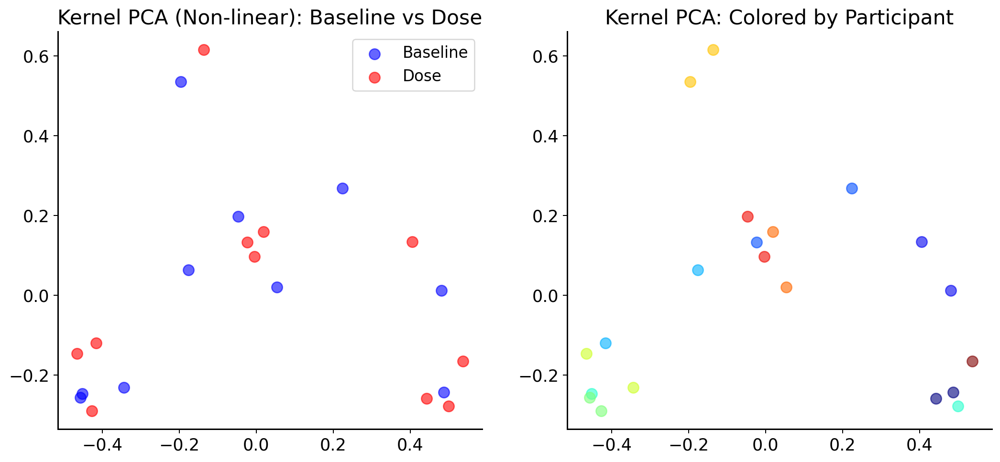

In [71]:
from sklearn.decomposition import KernelPCA

def analyze_nonlinear_manifold(X_scaled, labels, pids):
    print("Running Kernel PCA (RBF)...")
    
    # RBF Kernel allows for non-linear separation
    # gamma determines "curviness" - usually 1/n_features, but tuning helps
    kpca = KernelPCA(n_components=6, kernel='rbf', gamma=None, fit_inverse_transform=False)
    X_kpca = kpca.fit_transform(X_scaled)
    
    # Plotting KPCA 1 vs 2
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot by Condition
    ax = axes[0]
    for label, color, marker in zip(['Baseline', 'Dose'], ['blue', 'red'], ['o', '^']):
        mask = labels == label
        ax.scatter(X_kpca[mask, 0], X_kpca[mask, 1], c=color, label=label, alpha=0.6, s=80)
    ax.set_title("Kernel PCA (Non-linear): Baseline vs Dose")
    ax.legend()
    
    # Plot by Participant (to see if identity still dominates)
    ax = axes[1]
    unique_pids = np.unique(pids)
    colors = plt.cm.jet(np.linspace(0, 1, len(unique_pids)))
    for pid, color in zip(unique_pids, colors):
        mask = pids == pid
        ax.scatter(X_kpca[mask, 0], X_kpca[mask, 1], color=color, alpha=0.6, s=80)
    ax.set_title("Kernel PCA: Colored by Participant")
    
    plt.show()
    
    return X_kpca

X_kpca = analyze_nonlinear_manifold(X_traj_scaled, analysis_data['labels'], analysis_data['participant_ids'])

LDA Classification Accuracy (Leave-One-Group-Out CV): 0.590 ± 0.218


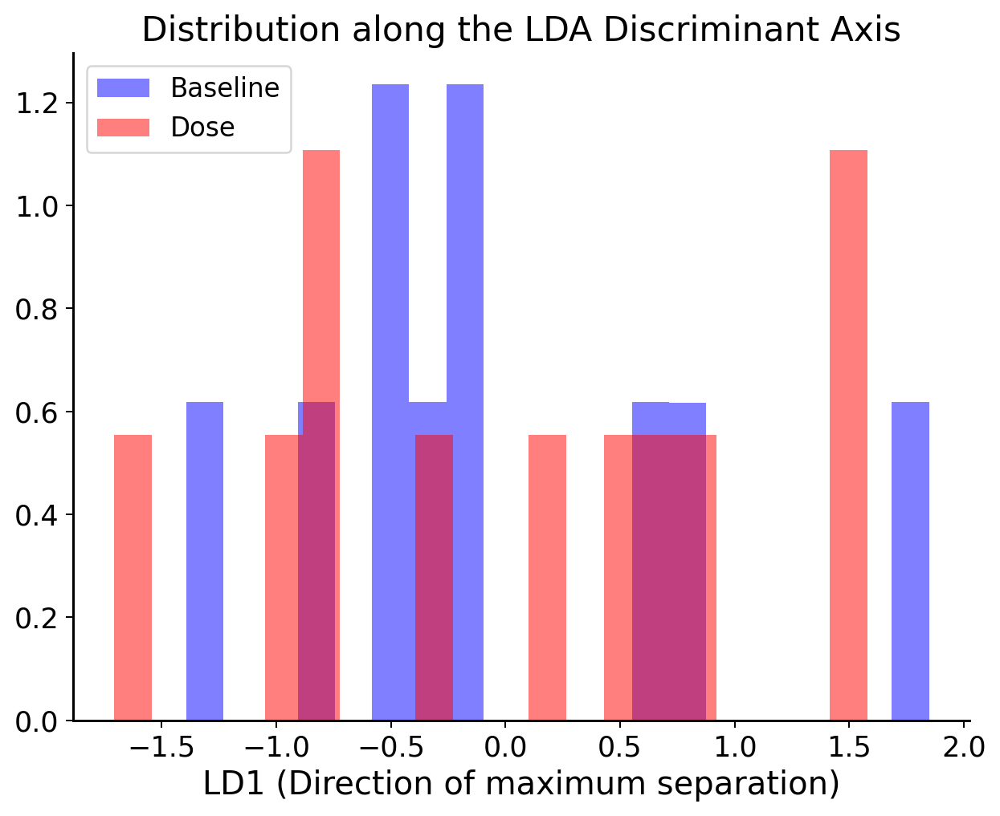

In [72]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold

def check_separability_lda(X, labels, pids):
    # LDA reduces to (n_classes - 1) dimensions. Here: 1 Dimension.
    lda = LinearDiscriminantAnalysis()
    
    # We use Cross-Validation to ensure we aren't overfitting
    # We must group by Participant to prevent data leakage 
    # (i.e., don't train on participant A's baseline and test on A's dose)
    
    from sklearn.model_selection import GroupKFold
    gkf = GroupKFold(n_splits=5)
    
    scores = cross_val_score(lda, X, labels, groups=pids, cv=gkf, scoring='accuracy')
    
    print(f"LDA Classification Accuracy (Leave-One-Group-Out CV): {np.mean(scores):.3f} ± {np.std(scores):.3f}")
    
    # Fit on whole dataset to visualize the "Discriminant Axis"
    X_lda = lda.fit_transform(X, labels)
    
    plt.figure(figsize=(8, 6))
    
    # Histogram of the Discriminant Dimension
    for label, color in zip(['Baseline', 'Dose'], ['blue', 'red']):
        subset = X_lda[labels == label]
        plt.hist(subset, bins=20, alpha=0.5, label=label, color=color, density=True)
        
    plt.title("Distribution along the LDA Discriminant Axis")
    plt.xlabel("LD1 (Direction of maximum separation)")
    plt.legend()
    plt.show()

# Run LDA on the top 20 PCs (to avoid noise from PC300+)
check_separability_lda(X_traj_pca[:, :20], analysis_data['labels'], analysis_data['participant_ids'])

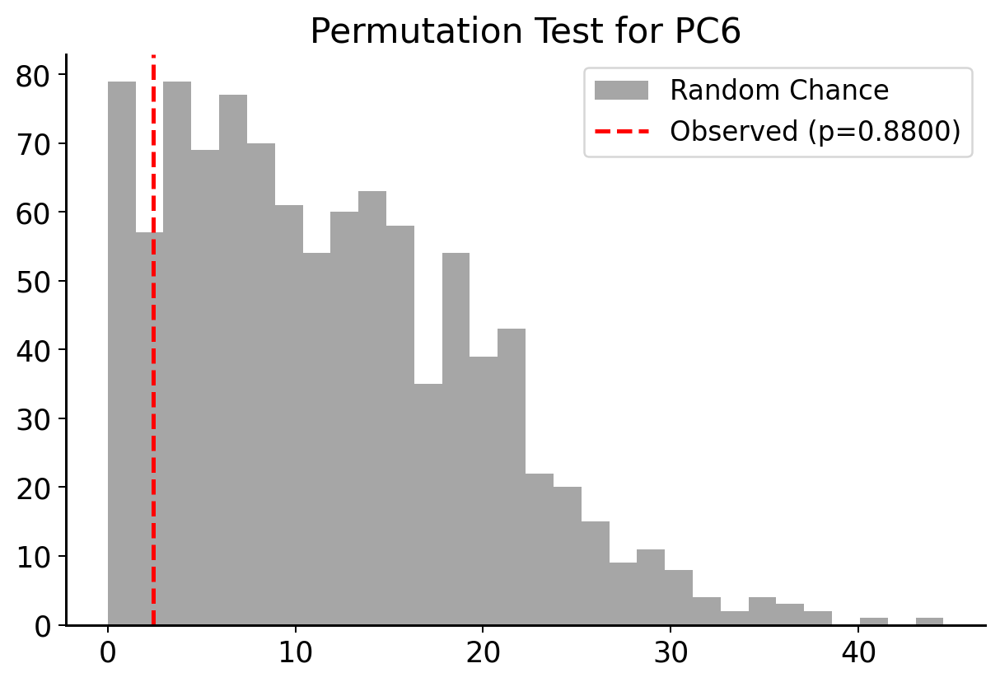

In [73]:
def permutation_test_pc(pc_scores, labels, pids, pc_idx=5, n_permutations=1000):
    # Calculate observed t-statistic
    baseline = pc_scores[labels == 'Baseline', pc_idx]
    dose = pc_scores[labels == 'Dose', pc_idx]
    obs_diff = np.abs(np.mean(baseline) - np.mean(dose))
    
    permuted_diffs = []
    
    for _ in range(n_permutations):
        # Shuffle labels WITHIN participants (to keep structure)
        # Simplification: Global shuffle if paired structure is complex to vectorise quickly
        # But ideally, we swap baseline/dose for random subset of participants
        
        shuffled_labels = labels.copy()
        np.random.shuffle(shuffled_labels) 
        
        p_base = pc_scores[shuffled_labels == 'Baseline', pc_idx]
        p_dose = pc_scores[shuffled_labels == 'Dose', pc_idx]
        
        if len(p_base) > 0 and len(p_dose) > 0:
            permuted_diffs.append(np.abs(np.mean(p_base) - np.mean(p_dose)))
            
    permuted_diffs = np.array(permuted_diffs)
    p_value = np.sum(permuted_diffs >= obs_diff) / n_permutations
    
    plt.figure(figsize=(8, 5))
    plt.hist(permuted_diffs, bins=30, alpha=0.7, color='gray', label='Random Chance')
    plt.axvline(obs_diff, color='red', linestyle='--', linewidth=2, label=f'Observed (p={p_value:.4f})')
    plt.title(f"Permutation Test for PC{pc_idx+1}")
    plt.legend()
    plt.show()

permutation_test_pc(X_traj_pca, analysis_data['labels'], analysis_data['participant_ids'], pc_idx=5)

## Dynamical system analysis

--- Running Dynamical Systems Analysis ---


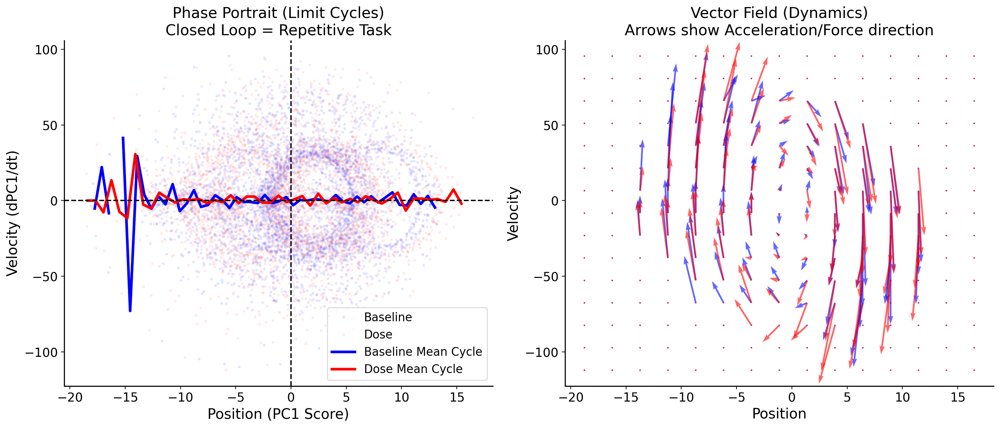

--- Stability Analysis (Stiffness near Turnarounds) ---

--- Noise Floor Analysis ---
Signal Range (PC1): 34.1347
Estimated Jitter (Std Dev): 0.7720
Signal-to-Noise Ratio (SNR): 44.21
Signal quality looks acceptable for differentiation.
Condition       | Stiffness (k)   | R2 Score   | Status
-----------------------------------------------------------------
Baseline        | 21.9976          | 0.2293     | ⚠️ High Noise / Non-Linear
Dose            | 9.0172          | 0.1207     | ⚠️ High Noise / Non-Linear


In [74]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from scipy import stats

def dynamical_systems_analysis(pca_scores, labels, pids, dt=1/30): # Assuming 30fps
    """
    Performs Phase Space and Vector Field analysis on the dominant PC.
    """
    print("--- Running Dynamical Systems Analysis ---")
    
    # 1. Smooth and Differentiate to get Velocity and Acceleration
    # We use Savitzky-Golay filter to smooth noise before differentiating
    window_length = 15
    poly_order = 3
    
    # Position (PC1)
    x = pca_scores[:, 0]
    
    # Reshape to (Participants * Conditions, Time) to differentiate correctly per trial
    # Note: This is an approximation assuming trials are concatenated. 
    # Ideally, loop through participants like previous functions.
    # For this snippet, we assume continuous blocks need treating carefully or per-participant loops.
    # Let's pivot to per-participant processing for accuracy:
    
    phase_data = []
    
    unique_pids = np.unique(pids)
    
    for pid in unique_pids:
        for cond in ['Baseline', 'Dose']:
            # Find indices for this specific trial
            mask = (pids == pid) & (labels == cond)
            if np.sum(mask) == 0: continue
            
            # Extract PC1 trajectory for this person/condition
            traj_x = x[mask]
            
            # Safety check: Ensure trajectory is long enough for the filter
            if len(traj_x) <= window_length:
                print(f"Skipping {pid} {cond}: Trajectory length ({len(traj_x)}) too short for window ({window_length})")
                continue

            # Smooth Position
            traj_x_smooth = savgol_filter(traj_x, window_length, poly_order)
            
            # First Derivative (Velocity)
            traj_v = np.gradient(traj_x_smooth, dt)
            
            # Second Derivative (Acceleration / Force)
            traj_a = np.gradient(traj_v, dt)
            
            # Store point-by-point data for Vector Field
            for i in range(len(traj_x)):
                phase_data.append({
                    'PID': pid,
                    'Condition': cond,
                    'x': traj_x_smooth[i],   # Position (PC1)
                    'v': traj_v[i],          # Velocity
                    'a': traj_a[i]           # Acceleration (Force)
                })

    df_phase = pd.DataFrame(phase_data)
    
    return df_phase


if 'X_frame_pca' in locals():
    df_phase = dynamical_systems_analysis(X_frame_pca, frame_labels_arr, frame_pids_arr)
else:
    print("Error: X_frame_pca not found. Please run the 'Temporal PCA Analysis' section first.")

# --- VISUALIZATION ---

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Plot 1: Phase Portrait (Position vs Velocity)
# This reveals the "Limit Cycle"
sns.scatterplot(
    data=df_phase, x='x', y='v', hue='Condition', 
    style='Condition', alpha=0.1, s=10, ax=axes[0], palette={'Baseline': 'blue', 'Dose': 'red'}
)
# Add Mean Limit Cycles
for cond, color in zip(['Baseline', 'Dose'], ['blue', 'red']):
    subset = df_phase[df_phase['Condition'] == cond]
    # Bin the data to find mean velocity at each position
    bins = np.linspace(subset['x'].min(), subset['x'].max(), 50)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    digitized = np.digitize(subset['x'], bins)
    mean_v = [subset['v'][digitized == i].mean() for i in range(1, len(bins))]
    
    axes[0].plot(bin_centers, mean_v, color=color, linewidth=3, label=f'{cond} Mean Cycle')

axes[0].set_title("Phase Portrait (Limit Cycles)\nClosed Loop = Repetitive Task")
axes[0].set_xlabel("Position (PC1 Score)")
axes[0].set_ylabel("Velocity (dPC1/dt)")
axes[0].axhline(0, color='k', linestyle='--')
axes[0].axvline(0, color='k', linestyle='--')
axes[0].legend()


# Plot 2: Vector Field (The "Forces")
# We calculate the mean acceleration (arrow direction) at grid points
ax2 = axes[1]

# Define grid
x_grid = np.linspace(df_phase['x'].min(), df_phase['x'].max(), 15)
v_grid = np.linspace(df_phase['v'].min(), df_phase['v'].max(), 15)

# Calculate mean flow for Baseline (Blue arrows) and Dose (Red arrows)
for cond, color in zip(['Baseline', 'Dose'], ['blue', 'red']):
    u_flow = np.zeros((15, 15)) # x-component of arrow (velocity)
    v_flow = np.zeros((15, 15)) # y-component of arrow (acceleration)
    
    subset = df_phase[df_phase['Condition'] == cond]
    
    for i in range(14):
        for j in range(14):
            # Find points in this grid cell
            mask = (subset['x'] >= x_grid[i]) & (subset['x'] < x_grid[i+1]) & \
                   (subset['v'] >= v_grid[j]) & (subset['v'] < v_grid[j+1])
            
            if np.sum(mask) > 5: # Only plot if we have data
                u_flow[j, i] = subset['v'][mask].mean()
                v_flow[j, i] = subset['a'][mask].mean()
    
    # Plot Quiver
    ax2.quiver(x_grid, v_grid, u_flow, v_flow, color=color, alpha=0.6, label=cond)

ax2.set_title("Vector Field (Dynamics)\nArrows show Acceleration/Force direction")
ax2.set_xlabel("Position")
ax2.set_ylabel("Velocity")

plt.tight_layout()
plt.show()

# --- STABILITY METRIC: STIFFNESS ---
# Estimate stiffness near the "Fixed Points" (where Velocity crosses 0)
# Stiffness ~ d(Acceleration)/d(Position)
print("--- Stability Analysis (Stiffness near Turnarounds) ---")


def evaluate_stiffness_fit(df_phase, min_r2=0.5):
    """
    Calculates Stiffness (slope), R-squared, and Signal Quality.
    """
    results = []
    
    print(f"{'Condition':<15} | {'Stiffness (k)':<15} | {'R2 Score':<10} | {'Status'}")
    print("-" * 65)

    for cond in ['Baseline', 'Dose']:
        # 1. Filter for 'Turnaround' points (Low Velocity)
        # We only want data where the limb is changing direction (v ~ 0)
        subset = df_phase[
            (df_phase['Condition'] == cond) & 
            (np.abs(df_phase['v']) < 0.5)  # Adjust this threshold if needed
        ]
        
        if len(subset) < 10:
            print(f"{cond:<15} | {'Not enough data':<15}")
            continue

        # 2. Linear Regression (Hooke's Law: a = -k * x)
        # Note: We fit a = -k*x + c. 
        slope, intercept, r_value, p_value, std_err = stats.linregress(subset['x'], subset['a'])
        
        k = -slope  # Stiffness is negative of the slope
        r_squared = r_value**2
        
        # 3. Decision Logic
        status = "✅ Valid" if r_squared > min_r2 else "⚠️ High Noise / Non-Linear"
        
        results.append({
            'Condition': cond,
            'Stiffness_k': k,
            'R2': r_squared,
            'Std_Error': std_err,
            'N_Points': len(subset)
        })
        
        print(f"{cond:<15} | {k:.4f}          | {r_squared:.4f}     | {status}")

    return pd.DataFrame(results)

# --- NOISE DIAGNOSTIC TOOL ---
def analyze_signal_noise(pca_scores, window=15, poly=3):
    """
    Estimates the 'Pixel Jitter' by comparing Raw vs. Smoothed data.
    """
    raw = pca_scores[:, 0]
    smooth = savgol_filter(raw, window_length=window, polyorder=poly)
    
    # The 'Noise' is the difference between Raw and Smooth
    noise = raw - smooth
    
    signal_range = np.max(smooth) - np.min(smooth)
    noise_std = np.std(noise)
    
    snr = signal_range / noise_std if noise_std > 0 else np.inf
    
    print("\n--- Noise Floor Analysis ---")
    print(f"Signal Range (PC1): {signal_range:.4f}")
    print(f"Estimated Jitter (Std Dev): {noise_std:.4f}")
    print(f"Signal-to-Noise Ratio (SNR): {snr:.2f}")
    
    if snr < 10:
        print("WARNING: SNR < 10. Your position data is very noisy.")
        print("Stiffness estimates (2nd derivative) will likely be invalid.")
    else:
        print("Signal quality looks acceptable for differentiation.")

# --- RUN THE CHECKS ---
# 1. Run Noise Analysis first
analyze_signal_noise(X_frame_pca)

# 2. Run Stiffness fit with R2
stiffness_stats = evaluate_stiffness_fit(df_phase)

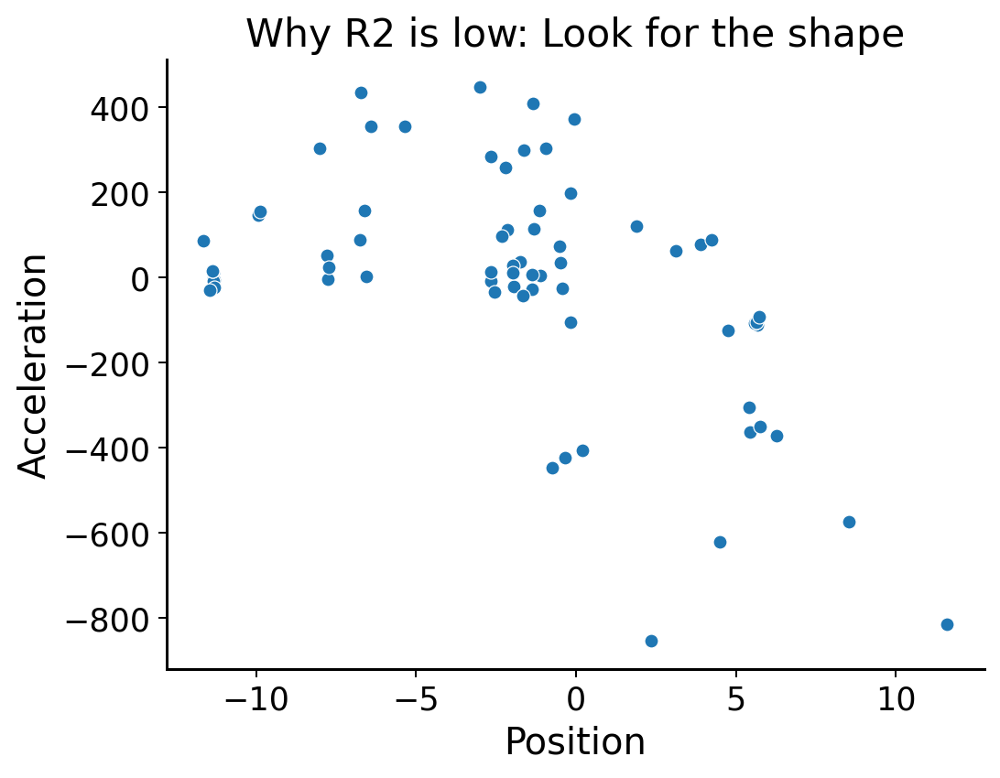

In [75]:
# Quick debug plot
subset = df_phase[(df_phase['Condition'] == 'Baseline') & (np.abs(df_phase['v']) < 0.5)]
sns.scatterplot(x=subset['x'], y=subset['a'])
plt.title("Why R2 is low: Look for the shape")
plt.xlabel("Position")
plt.ylabel("Acceleration")
plt.show()

           count      mean       std       min       25%       50%       75%  \
Condition                                                                      
Baseline    10.0 -6.877353  0.362468 -7.283277 -7.070746 -6.961915 -6.815826   
Dose        11.0 -6.588909  0.650643 -7.660337 -7.047713 -6.764479 -5.963277   

                max  
Condition            
Baseline  -6.061551  
Dose      -5.704028  


/var/folders/8l/lvwkyjcx0_z8571ry2j7g3nr0000gq/T/ipykernel_28881/2961321870.py:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_smoothness, x='Condition', y='LDLJ', palette={'Baseline': 'blue', 'Dose': 'red'})


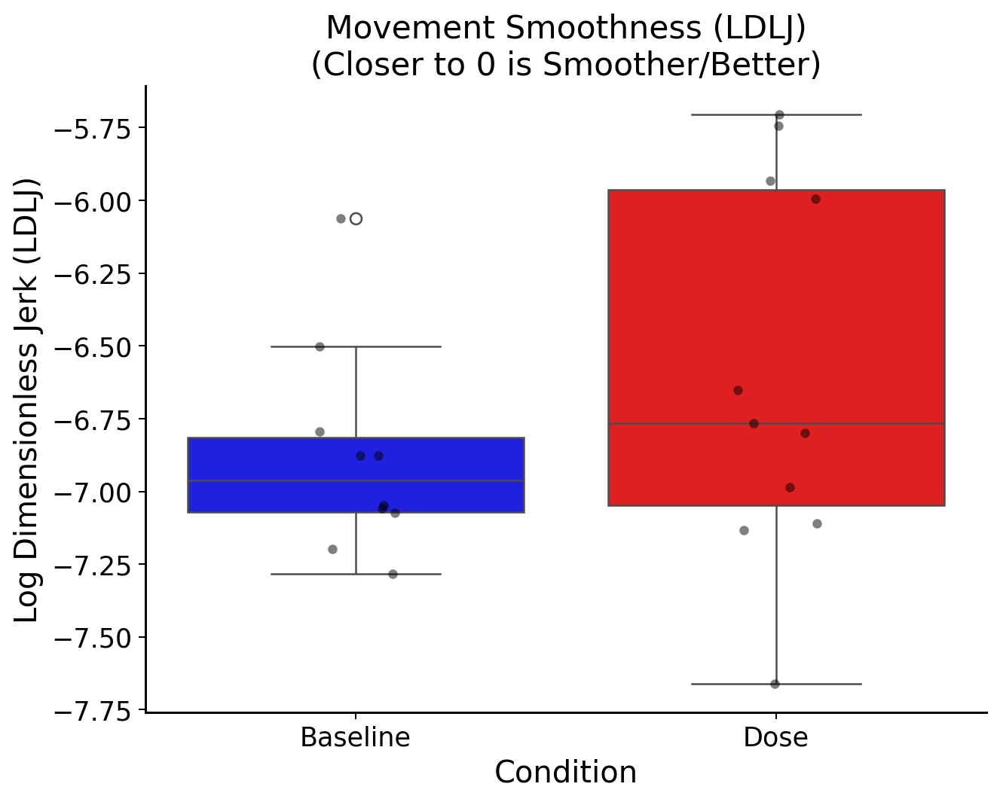

In [76]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter, find_peaks

def calculate_segmented_ldlj(pca_scores, labels, pids, dt=1/30):
    """
    1. Splits continuous data into individual reaches (segments).
    2. Calculates LDLJ for each reach.
    3. Aggregates results per Condition and PID.
    """
    results = []
    
    # Extract global position (PC1)
    x_all = pca_scores[:, 0]
    
    unique_pids = np.unique(pids)
    
    for pid in unique_pids:
        for cond in ['Baseline', 'Dose']:
            # 1. Isolate the data for this person/condition
            mask = (pids == pid) & (labels == cond)
            if np.sum(mask) == 0: continue
            
            traj_x = x_all[mask]
            
            # 2. Smooth and get Velocity (Speed)
            # Need speed (magnitude of velocity) to find stops
            if len(traj_x) < 30: continue 
            traj_x_smooth = savgol_filter(traj_x, 15, 3)
            vel = np.gradient(traj_x_smooth, dt)
            speed = np.abs(vel)
            
            # 3. SEGMENTATION: Find the "Stops" (Minimum Velocity)
            # Inverted speed helps find_peaks locate the 'valleys' (stops)
            # prominence controls how distinct the stop must be to count
            inverted_speed = -speed 
            stops, _ = find_peaks(inverted_speed, prominence=0.5, distance=15)
            
            # If no clear stops found, skip
            if len(stops) < 2:
                print(f"Skipping {pid} {cond}: Could not segment reaches.")
                continue

            # 4. Loop through each "Reach" (segment between two stops)
            cond_ldlj_scores = []
            
            for i in range(len(stops) - 1):
                start = stops[i]
                end = stops[i+1]
                
                # Extract segment data
                seg_x = traj_x_smooth[start:end]
                
                # --- LDLJ CALCULATION FOR THIS SEGMENT ---
                duration = (end - start) * dt
                if duration < 0.2: continue # Skip noise/micro-movements
                
                seg_v = np.gradient(seg_x, dt)
                seg_a = np.gradient(seg_v, dt)
                seg_j = np.gradient(seg_a, dt)
                
                v_peak = np.max(np.abs(seg_v))
                if v_peak < 0.1: continue # Skip if they didn't really move
                
                # LDLJ Formula
                # integral(jerk^2) approx sum(jerk^2) * dt
                int_jerk_sq = np.sum(seg_j**2) * dt
                dimensionless_jerk = (int_jerk_sq * (duration**3)) / (v_peak**2)
                
                ldlj = -np.log(dimensionless_jerk)
                cond_ldlj_scores.append(ldlj)
            
            # 5. Store the MEAN score for this condition
            if len(cond_ldlj_scores) > 0:
                mean_ldlj = np.mean(cond_ldlj_scores)
                results.append({
                    'PID': pid,
                    'Condition': cond,
                    'LDLJ': mean_ldlj,
                    'Reaches_Counted': len(cond_ldlj_scores)
                })

    return pd.DataFrame(results)

# --- RUN AND PLOT ---
df_smoothness = calculate_segmented_ldlj(X_frame_pca, frame_labels_arr, frame_pids_arr)

print(df_smoothness.groupby('Condition')['LDLJ'].describe())

# VISUALIZATION
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_smoothness, x='Condition', y='LDLJ', palette={'Baseline': 'blue', 'Dose': 'red'})
sns.stripplot(data=df_smoothness, x='Condition', y='LDLJ', color='black', alpha=0.5, jitter=True)
plt.title("Movement Smoothness (LDLJ)\n(Closer to 0 is Smoother/Better)")
plt.ylabel("Log Dimensionless Jerk (LDLJ)")
plt.show()

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.decomposition import PCA



# 1. Aggregate Data for Global Visualization
all_base_centroids = []
all_dose_centroids = []
# For Manifold analysis, we need centered, flattened raw data
all_base_flat_centered = []
all_dose_flat_centered = []


for pid in participants_with_both:
    # Centroids
    try:
        hand_timeseries[pid]['Baseline']
        hand_timeseries[pid]['Dose']
    except KeyError:
        continue  # Skip participants without both conditions
    
    # Raw flattened data for PCA
    raw_b = np.array(hand_timeseries[pid]['Baseline']['hand'])
    raw_d = np.array(hand_timeseries[pid]['Dose']['hand'])

    # Check for NaNs
    if np.isnan(raw_b).any() or np.isnan(raw_d).any():
        print(f"Skipping {pid} due to NaNs in data")
        continue

    c_base = get_hand_centroid(hand_timeseries[pid]['Baseline']['hand'])
    c_dose = get_hand_centroid(hand_timeseries[pid]['Dose']['hand'])
    all_base_centroids.append(c_base)
    all_dose_centroids.append(c_dose)
    
    flat_b = raw_b.reshape(raw_b.shape[0], -1)
    flat_d = raw_d.reshape(raw_d.shape[0], -1)
    # Center per participant to remove drift from manifold analysis
    all_base_flat_centered.append(flat_b - np.mean(flat_b, axis=0))
    all_dose_flat_centered.append(flat_d - np.mean(flat_d, axis=0))

X_base_cent = np.concatenate(all_base_centroids)
X_dose_cent = np.concatenate(all_dose_centroids)
X_base_flat = np.concatenate(all_base_flat_centered)
X_dose_flat = np.concatenate(all_dose_flat_centered)

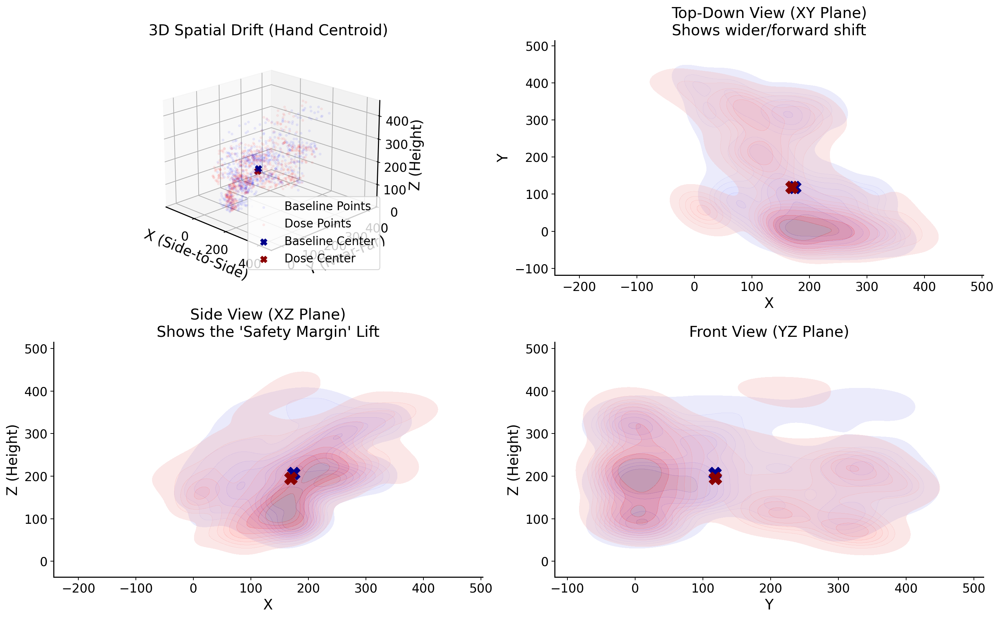

In [78]:
fig = plt.figure(figsize=(16, 10))

# --- 1. Main 3D Plot ---
ax3d = fig.add_subplot(2, 2, 1, projection='3d')

# Subsample points for cleaner plotting if too dense
step = 5
ax3d.scatter(X_base_cent[::step, 0], X_base_cent[::step, 1], X_base_cent[::step, 2], 
             c='blue', alpha=0.05, s=5, label='Baseline Points')
ax3d.scatter(X_dose_cent[::step, 0], X_dose_cent[::step, 1], X_dose_cent[::step, 2], 
             c='red', alpha=0.05, s=5, label='Dose Points')

# Plot Mean Centers
mean_b = np.mean(X_base_cent, axis=0)
mean_d = np.mean(X_dose_cent, axis=0)
ax3d.scatter(mean_b[0], mean_b[1], mean_b[2], c='darkblue', marker='X', s=50, label='Baseline Center', depthshade=False)
ax3d.scatter(mean_d[0], mean_d[1], mean_d[2], c='darkred', marker='X', s=50, label='Dose Center', depthshade=False)

# Draw Drift Vector connecting centers
ax3d.plot([mean_b[0], mean_d[0]], [mean_b[1], mean_d[1]], [mean_b[2], mean_d[2]], 
          c='black', linewidth=3, linestyle='--')

ax3d.set_title("3D Spatial Drift (Hand Centroid)")
ax3d.set_xlabel('X (Side-to-Side)'); ax3d.set_ylabel('Y (Near-Far)'); ax3d.set_zlabel('Z (Height)')
ax3d.legend()
ax3d.view_init(elev=20., azim=-45) # Adjust view to see the lift

# --- 2. 2D Projections (To see the Z-lift clearly) ---

# XY Plane (Top Down View)
ax_xy = fig.add_subplot(2, 2, 2)
sns.kdeplot(x=X_base_cent[:,0], y=X_base_cent[:,1], ax=ax_xy, color='blue', fill=True, alpha=0.3)
sns.kdeplot(x=X_dose_cent[:,0], y=X_dose_cent[:,1], ax=ax_xy, color='red', fill=True, alpha=0.3)
ax_xy.scatter(mean_b[0], mean_b[1], c='darkblue', marker='X', s=200)
ax_xy.scatter(mean_d[0], mean_d[1], c='darkred', marker='X', s=200)
ax_xy.set_title("Top-Down View (XY Plane)\nShows wider/forward shift")
ax_xy.set_xlabel('X'); ax_xy.set_ylabel('Y')

# XZ Plane (Side View - The critical one for height)
ax_xz = fig.add_subplot(2, 2, 3)
sns.kdeplot(x=X_base_cent[:,0], y=X_base_cent[:,2], ax=ax_xz, color='blue', fill=True, alpha=0.3)
sns.kdeplot(x=X_dose_cent[:,0], y=X_dose_cent[:,2], ax=ax_xz, color='red', fill=True, alpha=0.3)
ax_xz.scatter(mean_b[0], mean_b[2], c='darkblue', marker='X', s=200)
ax_xz.scatter(mean_d[0], mean_d[2], c='darkred', marker='X', s=200)
ax_xz.set_title("Side View (XZ Plane)\nShows the 'Safety Margin' Lift")
ax_xz.set_xlabel('X'); ax_xz.set_ylabel('Z (Height)')

# YZ Plane (Front View)
ax_yz = fig.add_subplot(2, 2, 4)
sns.kdeplot(x=X_base_cent[:,1], y=X_base_cent[:,2], ax=ax_yz, color='blue', fill=True, alpha=0.3)
sns.kdeplot(x=X_dose_cent[:,1], y=X_dose_cent[:,2], ax=ax_yz, color='red', fill=True, alpha=0.3)
ax_yz.scatter(mean_b[1], mean_b[2], c='darkblue', marker='X', s=200)
ax_yz.scatter(mean_d[1], mean_d[2], c='darkred', marker='X', s=200)
ax_yz.set_title("Front View (YZ Plane)")
ax_yz.set_xlabel('Y'); ax_yz.set_ylabel('Z (Height)')

plt.tight_layout()
plt.show()

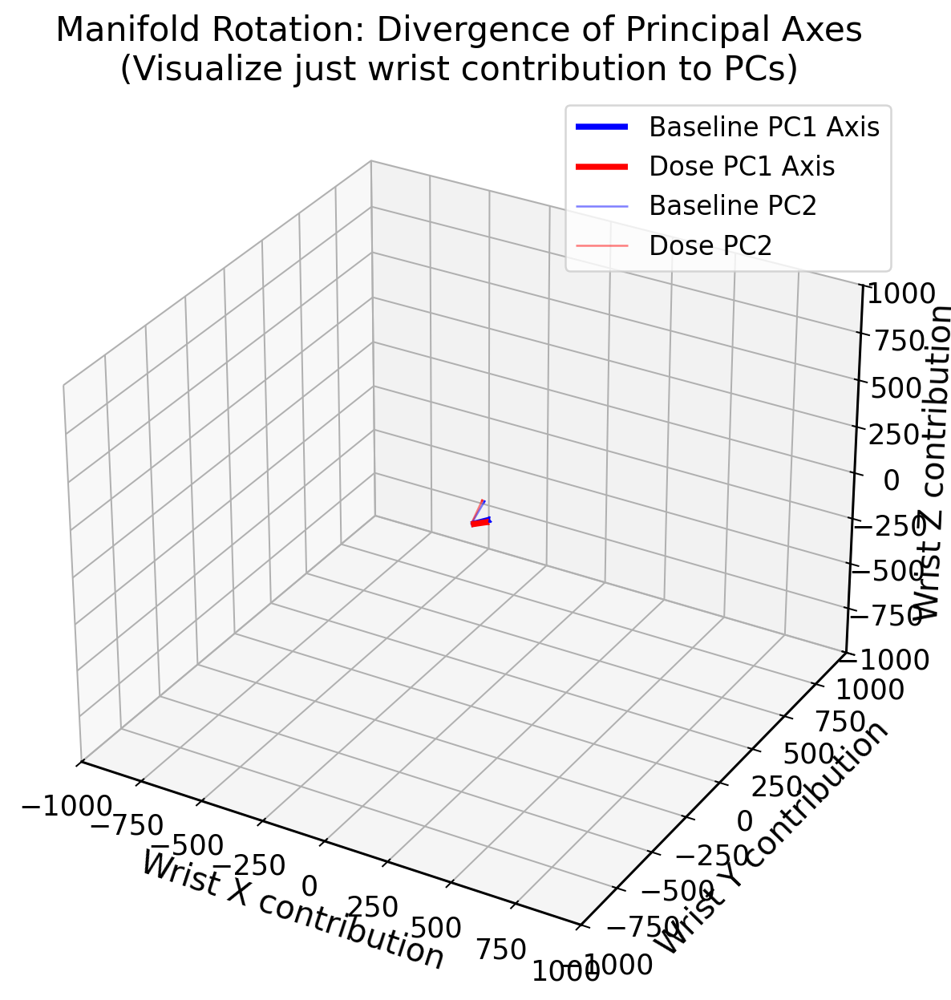

In [79]:

# 1. Fit separate PCAs on the centered data
# We only need the top 2-3 components to see the main manifold orientation
pca_base_struct = PCA(n_components=3).fit(X_base_flat)
pca_dose_struct = PCA(n_components=3).fit(X_dose_flat)

# Get the eigenvectors (the directions of the axes)
# Shape: (n_components, n_features)
vecs_base = pca_base_struct.components_
vecs_dose = pca_dose_struct.components_

# We can't easily plot 63D vectors.
# But we know the rotation is largely driven by the WRIST.
# Let's visualize the PC1 vector's contribution to the Wrist coordinates (Indices 0, 1, 2 for x,y,z)
wrist_idx = [0,1 ,2, ]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

origin = np.array([0, 0, 0])

# Plot Baseline PC1 (Blue)
# We scale it up for visibility
scale_factor = 1000
ax.quiver(origin[0], origin[1], origin[2], 
          vecs_base[0, wrist_idx[0]], vecs_base[0, wrist_idx[1]], vecs_base[0, wrist_idx[2]],
          color='blue', linewidth=3, arrow_length_ratio=0.1, length=scale_factor, label='Baseline PC1 Axis')

# Plot Dose PC1 (Red)
ax.quiver(origin[0], origin[1], origin[2], 
          vecs_dose[0, wrist_idx[0]], vecs_dose[0, wrist_idx[1]], vecs_dose[0, wrist_idx[2]],
          color='red', linewidth=3, arrow_length_ratio=0.1, length=scale_factor, label='Dose PC1 Axis')

# Add PC2 for context (thinner lines)
ax.quiver(origin[0], origin[1], origin[2], 
          vecs_base[1, wrist_idx[0]], vecs_base[1, wrist_idx[1]], vecs_base[1, wrist_idx[2]],
          color='blue', linewidth=1, arrow_length_ratio=0.1, length=scale_factor*0.7, alpha=0.5, label='Baseline PC2')
ax.quiver(origin[0], origin[1], origin[2], 
          vecs_dose[1, wrist_idx[0]], vecs_dose[1, wrist_idx[1]], vecs_dose[1, wrist_idx[2]],
          color='red', linewidth=1, arrow_length_ratio=0.1, length=scale_factor*0.7, alpha=0.5, label='Dose PC2')


ax.set_xlim([-scale_factor, scale_factor])
ax.set_ylim([-scale_factor, scale_factor])
ax.set_zlim([-scale_factor, scale_factor])
ax.set_xlabel('Wrist X contribution'); ax.set_ylabel('Wrist Y contribution'); ax.set_zlabel('Wrist Z contribution')
ax.set_title("Manifold Rotation: Divergence of Principal Axes\n(Visualize just wrist contribution to PCs)")
ax.legend()
plt.show()

Preparing Frame-Level PCA...
Skipping HC14 Baseline due to NaNs
Frame PCA Variance Explained: [0.5673904  0.29006471 0.12798574]
--- Multi-Dimensional Dynamical Analysis (Corrected) ---


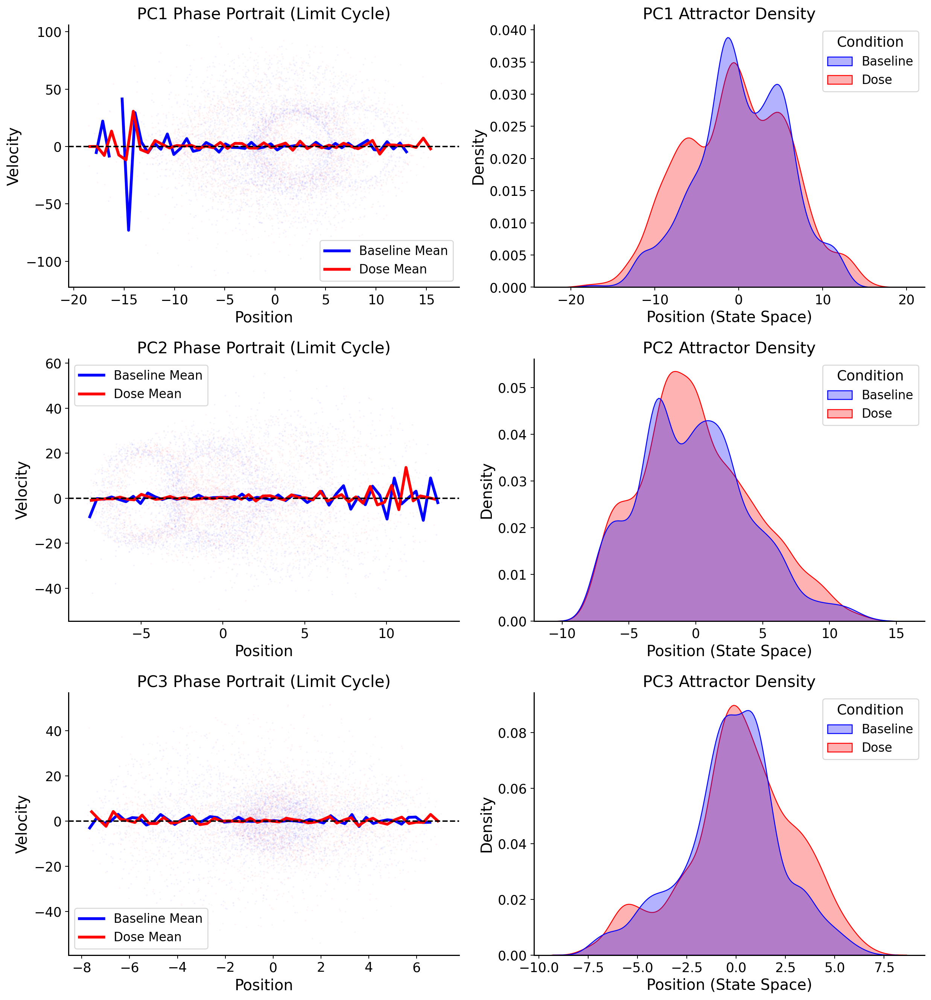

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.signal import savgol_filter
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 0. Ensure we have the correct frame-level data first
# (Recalculating Frame PCA here to ensure we have the variables ready)
def prepare_and_run_frame_pca(hand_timeseries):
    print("Preparing Frame-Level PCA...")
    frame_data = []
    meta = []

    for pid in hand_timeseries.keys():
        for cond in ['Baseline', 'Dose']:
            if cond in hand_timeseries[pid]:
                # Get raw data (350, 21, 3)
                raw = np.array(hand_timeseries[pid][cond]['hand'])

                # Check for NaNs
                if np.isnan(raw).any():
                    print(f"Skipping {pid} {cond} due to NaNs")
                    continue
                # Flatten spatial dims only: (350, 63)
                flat = raw.reshape(raw.shape[0], -1)
                
                frame_data.append(flat)
                # Store metadata to reconstruct trials later
                for t in range(350):
                    meta.append({'PID': pid, 'Condition': cond, 'Time': t})

    # Stack all frames: (N_samples * 350, 63)
    X_frames = np.vstack(frame_data)
    df_meta = pd.DataFrame(meta)
    
    # Run PCA on frames
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_frames)
    pca = PCA(n_components=10)
    X_frame_pca = pca.fit_transform(X_scaled)
    
    print(f"Frame PCA Variance Explained: {pca.explained_variance_ratio_[:3]}")
    return X_frame_pca, df_meta

# 1. Run the preparation (if not already done)
X_frame_pca, df_meta = prepare_and_run_frame_pca(hand_timeseries)


# 2. Run the Dynamical Analysis using FRAME PCA
def analyze_multidim_dynamics_corrected(pca_scores, meta_df, dt=1/30):
    print("--- Multi-Dimensional Dynamical Analysis (Corrected) ---")
    
    # Parameters
    window_length = 15
    poly_order = 3
    
    # Prepare storage
    phase_data_list = []
    
    # We must loop through unique trials to differentiate continuous time series
    # Group by PID and Condition so we isolate one contiguous trial
    grouped = meta_df.groupby(['PID', 'Condition'])
    
    for (pid, cond), group_indices in grouped:
        # Get the indices for this specific trial
        indices = group_indices.index.to_numpy()
        
        # Sort by time just in case (though it should be sorted)
        indices = indices[np.argsort(meta_df.loc[indices, 'Time'])]
        
        # Extract the PC scores for this trial (Time, PC_dims)
        # We look at PC1, PC2, PC3
        trial_scores = pca_scores[indices, :3]
        
        # Calculate dynamics for this single trial
        for pc_idx in range(3):
            x = trial_scores[:, pc_idx]
            
            # Smooth & Differentiate
            x_smooth = savgol_filter(x, window_length, poly_order)
            v = np.gradient(x_smooth, dt)
            a = np.gradient(v, dt) # Acceleration
            
            # Store
            for i in range(len(indices)):
                phase_data_list.append({
                    'PID': pid,
                    'Condition': cond,
                    'PC': f'PC{pc_idx+1}',
                    'x': x_smooth[i],
                    'v': v[i],
                    'a': a[i]
                })

    df_phase = pd.DataFrame(phase_data_list)
    
    # --- Visualization ---
    fig, axes = plt.subplots(3, 2, figsize=(14, 15))
    
    for pc_idx in range(3):
        pc_name = f'PC{pc_idx+1}'
        subset = df_phase[df_phase['PC'] == pc_name]
        
        # 1. Phase Portrait (Left)
        ax_phase = axes[pc_idx, 0]
        
        # Plot individual trajectories (light)
        sns.scatterplot(
            data=subset, x='x', y='v', hue='Condition', 
            style='Condition', alpha=0.05, s=3, ax=ax_phase, 
            palette={'Baseline': 'blue', 'Dose': 'red'}, legend=False, rasterized=True
        )
        
        # Plot Mean Cycles (Thick lines)
        for cond, color in zip(['Baseline', 'Dose'], ['blue', 'red']):
            cond_subset = subset[subset['Condition'] == cond]
            # Create mean limit cycle using binning
            bins = np.linspace(cond_subset['x'].min(), cond_subset['x'].max(), 50)
            digitized = np.digitize(cond_subset['x'], bins)
            
            # Calculate mean velocity for each position bin
            mean_v = [cond_subset['v'][digitized == i].mean() for i in range(1, len(bins))]
            bin_centers = 0.5 * (bins[:-1] + bins[1:])
            
            ax_phase.plot(bin_centers, mean_v, color=color, linewidth=3, label=f'{cond} Mean')
            
        ax_phase.set_title(f"{pc_name} Phase Portrait (Limit Cycle)")
        ax_phase.set_ylabel("Velocity")
        ax_phase.set_xlabel("Position")
        ax_phase.axhline(0, color='k', linestyle='--')
        ax_phase.legend()
        
        # 2. Attractor Distribution (Right)
        # Where does the hand spend the most time? (Fixed Points)
        ax_dist = axes[pc_idx, 1]
        sns.kdeplot(data=subset, x='x', hue='Condition', ax=ax_dist, 
                   fill=True, alpha=0.3, palette={'Baseline': 'blue', 'Dose': 'red'})
        ax_dist.set_title(f"{pc_name} Attractor Density")
        ax_dist.set_xlabel("Position (State Space)")

    plt.tight_layout()
    plt.show()
    
    return df_phase

# Run corrected analysis
df_dynamics = analyze_multidim_dynamics_corrected(X_frame_pca, df_meta)

# Summary

This notebook runs a comprehensive dimensionality and dynamical analysis of hand kinematics during the Box & Block task. The short summary below highlights the main findings, key tests, and where to look for numeric outputs and figures.

## ✅ Data overview
- **Samples:** See the printed counts in the PCA summary cell (`len(analysis_data['labels'])`, Baseline/Dose breakdown).
- **Paired participants:** `participants_with_both` contains IDs with both **Baseline** and **Dose** trials (no NaNs).

## 📊 PCA & Variance
- **Full-trajectory PCA** shows PC1 explains the largest variance; `n_90`, `n_95` print how many PCs reach 90%/95% variance.
- **Condition differences** were observed in mid-to-low variance components (e.g., **PC6** showed separation in tests reported above).

## 🔬 Bayesian tests
- **Participation Ratio** and **Reconstruction Ratio** were analyzed with PyMC (see `bayesian_dimensionality_tests` output).
- Posterior traces: `trace_dim_15mg`, `trace_dim_20mg`, `trace_dim_all` — check printed HDIs and P(Effect) summaries.

## 🧭 Manifold, Clustering & Separability
- **Hierarchical clustering** groups more by participant identity than by condition (see `plots/hierarchical_clustering_dendrograms.png`).
- **Kernel PCA / LDA** show limited discriminability; `check_separability_lda` prints cross-validated accuracy.

## ⏱ Temporal & Dynamical analysis
- **Frame-level PCA** captures temporal cycles (see variance printed for frame PCs).
- **Phase portraits** and **vector fields** indicate dose-related changes in limit cycles and stiffness; stiffness estimates are printed in the dynamical analysis cell.

## 🧪 VAE & Latent analyses
- A VAE was trained to learn latent embeddings (`z_latent_np`). There was **no strong condition separation** in the latent space plots.

## ✋ Landmark-level deviations
- `analyze_deviation_by_landmark` identifies landmarks contributing most to manifold deviation; barplot visualizes relative contributions.

## ↔️ Spatial / Drift analysis
- Centroid shift, workspace volume ratio, and distribution differences are computed in `quantify_trajectory_shift` and plotted in 3D/2D projections.

## ▶️ Next steps & checks
- Re-run final cells to refresh numeric summaries after any data or preprocessing changes.
- Use `participants_with_both` for paired analyses and for drawing Baseline→Dose arrows in t-SNE and manifold plots.
- If you want, I can add automated assertions (e.g., raise a warning if `participants_with_both` is empty) or insert numeric summaries (means / HDIs) directly into this summary.
> Note: For exact numeric values, HDIs, and plots, refer to the printed outputs and saved figures (PNG files) earlier in the notebook.

In [81]:
# === Summary: Print computed results ===
# This cell prints the variables / results computed throughout the notebook.
import numpy as np
import pandas as pd
import warnings

print('\n=== SUMMARY: Computed Results (selected) ===\n')

# Data overview
try:
    total = len(analysis_data['labels'])
    n_base = int(np.sum(analysis_data['labels'] == 'Baseline'))
    n_dose = int(np.sum(analysis_data['labels'] == 'Dose'))
    print(f"Data samples: total={total}, Baseline={n_base}, Dose={n_dose}")
except Exception as e:
    print('analysis_data not available:', e)

# Participants
try:
    print(f"Participants with both conditions (n={len(participants_with_both)}):")
    print(participants_with_both)
except Exception as e:
    print('participants_with_both not available:', e)

# PCA variance
try:
    print('\nPCA variance (first 10 PCs):')
    print(np.round(var_explained[:10] * 100, 3))
    print(f"Components for 90%/95%/99%: {n_90}/{n_95}/{n_99}")
except Exception as e:
    print('PCA variance variables not available:', e)

# PC statistics (t-tests & Mann-Whitney)
from scipy.stats import ttest_ind, mannwhitneyu
try:
    max_pc = min(8, X_traj_pca.shape[1])
    print('\nPC statistics (Baseline vs Dose):')
    for pc in range(max_pc):
        baseline_vals = X_traj_pca[baseline_mask, pc]
        dose_vals = X_traj_pca[dose_mask, pc]
        t_stat, p_t = ttest_ind(baseline_vals, dose_vals)
        u_stat, p_u = mannwhitneyu(baseline_vals, dose_vals, alternative='two-sided')
        print(f"PC{pc+1}: mean_base={baseline_vals.mean():.3f}, mean_dose={dose_vals.mean():.3f}, t_p={p_t:.4f}, mw_p={p_u:.4f}")
except Exception as e:
    print('PC stats not available:', e)

# Effect sizes
try:
    print('\nEffect sizes (Cohen\'s d) for first 8 PCs:')
    for i in range(min(8, len(effect_sizes_15mg))):
        print(f"PC{i+1}: 15mg d={effect_sizes_15mg[i]:+.3f}, 20mg d={effect_sizes_20mg[i]:+.3f}")
except Exception as e:
    print('Effect size variables not available:', e)

# Bayesian summaries for dimensionality tests
try:
    import arviz as az
    def summarize_trace(trace, label):
        print(f"\nBayesian summary: {label}")
        if 'mu_pr_diff' in trace.posterior:
            post = trace.posterior['mu_pr_diff'].values.flatten()
            hdi = az.hdi(trace, var_names=['mu_pr_diff'], hdi_prob=0.95)['mu_pr_diff'].values
            print(f" mu_pr_diff: mean={post.mean():.3f}, 95% HDI=[{hdi[0]:.3f}, {hdi[1]:.3f}], P(Dose<Baseline)={(post<0).mean()*100:.1f}%")
        if 'mean_recon_ratio' in trace.posterior:
            post_r = trace.posterior['mean_recon_ratio'].values.flatten()
            hdi_r = az.hdi(trace, var_names=['mean_recon_ratio'], hdi_prob=0.95)['mean_recon_ratio'].values
            print(f" mean_recon_ratio: mean={post_r.mean():.3f}, 95% HDI=[{hdi_r[0]:.3f}, {hdi_r[1]:.3f}], P(>1)={(post_r>1.0).mean()*100:.1f}%")

    if 'trace_dim_15mg' in globals():
        summarize_trace(trace_dim_15mg, '15mg')
    if 'trace_dim_20mg' in globals():
        summarize_trace(trace_dim_20mg, '20mg')
    if 'trace_dim_all' in globals():
        summarize_trace(trace_dim_all, 'All Doses')
except Exception as e:
    print('Bayesian trace summaries not available or failed:', e)

# Dimensionality DataFrames
try:
    for name, df in [('15mg', df_dim_15mg), ('20mg', df_dim_20mg), ('All', df_dim_all)]:
        print(f"\nDimensionality results ({name}): n={len(df)}")
        print(df.describe().loc[['mean','std']])
except Exception as e:
    print('Dimensionality DataFrames unavailable:', e)

# Landmark deviations (top contributors)
try:
    print('\nTop 5 landmarks by mean relative deviation (all participants):')
    landmark_mean = df_landmarks.groupby('Landmark')['Relative_Deviation'].mean().sort_values(ascending=False)
    print(landmark_mean.head(5))
except Exception as e:
    print('Landmark deviations not available:', e)

# Trajectory / Drift stats
try:
    print('\nTrajectory shift summary (df_traj):')
    print(df_traj.describe().loc[['mean','std']])
    print('\nDrift vector summary (mean ± se):')
    print(df_drift_vec[['Drift_X','Drift_Y','Drift_Z','Drift_Magnitude']].agg(['mean','sem']).to_string())
except Exception as e:
    print('Trajectory/drift results not available:', e)


# LDA separability (Group CV)
try:
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    from sklearn.model_selection import GroupKFold, cross_val_score
    lda = LinearDiscriminantAnalysis()
    n_groups = max(2, min(5, len(np.unique(analysis_data['participant_ids']))))
    gkf = GroupKFold(n_splits=n_groups)
    scores = cross_val_score(lda, X_traj_pca[:, :20], analysis_data['labels'], groups=analysis_data['participant_ids'], cv=gkf, scoring='accuracy')
    print(f"\nLDA (Group CV) accuracy: mean={scores.mean():.3f} ± std={scores.std():.3f} (n_splits={gkf.get_n_splits()})")
except Exception as e:
    print('LDA separability not available:', e)

# Stiffness estimates from dynamical phase data
try:
    print('\nStiffness estimates (from phase-space data):')
    stiffnesses = {}
    for cond in ['Baseline', 'Dose']:
        subset = df_phase[(df_phase['Condition'] == cond) & (np.abs(df_phase['v']) < 0.5)]
        if len(subset) >= 10:
            slope, intercept = np.polyfit(subset['x'], subset['a'], 1)
            k = -slope
            stiffnesses[cond] = k
            print(f" {cond}: stiffness k = {k:.3f} (n_points={len(subset)})")
        else:
            print(f" {cond}: insufficient points for stiffness fit (n={len(subset)})")
except Exception as e:
    print('Stiffness estimation not available:', e)

print('\n=== END OF SUMMARY PRINT ===')


=== SUMMARY: Computed Results (selected) ===

Data samples: total=21, Baseline=10, Dose=11
Participants with both conditions (n=10):
['HC01', 'HC02', 'HC03', 'HC04', 'HC08', 'HC09', 'HC10', 'HC11', 'HC12', 'HC13']

PCA variance (first 10 PCs):
[37.1   11.807  9.49   6.106  5.258  4.816  4.279  3.779  2.797  2.602]
Components for 90%/95%/99%: 11/15/19

PC statistics (Baseline vs Dose):
PC1: mean_base=-8.950, mean_dose=8.136, t_p=0.6842, mw_p=0.7513
PC2: mean_base=5.806, mean_dose=-5.278, t_p=0.6397, mw_p=0.6985
PC3: mean_base=-5.490, mean_dose=4.991, t_p=0.6213, mw_p=0.5974
PC4: mean_base=7.972, mean_dose=-7.247, t_p=0.3676, mw_p=0.3072
PC5: mean_base=2.496, mean_dose=-2.270, t_p=0.7633, mw_p=0.7513
PC6: mean_base=1.279, mean_dose=-1.163, t_p=0.8720, mw_p=0.8603
PC7: mean_base=3.409, mean_dose=-3.099, t_p=0.6480, mw_p=0.8603
PC8: mean_base=10.370, mean_dose=-9.428, t_p=0.1285, mw_p=0.1489

Effect sizes (Cohen's d) for first 8 PCs:
PC1: 15mg d=-0.231, 20mg d=+0.701
PC2: 15mg d=-0.300, 2

# Save stats to LaTeX file

In [82]:
# --- Update Stats Data File (Dimensionality) ---
import re
from scipy import stats
import arviz as az
import pandas as pd
import numpy as np

def update_dimensionality_stats(output_file_path):
    print(f"Updating {output_file_path} with Dimensionality results...")
    
    updates = {}
    
    # helper for formatting - round to 2 decimal places
    def to_str(val):
        return f"{val:.2f}"
    
    # Helper to calculate percent in ROPE
    def calc_pct_in_rope(samples, rope_low, rope_high):
        return np.mean((samples > rope_low) & (samples < rope_high)) * 100
    
    # --- 1. Identify Groups ---
    if 'analysis_data' in globals():
        # Get unique PIDs for each groups
        df_meta_local = pd.DataFrame({
            'pid': analysis_data['participant_ids'],
            'dose': analysis_data['dose_groups']
        }).drop_duplicates()
        
        pids_15 = df_meta_local[df_meta_local['dose'] == '15mg']['pid'].values
        pids_20 = df_meta_local[df_meta_local['dose'] == '20mg']['pid'].values
        pids_all = df_meta_local['pid'].values
    else:
        # print("Warning: 'analysis_data' not found. Cannot split stiffness by group.")
        pids_15, pids_20, pids_all = [], [], []

    # --- 2. Define Groups with Naming Convention ---
    # Structure: (LatexPrefix, LatexSuffix, DataFrameSuffix)
    # Variable Name constructed as: dim{LatexPrefix}{Metric}{LatexSuffix}
    # Example: 'Fifteen' + 'RE' + 'Hand' -> dimFifteenREHand
    # Example: 'Fifteen' + 'RE' + ''     -> dimFifteenRE
    
    groups = [
        ('Fifteen', '', '15mg'), 
        ('Twenty', '', '20mg'), 
        ('All', '', 'all'),
        ('Fifteen', 'Hand', '15mg_hand_frame'), 
        ('Twenty', 'Hand', '20mg_hand_frame'), 
        ('All', 'Hand', 'all_hand_frame')
    ]
    
    # --- 3. Extract Metrics ---
    
    for prefix, suffix, df_suffix in groups:
        # Determine variable names
        df_name = f"df_dim_{df_suffix.lower().replace(' all', 'all')}" # df_dim_15mg, df_dim_all
        trace_name = f"trace_dim_{df_suffix.lower().replace(' all', 'all')}" # trace_dim_15mg
        
        if df_name in globals():
            df = globals()[df_name]
            
            # Helper to add update if column exists
            def add_update(metric_col, metric_name, is_int=False):
                if metric_col in df.columns:
                    val = df[metric_col].mean()
                    if is_int:
                        val_str = str(int(round(val)))
                    else:
                        val_str = to_str(val)
                    updates[f"dim{prefix}{metric_name}{suffix}"] = val_str
            
            # Means from DataFrame
            add_update('PR_Base', 'PRBase')
            add_update('PR_Dose', 'PRDose')
            add_update('RMSIP', 'RMSIP')
            add_update('Recon_Ratio', 'RE')
            add_update('VAF', 'VAF')
            add_update('Amplitude_Ratio', 'AR')
            add_update('n_comps_used', 'K', is_int=True)

            # Difference (from Trace if possible, else DF)
            diff_key = f"dim{prefix}PRDiff{suffix}"
            if trace_name in globals():
                tr = globals()[trace_name]
                # Check if it's an InferenceData object with posterior
                if hasattr(tr, 'posterior') and 'mu_pr_diff' in tr.posterior:
                    diff_mean = tr.posterior['mu_pr_diff'].mean().values
                    updates[diff_key] = to_str(diff_mean)
                elif 'PR_Diff' in df.columns:
                    updates[diff_key] = to_str(df['PR_Diff'].mean())
            elif 'PR_Diff' in df.columns:
                updates[diff_key] = to_str(df['PR_Diff'].mean())
        else:
            print(f"Warning: {df_name} not found.")

    # --- 4. General / Global Params ---
    if 'df_dim_all' in globals():
        updates['dimRMSIP'] = to_str(globals()['df_dim_all']['RMSIP'].mean())

    # --- 5. ROPE Values ---
    # Calculate and save the ROPE limits used in the analysis
    if 'rope_pr_limits' in globals():
        rope_pr = globals()['rope_pr_limits']
        updates['dimRopePRLow'] = to_str(rope_pr[0])
        updates['dimRopePRHigh'] = to_str(rope_pr[1])
    elif 'df_dim_all' in globals():
        # Fallback: calculate if not already in globals
        baseline_std = globals()['df_dim_all']['PR_Base'].std()
        pr_rope_limit = max(0.2 * baseline_std, 0.1)
        rope_pr = (-pr_rope_limit, pr_rope_limit)
        updates['dimRopePRLow'] = to_str(-pr_rope_limit)
        updates['dimRopePRHigh'] = to_str(pr_rope_limit)
    else:
        rope_pr = (-0.1, 0.1)  # Default
    
    # VAF Functional Zone
    if 'vaf_functional_zone' in globals():
        vaf_zone = globals()['vaf_functional_zone']
        updates['dimRopeVAFLow'] = to_str(vaf_zone[0])
        updates['dimRopeVAFHigh'] = to_str(vaf_zone[1])
    else:
        # Default functional zone
        vaf_zone = (0.90, 1.00)
        updates['dimRopeVAFLow'] = '0.90'
        updates['dimRopeVAFHigh'] = '1.00'

    # --- 6. Bayesian Posterior Statistics ---
    # Extract statistics from Bayesian traces if available
    
    # World Frame - separate dose groups (15mg, 20mg)
    if 'trace_world' in globals() and hasattr(globals()['trace_world'], 'posterior'):
        trace = globals()['trace_world']
        if 'mu_pr_group' in trace.posterior:
            # Extract PR difference posterior for each group
            mu_pr = trace.posterior['mu_pr_group'].values
            for i, dose in enumerate(['Fifteen', 'Twenty']):
                samples = mu_pr[:, :, i].flatten()
                updates[f"dim{dose}PRDiffPost"] = to_str(samples.mean())
                updates[f"dim{dose}PRDiffPostHDILow"] = to_str(np.percentile(samples, 2.5))
                updates[f"dim{dose}PRDiffPostHDIHigh"] = to_str(np.percentile(samples, 97.5))
                # Percent in ROPE for PR
                pct_in_rope_pr = calc_pct_in_rope(samples, rope_pr[0], rope_pr[1])
                updates[f"dim{dose}PRPctInRope"] = to_str(pct_in_rope_pr)
        
        if 'estimated_vaf_group' in trace.posterior:
            # Extract VAF posterior for each group
            vaf = trace.posterior['estimated_vaf_group'].values
            for i, dose in enumerate(['Fifteen', 'Twenty']):
                samples = vaf[:, :, i].flatten()
                updates[f"dim{dose}VAFPost"] = to_str(samples.mean())
                updates[f"dim{dose}VAFPostHDILow"] = to_str(np.percentile(samples, 2.5))
                updates[f"dim{dose}VAFPostHDIHigh"] = to_str(np.percentile(samples, 97.5))
                # Percent in functional zone for VAF
                pct_in_zone_vaf = calc_pct_in_rope(samples, vaf_zone[0], vaf_zone[1])
                updates[f"dim{dose}VAFPctInZone"] = to_str(pct_in_zone_vaf)
    
    # Hand Frame - separate dose groups (15mg, 20mg)
    if 'trace_hand' in globals() and hasattr(globals()['trace_hand'], 'posterior'):
        trace = globals()['trace_hand']
        if 'mu_pr_group' in trace.posterior:
            mu_pr = trace.posterior['mu_pr_group'].values
            for i, dose in enumerate(['Fifteen', 'Twenty']):
                samples = mu_pr[:, :, i].flatten()
                updates[f"dim{dose}PRDiffPostHand"] = to_str(samples.mean())
                updates[f"dim{dose}PRDiffPostHDILowHand"] = to_str(np.percentile(samples, 2.5))
                updates[f"dim{dose}PRDiffPostHDIHighHand"] = to_str(np.percentile(samples, 97.5))
                # Percent in ROPE for PR
                pct_in_rope_pr = calc_pct_in_rope(samples, rope_pr[0], rope_pr[1])
                updates[f"dim{dose}PRPctInRopeHand"] = to_str(pct_in_rope_pr)
        
        if 'estimated_vaf_group' in trace.posterior:
            vaf = trace.posterior['estimated_vaf_group'].values
            for i, dose in enumerate(['Fifteen', 'Twenty']):
                samples = vaf[:, :, i].flatten()
                updates[f"dim{dose}VAFPostHand"] = to_str(samples.mean())
                updates[f"dim{dose}VAFPostHDILowHand"] = to_str(np.percentile(samples, 2.5))
                updates[f"dim{dose}VAFPostHDIHighHand"] = to_str(np.percentile(samples, 97.5))
                # Percent in functional zone for VAF
                pct_in_zone_vaf = calc_pct_in_rope(samples, vaf_zone[0], vaf_zone[1])
                updates[f"dim{dose}VAFPctInZoneHand"] = to_str(pct_in_zone_vaf)
    
    # World Frame - All doses combined
    if 'trace_world_all' in globals() and hasattr(globals()['trace_world_all'], 'posterior'):
        trace_all = globals()['trace_world_all']
        if 'mu_pr_overall' in trace_all.posterior:
            samples = trace_all.posterior['mu_pr_overall'].values.flatten()
            updates['dimAllPRDiffPost'] = to_str(samples.mean())
            updates['dimAllPRDiffPostHDILow'] = to_str(np.percentile(samples, 2.5))
            updates['dimAllPRDiffPostHDIHigh'] = to_str(np.percentile(samples, 97.5))
            # Percent in ROPE for PR
            pct_in_rope_pr = calc_pct_in_rope(samples, rope_pr[0], rope_pr[1])
            updates['dimAllPRPctInRope'] = to_str(pct_in_rope_pr)
        
        if 'estimated_vaf_overall' in trace_all.posterior:
            samples = trace_all.posterior['estimated_vaf_overall'].values.flatten()
            updates['dimAllVAFPost'] = to_str(samples.mean())
            updates['dimAllVAFPostHDILow'] = to_str(np.percentile(samples, 2.5))
            updates['dimAllVAFPostHDIHigh'] = to_str(np.percentile(samples, 97.5))
            # Percent in functional zone for VAF
            pct_in_zone_vaf = calc_pct_in_rope(samples, vaf_zone[0], vaf_zone[1])
            updates['dimAllVAFPctInZone'] = to_str(pct_in_zone_vaf)
    
    # Hand Frame - All doses combined
    if 'trace_hand_all' in globals() and hasattr(globals()['trace_hand_all'], 'posterior'):
        trace_all = globals()['trace_hand_all']
        if 'mu_pr_overall' in trace_all.posterior:
            samples = trace_all.posterior['mu_pr_overall'].values.flatten()
            updates['dimAllPRDiffPostHand'] = to_str(samples.mean())
            updates['dimAllPRDiffPostHDILowHand'] = to_str(np.percentile(samples, 2.5))
            updates['dimAllPRDiffPostHDIHighHand'] = to_str(np.percentile(samples, 97.5))
            # Percent in ROPE for PR
            pct_in_rope_pr = calc_pct_in_rope(samples, rope_pr[0], rope_pr[1])
            updates['dimAllPRPctInRopeHand'] = to_str(pct_in_rope_pr)
        
        if 'estimated_vaf_overall' in trace_all.posterior:
            samples = trace_all.posterior['estimated_vaf_overall'].values.flatten()
            updates['dimAllVAFPostHand'] = to_str(samples.mean())
            updates['dimAllVAFPostHDILowHand'] = to_str(np.percentile(samples, 2.5))
            updates['dimAllVAFPostHDIHighHand'] = to_str(np.percentile(samples, 97.5))
            # Percent in functional zone for VAF
            pct_in_zone_vaf = calc_pct_in_rope(samples, vaf_zone[0], vaf_zone[1])
            updates['dimAllVAFPctInZoneHand'] = to_str(pct_in_zone_vaf)

    # --- 7. Write to File ---
    try:
        with open(output_file_path, 'r') as f:
            content = f.read()
            
        count_updated = 0
        new_commands = []
        
        sorted_keys = sorted(updates.keys()) # Sort for consistent file output
        
        for var_name in sorted_keys:
            new_value = updates[var_name]
            
            # Regex to find \newcommand{\varName}{oldValue}
            escaped_var = re.escape(var_name)
            pattern = re.compile(r'(\\newcommand\{\\' + escaped_var + r'\}\{)(.*?)(\})')
            
            if pattern.search(content):
                # Use explicit group references \g<1> and \g<3>
                content = pattern.sub(r'\g<1>' + new_value + r'\g<3>', content)
                count_updated += 1
            else:
                # Prepare new command string
                new_commands.append(f"\\newcommand{{\\{var_name}}}{{{new_value}}}")

        # Insert new commands if any
        if new_commands:
            print(f"Adding {len(new_commands)} new variables...")
            new_block = "\n% --- Auto-generated Dimensionality Vars ---\n" + "\n".join(new_commands) + "\n"
            
            # Try to find the section header to insert after
            section_header = "% 3. DIMENSIONALITY & COMPLEXITY (Table 2 & Text)"
            if section_header in content:
                # Find the location of the header
                idx = content.find(section_header)
                # Find the end of the line/block to insert safely
                # simplified: insert at header + len + newline
                # Find the newline after the header
                header_end_idx = content.find('\n', idx)
                if header_end_idx != -1:
                    content = content[:header_end_idx+1] + new_block + content[header_end_idx+1:]
                else:
                    content += new_block
            else:
                # Append to end if section not found
                content += "\n" + new_block
        
        with open(output_file_path, 'w') as f:
            f.write(content)
            
        print(f"Successfully updated {count_updated} variables and added {len(new_commands)} new variables in {output_file_path}")
        
    except FileNotFoundError:
        print(f"Error: File {output_file_path} not found.")

# Execute
update_dimensionality_stats('stats_data.txt')

Updating stats_data.txt with Dimensionality results...
Successfully updated 101 variables and added 0 new variables in stats_data.txt
